In [1]:
pip install dython

In [2]:
pip install scikit-plot

In [3]:
from google.colab import drive
drive.mount ('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [4]:
import pandas as pd

import numpy as np 
import regex as re

import matplotlib.pyplot as plt
# import matplotlib.artist as art
% matplotlib inline
import matplotlib.lines as lines
import seaborn as sns

# # Import LazyPredict libraries
# import lazypredict
# from lazypredict.Supervised import LazyClassifier

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import OneHotEncoder

# from sklearn.pipeline import make_pipeline
from xgboost import XGBRFRegressor
from xgboost import plot_importance
from sklearn.pipeline import Pipeline

from sklearn.compose import ColumnTransformer


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score, mean_absolute_error
from sklearn.model_selection import validation_curve


from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Ridge



from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import TimeSeriesSplit


from sklearn import metrics

from sklearn.metrics import accuracy_score

from numpy import mean
from numpy import std
from scipy.stats import sem


from sklearn import set_config

import scikitplot as skplt

from dython.nominal import associations

# from datetime import datetime



In [5]:
# import warnings
# warnings.filterwarnings('ignore')

In [6]:
df = pd.read_csv('/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/df_institutional_data_allyrs.csv', parse_dates=['YEAR'])
# https://towardsdatascience.com/4-tricks-you-should-know-to-parse-date-columns-with-pandas-read-csv-27355bb2ad0e#:~:text=By%20default%2C%20the%20argument%20parse_dates,%2C%20or%20DD%2DMM).

In [7]:
df['YEAR'] = df['YEAR'].dt.year

In [8]:
df.shape

(34559, 53)

In [9]:
df.head()

,YEAR,UNITID,STABBR,INSTNM,OBEREG,HDEGOFFR,GROFFER,HBCU,LOCALE,INSTCAT,...,ADMCON3,ADMCON4,ADMCON5,ADMCON6,ADMCON7,ADMCON8,ADMCON9,SATNUM,ACTNUM,EFYTOTLT
0,2015,100654,AL,Alabama A & M University,5,12,1,1,12,2,...,1,2,3,2,1,1,3,136,1375,4549
1,2015,100663,AL,University of Alabama at Birmingham,5,11,1,2,12,2,...,1,1,3,3,1,3,3,106,1497,13465
2,2015,100690,AL,Amridge University,5,12,1,2,12,2,...,0,0,0,0,0,0,0,0,0,401
3,2015,100706,AL,University of Alabama in Huntsville,5,11,1,2,12,2,...,1,1,3,2,1,1,3,183,975,6540
4,2015,100724,AL,Alabama State University,5,11,1,1,12,2,...,2,3,3,3,1,1,3,212,894,5456


### Let us take a quick look at the data distributions

In [10]:
# df.hist(bins=55, figsize=(21,15))
# plt.show()

In [11]:
df['TUITVARY'].value_counts()

 2    19302
 1    13452
-2     1805
Name: TUITVARY, dtype: int64

### Looking at the histograms I realize that one of the variables still needs to be corrected as it contains a "Not Applicable" code: TUITVARY

### We are going to assign  a "NO" to the institutions for which TUITVARY is not applicable since these are institutions that are operating and mainly appear to be college level. 

### Some are  mixed undergraduate and Graduate level institutions but a minority (only 3) 

In [12]:
colc=['TUITVARY']

for i in colc:
  df[i] = df[i].astype(str)
  df[i] = df[i].map(lambda x: re.sub(r'-2', '2', x))
  df[i] = df[i].astype(int)

In [13]:
df['INSTSIZE'].value_counts()

# INSTSIZE	1	Under 1,000
# INSTSIZE	2	1,000 - 4,999
# INSTSIZE	3	5,000 - 9,999
# INSTSIZE	4	10,000 - 19,999
# INSTSIZE	5	20,000 and above
# INSTSIZE	-1	Not reported
# INSTSIZE	-2	Not applicable

 2    12903
 1    12151
 3     4404
 4     3077
 5     2008
-1       13
-2        3
Name: INSTSIZE, dtype: int64

In [14]:
# Slice OUt  -2 and -1 

In [15]:
df=df.loc[lambda df:((df['INSTSIZE']!=-2)&(df['INSTSIZE']!=-1)),:]

In [16]:
# df['INSTSIZE'].value_counts() # Check 

In [17]:
df[['OBEREG']].value_counts()

OBEREG
5         8805
2         5272
3         4846
8         4634
4         3533
6         3351
1         1998
7         1276
9          788
0           40
dtype: int64

### Removing CODE 9 = Outlying areas AS FM GU MH MP PR PW VI - (Not in the Continental USA) and CODE = 0 Service Schools 

In [18]:
df=df.loc[lambda df:((df['OBEREG']!=0)&(df['OBEREG']!=9)),:]

In [19]:
# df['OBEREG'].value_counts() # Check 

### Remove not reported/not applicable Athletic Associations

In [20]:
df[['ATHASSOC']].value_counts()

ATHASSOC
 1          17893
 2          15820
-2              2
dtype: int64

In [21]:
df=df.loc[lambda df:((df['ATHASSOC']!=-2)),:]

In [22]:
# df['ATHASSOC'].value_counts() # Check 

In [23]:
df[['ADMCON7']].value_counts()
# # 0 Not Applicable
# # 1 Required
# # 2 Recommended
# # 3 Neither required nor recommended
# # 4 Do not know
# # 5 Considered but not required


# # ADMCON7 Admission test scores

ADMCON7
0          16525
1          10451
3           3037
2           2481
5           1208
4             11
dtype: int64

In [24]:
df[['ADMCON8']].value_counts()
# 0 Not Applicable
# 1 Required
# 2 Recommended
# 3 Neither required nor recommended
# 4 Do not know
# 5 Considered but not required


# # ADMCON8 TOEFL (Test of English as a Foreign Language

ADMCON8
0          16525
1          12732
3           2271
2           1846
5            302
4             37
dtype: int64

In [25]:
df[['ADMCON9']].value_counts()
# 0 Not Applicable
# 1 Required
# 2 Recommended
# 3 Neither required nor recommended
# 4 Do not know
# 5 Considered but not required


# # ADMCON9 Other Test (Wonderlic, WISC-III, etc.)

ADMCON9
0          16525
3          14453
1           1219
4            959
2            433
5            124
dtype: int64

### Reordering the data by Year, UnitID, State, and Institutional Size

In [26]:
df.sort_values(by=['YEAR','UNITID','STABBR', 'INSTSIZE'], inplace=True)

### Before proceeding let us substitute CODE 11, 12, 13, and 14 with CODE 10 for the 'HDEGOFFR'= Code indicating the highest level of Degree offered by the Academic-Oriented HEI, since all of these codes as indicated above represent a doctorate level degree

In [27]:
colc=['HDEGOFFR']

for i in colc:
  df[i] = df[i].astype(str)
  df[i] = df[i].map(lambda x: re.sub(r'11', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'12', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'13', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'14', '10', x))
  df[i] = df[i].astype(int)

### Making sure all categorical variables are read as categorical 

In [28]:
df['UNITID'] = df['UNITID'].astype(str)
df['OBEREG'] = df['OBEREG'].astype(str)
df['HDEGOFFR'] = df['HDEGOFFR'].astype(str)
df['GROFFER'] = df['GROFFER'].astype(str)
df['HBCU'] = df['HBCU'].astype(str)
df['LOCALE'] = df['LOCALE'].astype(str)
df['INSTCAT'] = df['INSTCAT'].astype(str)
df['INSTSIZE'] = df['INSTSIZE'].astype(str)
df['CNTLAFFI'] = df['CNTLAFFI'].astype(str)

df['OPENADMP'] = df['OPENADMP'].astype(str)
df['CREDITS1'] = df['CREDITS1'].astype(str)
df['CREDITS2'] = df['CREDITS2'].astype(str)
df['CREDITS3'] = df['CREDITS3'].astype(str)
df['CREDITS4'] = df['CREDITS4'].astype(str)
df['SLO5'] = df['SLO5'].astype(str)
df['SLO6'] = df['SLO6'].astype(str)
df['SLO7'] = df['SLO7'].astype(str)
df['SLO83'] = df['SLO83'].astype(str)
df['STUSRV1'] = df['STUSRV1'].astype(str)
df['STUSRV2'] = df['STUSRV2'].astype(str)
df['STUSRV3'] = df['STUSRV3'].astype(str)
df['STUSRV4'] = df['STUSRV4'].astype(str)
df['STUSRV8'] = df['STUSRV8'].astype(str)
df['LIBRES1'] = df['LIBRES1'].astype(str)
df['ATHASSOC'] = df['ATHASSOC'].astype(str)
df['TUITVARY'] = df['TUITVARY'].astype(str)
df['ROOM'] = df['ROOM'].astype(str)
df['BOARD'] = df['BOARD'].astype(str)
df['TUITPL'] = df['TUITPL'].astype(str)
df['VET1'] = df['VET1'].astype(str)
df['VET2'] = df['VET2'].astype(str)
df['VET3'] = df['VET3'].astype(str)
df['VET4'] = df['VET4'].astype(str)

df['VET5'] = df['VET5'].astype(str)
df['DSTNUGC'] = df['DSTNUGC'].astype(str)
df['DSTNUGP'] = df['DSTNUGP'].astype(str)
df['ADMCON1'] = df['ADMCON1'].astype(str)

df['ADMCON2'] = df['ADMCON2'].astype(str)
df['ADMCON3'] = df['ADMCON3'].astype(str)
df['ADMCON4'] = df['ADMCON4'].astype(str)
df['ADMCON5'] = df['ADMCON5'].astype(str)
df['ADMCON6'] = df['ADMCON6'].astype(str)
df['ADMCON7'] = df['ADMCON7'].astype(str)
df['ADMCON8'] = df['ADMCON8'].astype(str)
df['ADMCON9'] = df['ADMCON9'].astype(str)


# NUMERICAL: YEAR, APPLFEEU, RMANDBRDAMT, SATNUM, ACTNUM,  EFYTOTLT 

In [29]:
# df.info()

In [30]:
# (34559, 53)
df.shape

(33713, 53)

### Removing the outliers based on Total Enrolment Numbers

In [31]:
def remove_outlier(df_name, col_name):
    q1 = df_name[col_name].quantile(0.25)
    q3 = df_name[col_name].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_name = df_name.loc[(df_name[col_name] > fence_low) & (df_name[col_name] < fence_high),:]
    df_name= df_name.copy(deep=False)
    print(df_name.shape)
    return df_name

# remove_outlier(df, 'EFYTOTLT')
# df=df_name.copy(deep=False)

# df_NOA=df.loc[lambda df:(df['OPENADMP']!=1),:].copy(False)


In [32]:
df=remove_outlier(df, 'EFYTOTLT')

(30177, 53)


In [33]:
df.shape

(30177, 53)

### Creating a proportions column for SAT and ACT reported numbers (Numbers of reported scores in proportion to total enrollment for each HEI)

In [34]:
# df['SAT_RATIOS']=round(df['SATNUM']/df['EFYTOTLT'],2)
# df['ACT_RATIOS']=round(df['ACTNUM']/df['EFYTOTLT'],2)
df['PROP_SATNUM']=round(((df['SATNUM']/df['EFYTOTLT'])*100), 2)
df['PROP_ACTNUM']=round(((df['ACTNUM']/df['EFYTOTLT'])*100), 2)

# df.tail()

In [35]:
# df['ACT_RATIOS'].value_counts()

In [36]:
# df_test['ADMCON7'].value_counts()

# # 0 Not Applicable
# # 1 Required
# # 2 Recommended
# # 3 Neither required nor recommended
# # 4 Do not know
# # 5 Considered but not required

In [37]:
# df.loc[lambda df:((df['ADMCON7']!=0)&(df['ADMCON7']!=4)),:]

### Proportion of SAT Scores submitted - ELiminated Outlier Universities in terms of Total Enrollment Numbers
### in ordder to make better box plots for data visualizations 

Text(0.5, 75, '1 Required \n2 Recommended \n3 Neither required nor recommended \n5 Considered but not required')

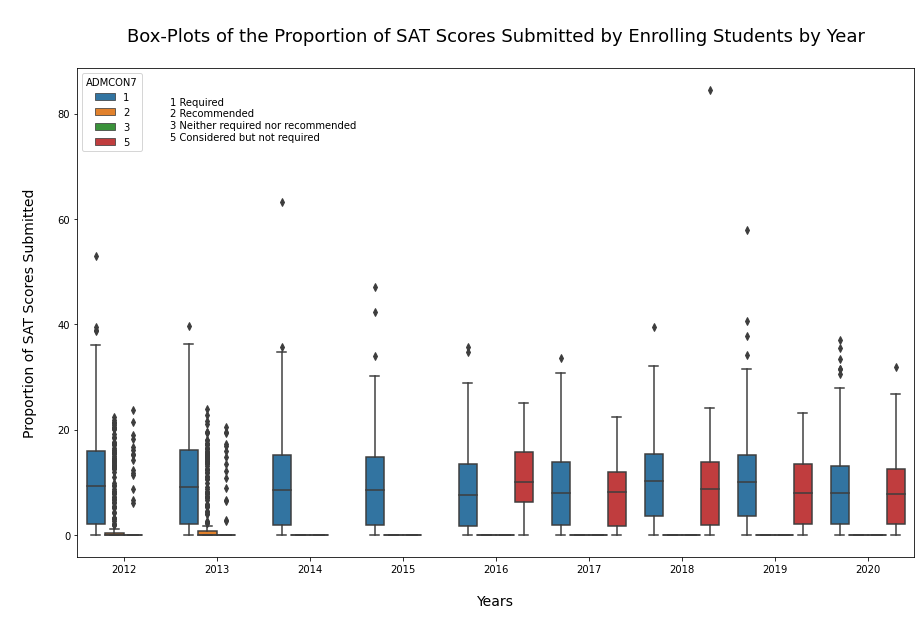

In [38]:

# https://stackoverflow.com/questions/62025957/filter-data-and-modifying-labels-in-seaborn-boxplot-graphs
# https://www.codegrepper.com/code-examples/python/frameworks/file-path-in-python/To+remove+outliers+in+data

### Let us filter the SAT Scores so that we do not account for non-reported scores due to the Institutions' Policy 
### Variable 'ADMCON7' indicates whether the institution asks students to report Admission Test scores - 
### filtering out the institutions who do not require them, we can have a better representation of the data

### The result is better but let us also rescale the data based on Number of Enrolled Students per year 



df_test=df.loc[lambda df:((df['ADMCON7']!='0')&(df['ADMCON7']!='4')),:]
# df_test
  
# df_test.describe()

# df_test.shape

fig, ax = plt.subplots(figsize=(15,9))
ax = sns.boxplot(x='YEAR', y='PROP_SATNUM', hue ='ADMCON7', data=df_test)
ax.set_xlabel('\nYears\n',fontsize=14)
ax.set_ylabel('\nProportion of SAT Scores Submitted\n',fontsize=14)
plt.title('\nBox-Plots of the Proportion of SAT Scores Submitted by Enrolling Students by Year\n',fontsize=18)
sns.move_legend(ax, "upper left")
# new_labels=['1 Required', '2 Recommended','3 Neither required nor recommended','5 Considered but not required']

plt.text(0+0.5, 75, "1 Required \n2 Recommended \n3 Neither required nor recommended \n5 Considered but not required", horizontalalignment='left', 
         size='medium', color='black')


Text(0.5, 48, '1 Required \n2 Recommended \n3 Neither required nor recommended \n5 Considered but not required')

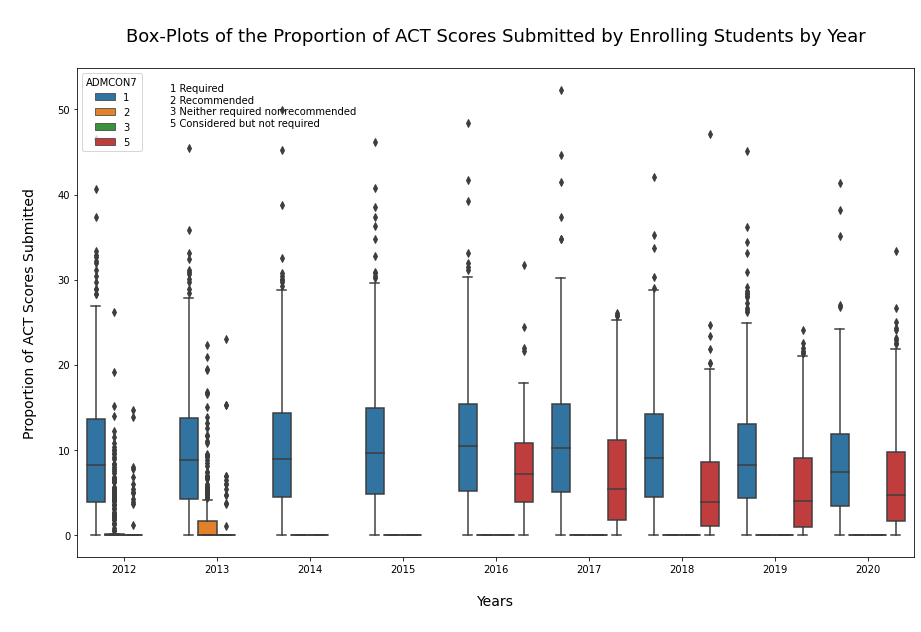

In [39]:


fig, ax = plt.subplots(figsize=(15,9))
ax = sns.boxplot(x='YEAR', y='PROP_ACTNUM', hue ='ADMCON7', data=df_test)
ax.set_xlabel('\nYears\n',fontsize=14)
ax.set_ylabel('\nProportion of ACT Scores Submitted\n',fontsize=14)
plt.title('\nBox-Plots of the Proportion of ACT Scores Submitted by Enrolling Students by Year\n',fontsize=18)
sns.move_legend(ax, "upper left")
# new_labels=['1 Required', '2 Recommended','3 Neither required nor recommended','5 Considered but not required']

plt.text(0+0.5, 48, "1 Required \n2 Recommended \n3 Neither required nor recommended \n5 Considered but not required", horizontalalignment='left', 
         size='medium', color='black')


### Box Plots of Total Enrolled students (having eliminated outliers from original data )

Text(0.5, 1.0, '\nBox-Plots of Total Enrolled Students by Year\n')

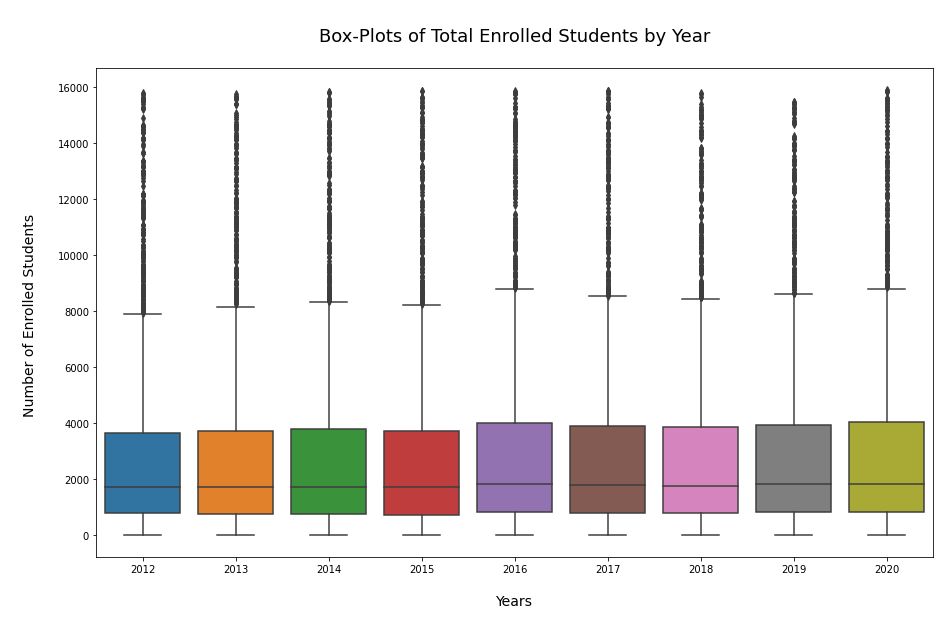

In [40]:
# sns.set(rc = {'figure.figsize':(15,9)})
# boxplot = df.boxplot(column=['EFYTOTLT'], by='YEAR') 

# remove_outlier(df_test, 'EFYTOTLT')

fig, ax = plt.subplots(figsize=(15,9))
ax = sns.boxplot(x='YEAR', y='EFYTOTLT', data=df_test)
ax.set_xlabel('\nYears\n',fontsize=14)
ax.set_ylabel('\nNumber of Enrolled Students \n',fontsize=14)
plt.title('\nBox-Plots of Total Enrolled Students by Year\n',fontsize=18)
# sns.move_legend(ax, "upper left")
# plt.text(0+0.5, 48, "1 Required \n2 Recommended \n3 Neither required nor recommended \n5 Considered but not required", horizontalalignment='left', 
#          size='medium', color='black')

Text(9.5, 14177, '1 Under 1,000 \n2 1,000 - 4,999 \n3 5,000 - 9,999 \n4 10,000 - 19,999 \n5 20,000 and above')

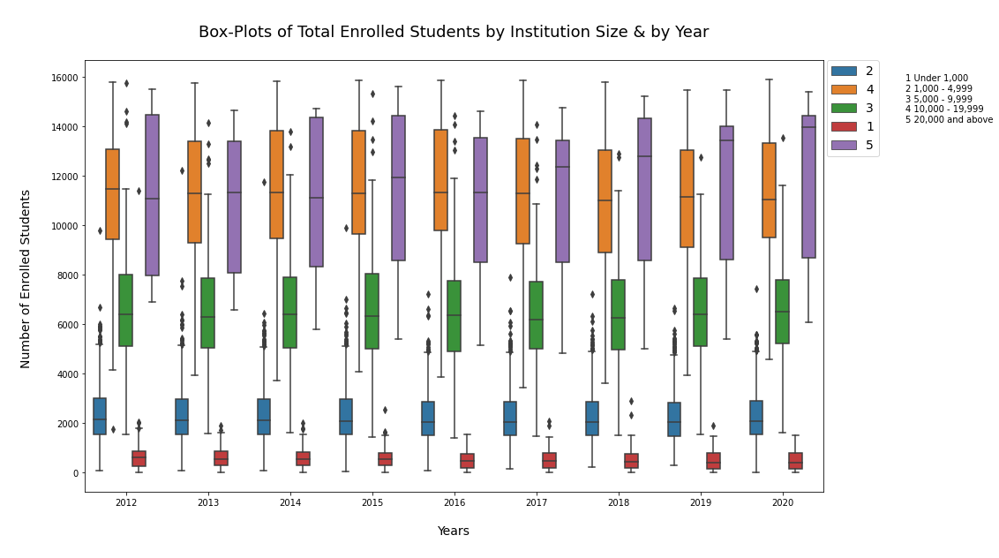

In [41]:
# sns.set(rc = {'figure.figsize':(15,12)})
# boxplot = df.boxplot(column=['EFYTOTLT'], by='YEAR') 

# remove_outlier(df_test, 'EFYTOTLT')

fig, ax = plt.subplots(figsize=(15,9))
ax = sns.boxplot(x='YEAR', y='EFYTOTLT', hue='INSTSIZE', data=df_test)
ax.set_xlabel('\nYears\n',fontsize=14)
ax.set_ylabel('\nNumber of Enrolled Students \n',fontsize=14)
plt.title('\nBox-Plots of Total Enrolled Students by Institution Size & by Year\n',fontsize=18)
# sns.move_legend(ax, "upper left")
plt.legend(fontsize = 14, bbox_to_anchor=(1.075, 1), loc='upper right', borderaxespad=0)

plt.text(0+9.5, 14177, "1 Under 1,000 \n2 1,000 - 4,999 \n3 5,000 - 9,999 \n4 10,000 - 19,999 \n5 20,000 and above", horizontalalignment='left', 
         size='medium', color='black')

# 1 Under 1,000
# 2 1,000 - 4,999
# 3 5,000 - 9,999
# 4 10,000 - 19,999
# 5 20,000 and above

In [42]:
# df_test.describe(include=[object])  
# # df_test.describe(include='all')  

In [43]:
# df_test.describe(include=[np.number]).round(decimals=2)  

In [44]:
# df.drop(['SAT_RATIOS','ACT_RATIOS'], axis=1, inplace=True)

In [45]:
df.head()

,YEAR,UNITID,STABBR,INSTNM,OBEREG,HDEGOFFR,GROFFER,HBCU,LOCALE,INSTCAT,...,ADMCON5,ADMCON6,ADMCON7,ADMCON8,ADMCON9,SATNUM,ACTNUM,EFYTOTLT,PROP_SATNUM,PROP_ACTNUM
4020,2012,100654,AL,Alabama A & M University,5,10,1,1,12,2,...,3,2,1,1,3,113,820,4582,2.47,17.90
4021,2012,100663,AL,University of Alabama at Birmingham,5,10,1,2,12,2,...,3,3,1,3,3,79,1500,12962,0.61,11.57
4022,2012,100690,AL,Amridge University,5,10,1,2,12,2,...,0,0,0,0,0,0,0,522,0.00,0.00
4023,2012,100706,AL,University of Alabama in Huntsville,5,10,1,2,12,2,...,3,2,1,1,3,120,581,6983,1.72,8.32
4024,2012,100724,AL,Alabama State University,5,10,1,1,12,2,...,3,3,1,1,3,203,972,5541,3.66,17.54


### Creating a comparison column where the code indicates if the Proporion of ACT and SAT reported is:
- not present code = 0
- up to 10% code = 1
- between 10% and 20% code = 2
- between 20% and 30% code = 3 
- between 30% and 40% code = 4
- over 40%  code = 5 

In [46]:

sats = (df['PROP_SATNUM'].values)
acts= (df['PROP_ACTNUM'].values)

ratios_sat = []
ratios_act = []

for i in range (len(sats)):
  if 0< sats[i] <10:
    ratios_sat.append(1)
  elif 10<= sats[i] <20:
    ratios_sat.append(2)
  elif 20<= sats[i] <30:
    ratios_sat.append(3)
  elif 30<= sats[i] <40:
    ratios_sat.append(4)
  elif 40<= sats[i]:
    ratios_sat.append(5)
  elif sats[i]==0:
    ratios_sat.append(0)    
# 
for i in range (len(acts)):
  if 0< acts[i] <10:
    ratios_act.append(1)
  elif 10<= acts[i] <20:
    ratios_act.append(2)
  elif 20<= acts[i] <30:
    ratios_act.append(3)
  elif 30<= acts[i] <40:
    ratios_act.append(4)
  elif 40<= acts[i]:
    ratios_act.append(5)
  elif acts[i]==0:
    ratios_act.append(0)
df['SAT_ENROL'] = ratios_sat 
df['ACT_ENROL'] = ratios_act 
df.head()  

# SAT_ENROL and ACT_ENROL CODES:
# 0 = none
# 1 = less than 10%
# 2 = between 10 and 20%
# 3 = between 20% and 30%
# 4 = between 30% and 40%
# 5 =  greater than 40%

,YEAR,UNITID,STABBR,INSTNM,OBEREG,HDEGOFFR,GROFFER,HBCU,LOCALE,INSTCAT,...,ADMCON7,ADMCON8,ADMCON9,SATNUM,ACTNUM,EFYTOTLT,PROP_SATNUM,PROP_ACTNUM,SAT_ENROL,ACT_ENROL
4020,2012,100654,AL,Alabama A & M University,5,10,1,1,12,2,...,1,1,3,113,820,4582,2.47,17.90,1,2
4021,2012,100663,AL,University of Alabama at Birmingham,5,10,1,2,12,2,...,1,3,3,79,1500,12962,0.61,11.57,1,2
4022,2012,100690,AL,Amridge University,5,10,1,2,12,2,...,0,0,0,0,0,522,0.00,0.00,0,0
4023,2012,100706,AL,University of Alabama in Huntsville,5,10,1,2,12,2,...,1,1,3,120,581,6983,1.72,8.32,1,1
4024,2012,100724,AL,Alabama State University,5,10,1,1,12,2,...,1,1,3,203,972,5541,3.66,17.54,1,2


### Here creating a column that sets a High Enrollment marker based on institutional size and overall enrollment per year per HEI

In [47]:
 df['INSTSIZE'].value_counts()

2    12500
1    11805
3     4260
4     1518
5       94
Name: INSTSIZE, dtype: int64

### Splitting the data  between High and Low enrollment allows us to try to apply a logistic regression to our data 

In [48]:
# , stats

vals = df['INSTSIZE'].values
sizes =[]

for  x in vals:
  if x=='3':
      # print(x)
    sizes.append(7499.5)
  elif x=='1':
    sizes.append(500.5)
  elif x=='2':
    sizes.append(2999.5)
  elif x=='4':
    sizes.append(14999.5)
  elif x=='5':
    sizes.append(14999.5) # The highest value included in this group is actually 15885 in terms of enrollment - Thus while these HEIs could host more students they haven't over the period
  # print(sizes)
df['CLASS_MIDDLE'] = sizes

enrols = df['EFYTOTLT'].values


# print(enrols.size)
compares = (df['CLASS_MIDDLE'].values)

# TO CREATE TWO CLASSES FOR ENROLLMENT One HIGH ABOVE 85% The other LOW BELOW 85%
compares2 = (df['CLASS_MIDDLE'].values)*0.85

# # TO DIVIDE ENROLLMENT IN THREE CLASSES:
# compares2_low = (df['CLASS_MIDDLE'].values)*0.50
# compares2_middle = (df['CLASS_MIDDLE'].values)*0.85

ratios = []

# # CREATES A MULTICLASS ENROLMENT CATEGORY LOW = code 0, MIDDLE  code=1; HIGH code = 2 

# for i in range (len(enrols)):
#   if enrols[i] <= compares2_low[i]:
#     ratios.append(0)
#   elif enrols[i] > compares2_low[i]:
#     if enrols[i] < compares2_middle[i]:
#       ratios.append(1)
#     else:
#       ratios.append(2)

    

# df['HIGH_ENROL'] = ratios
# df.tail()  

for i in range (len(enrols)):
  if enrols[i] > compares2[i]:
    ratios.append(1)
  else:
    ratios.append(0)
df['HIGH_ENROL'] = ratios
df.tail()  

# df.drop(['EFYTOTLT','SIZES'], axis=1, inplace=True)
# # df_2020cl.drop(['SIZES'], axis=1, inplace=True)

# INSTSIZE	1	Under 1,000 = 501 USED: 500.5
# INSTSIZE	2	1,000 - 4,999 = 3000 USED: 2999.5
# INSTSIZE	3	5,000 - 9,999 = 7500 USED: 7499.5
# INSTSIZE	4	10,000 - 19,999 = 15000 USED: 14999.5
# INSTSIZE	5	20,000 and above USED:

,YEAR,UNITID,STABBR,INSTNM,OBEREG,HDEGOFFR,GROFFER,HBCU,LOCALE,INSTCAT,...,ADMCON9,SATNUM,ACTNUM,EFYTOTLT,PROP_SATNUM,PROP_ACTNUM,SAT_ENROL,ACT_ENROL,CLASS_MIDDLE,HIGH_ENROL
34554,2020,495925,CA,San Joaquin Valley College-Madera,8,40,2,2,13,1,...,0,0,0,182,0.0,0.0,0,0,500.5,0
34555,2020,495934,CA,San Joaquin Valley College-Delano,8,40,2,2,23,1,...,0,0,0,192,0.0,0.0,0,0,500.5,0
34556,2020,495952,CA,San Joaquin Valley College-Rancho Mirage,8,40,2,2,21,1,...,0,0,0,67,0.0,0.0,0,0,500.5,0
34557,2020,495961,CA,San Joaquin Valley College-Santa Maria,8,40,2,2,12,1,...,0,0,0,51,0.0,0.0,0,0,500.5,0
34558,2020,496186,CA,California Institute of Arts & Technology-Nati...,8,40,2,2,21,1,...,0,0,0,383,0.0,0.0,0,0,500.5,0


In [49]:
df.columns

Index(['YEAR', 'UNITID', 'STABBR', 'INSTNM', 'OBEREG', 'HDEGOFFR', 'GROFFER',
       'HBCU', 'LOCALE', 'INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'OPENADMP',
       'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4', 'SLO5', 'SLO6', 'SLO7',
       'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3', 'STUSRV4', 'STUSRV8',
       'LIBRES1', 'ATHASSOC', 'APPLFEEU', 'TUITVARY', 'ROOM', 'BOARD',
       'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC', 'DSTNUGP',
       'RMANDBRDAMT', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5',
       'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SATNUM', 'ACTNUM',
       'EFYTOTLT', 'PROP_SATNUM', 'PROP_ACTNUM', 'SAT_ENROL', 'ACT_ENROL',
       'CLASS_MIDDLE', 'HIGH_ENROL'],
      dtype='object')

In [50]:
# df_NUM = df[['YEAR','UNITID','APPLFEEU','RMANDBRDAMT','SATNUM', 'ACTNUM','EFYTOTLT']].copy(deep=False)
# df_NUM.head()
# # CREATING DF with ONLY Numerical Variables from our data 

In [51]:
# # df.groupby['INSTSIZE']['EFYTOTLT'].sum()
# sum_by_instsize = (df.groupby('INSTSIZE')['EFYTOTLT'].sum()).reset_index()
# sum_by_instsize
# # sum_by_supplier = (df.groupby('Supplier Name')['Invoice Value'].sum()).reset_index()

In [52]:
df['HIGH_ENROL'].value_counts()

1    16774
0    13403
Name: HIGH_ENROL, dtype: int64

In [53]:
# df['EFYTOTLT'].nunique()

In [54]:
df['LOCALE'].value_counts()

11    6506
21    6403
13    3808
12    3251
32    2614
41    2204
33    2090
22     808
42     805
31     737
23     525
43     426
Name: LOCALE, dtype: int64

In [55]:
colc=['LOCALE']

for i in colc:
  df[i] = df[i].astype(str)
  df[i] = df[i].map(lambda x: re.sub(r'11', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'12', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'13', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'14', '10', x))
  df[i] = df[i].map(lambda x: re.sub(r'21', '20', x))
  df[i] = df[i].map(lambda x: re.sub(r'22', '20', x))
  df[i] = df[i].map(lambda x: re.sub(r'23', '20', x))
  df[i] = df[i].map(lambda x: re.sub(r'31', '30', x))
  df[i] = df[i].map(lambda x: re.sub(r'32', '30', x))
  df[i] = df[i].map(lambda x: re.sub(r'33', '30', x))
  df[i] = df[i].map(lambda x: re.sub(r'41', '40', x))
  df[i] = df[i].map(lambda x: re.sub(r'42', '40', x))
  df[i] = df[i].map(lambda x: re.sub(r'43', '40', x))
  df[i] = df[i].astype(str)

In [56]:
df.drop(['SATNUM','ACTNUM', 'CLASS_MIDDLE', 'PROP_SATNUM','PROP_ACTNUM'],axis=1,inplace=True)
# df.drop(['EFYTOTLT','SATNUM','ACTNUM', 'CLASS_MIDDLE', 'PROP_SATNUM','PROP_ACTNUM'],axis=1,inplace=True)

# df.drop([ 'PROP_SATNUM','PROP_ACTNUM'],axis=1,inplace=True)

df['SAT_ENROL']=df['SAT_ENROL'].astype(str)
df['ACT_ENROL']=df['ACT_ENROL'].astype(str)
df['HIGH_ENROL']=df['HIGH_ENROL'].astype(str)


In [57]:
df.columns

Index(['YEAR', 'UNITID', 'STABBR', 'INSTNM', 'OBEREG', 'HDEGOFFR', 'GROFFER',
       'HBCU', 'LOCALE', 'INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'OPENADMP',
       'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4', 'SLO5', 'SLO6', 'SLO7',
       'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3', 'STUSRV4', 'STUSRV8',
       'LIBRES1', 'ATHASSOC', 'APPLFEEU', 'TUITVARY', 'ROOM', 'BOARD',
       'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC', 'DSTNUGP',
       'RMANDBRDAMT', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5',
       'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'EFYTOTLT', 'SAT_ENROL',
       'ACT_ENROL', 'HIGH_ENROL'],
      dtype='object')

In [58]:
df.head().T

,4020,4021,4022,4023,4024
YEAR,2012,2012,2012,2012,2012
UNITID,100654,100663,100690,100706,100724
STABBR,AL,AL,AL,AL,AL
INSTNM,Alabama A & M University,University of Alabama at Birmingham,Amridge University,University of Alabama in Huntsville,Alabama State University
OBEREG,5,5,5,5,5
HDEGOFFR,10,10,10,10,10
GROFFER,1,1,1,1,1
HBCU,1,2,2,2,1
LOCALE,10,10,10,10,10
INSTCAT,2,2,2,2,2


### Slicing out institutions with open admissions altogether from our DF 

In [59]:
df['OPENADMP'].value_counts()
# 'OPENADMP' = Code indicating whether the HEI adopts an Open Enrollment Policy or not
# 1 = Yes
# 2 = No

2    15706
1    14471
Name: OPENADMP, dtype: int64

In [60]:
# df['SAT_ENROL'].value_counts()

In [61]:
# df.loc[lambda df:(df['SAT_ENROL']=='5'),:]

In [62]:

# # Taking a look at Institutions not requiring students to report Test Scores for admissions

# # df['ADMCON7'].value_counts()
# test=df.loc[lambda df:(df['ADMCON7']=='0'),:]
# test.shape # (16525, 53)
# # test['SAT_ENROL'].nunique()
# # test['SAT_ENROL'].value_counts() # 16525
# # test['ACT_ENROL'].value_counts() # 16525

# # ADMCON7 Admission test scores

In [63]:
# # df_tests=df.loc[lambda df:((df['ADMCON7']!=0)|(df['ADMCON7']!=4)),:]
# df_tests=df.loc[lambda df:((df['ADMCON7']!=0)),:]
# df_test=df_tests.loc[lambda df_tests:((df_tests['ADMCON7']!=4)),:]

In [64]:
df['EFYTOTLT'].max()

15885

In [65]:
# df_xl = df.loc[lambda df:(df['INSTSIZE']=='5'),:]

In [66]:
# # , stats

# vals = df_xl['INSTSIZE'].values
# sizes =[]

# for  x in vals:
#   if x=='3':
#       # print(x)
#     sizes.append(7499.5)
#   elif x=='1':
#     sizes.append(500.5)
#   elif x=='2':
#     sizes.append(2999.5)
#   elif x=='4':
#     sizes.append(14999.5)
#   elif x=='5':
#     sizes.append(14999.5)
#   # print(sizes)
# df_xl['CLASS_MIDDLE'] = sizes

# enrols = df_xl['EFYTOTLT'].values


# # print(enrols.size)
# compares = (df_xl['CLASS_MIDDLE'].values)

# # TO CREATE TWO CLASSES FOR ENROLLMENT One HIGH ABOVE 85% The other LOW BELOW 85%
# compares2 = (df_xl['CLASS_MIDDLE'].values)*0.85

# # # TO DIVIDE ENROLLMENT IN THREE CLASSES:
# # compares2_low = (df['CLASS_MIDDLE'].values)*0.50
# # compares2_middle = (df['CLASS_MIDDLE'].values)*0.85

# ratios = []

# # # CREATES A MULTICLASS ENROLMENT CATEGORY LOW = code 0, MIDDLE  code=1; HIGH code = 2 

# # for i in range (len(enrols)):
# #   if enrols[i] <= compares2_low[i]:
# #     ratios.append(0)
# #   elif enrols[i] > compares2_low[i]:
# #     if enrols[i] < compares2_middle[i]:
# #       ratios.append(1)
# #     else:
# #       ratios.append(2)

    

# # df['HIGH_ENROL'] = ratios
# # df.tail()  

# for i in range (len(enrols)):
#   if enrols[i] > compares2[i]:
#     ratios.append(1)
#   else:
#     ratios.append(0)
# df_xl['HIGH_ENROL'] = ratios
# df_xl.tail()  

# # df.drop(['EFYTOTLT','SIZES'], axis=1, inplace=True)
# # # df_2020cl.drop(['SIZES'], axis=1, inplace=True)

# # INSTSIZE	1	Under 1,000 = 501 USED: 500.5
# # INSTSIZE	2	1,000 - 4,999 = 3000 USED: 2999.5
# # INSTSIZE	3	5,000 - 9,999 = 7500 USED: 7499.5
# # INSTSIZE	4	10,000 - 19,999 = 15000 USED: 14999.5
# # INSTSIZE	5	20,000 and above USED:

In [67]:
# df_xl['EFYTOTLT'].unique()

In [68]:
# df_xl['HIGH_ENROL'].value_counts()

In [69]:
df_NOA=df.loc[lambda df:(df['OPENADMP']!=1),:].copy(False)

In [70]:
# df_NOA.drop(['OPENADMP'], axis = 1, inplace=True)

In [71]:
df_NOA.head() # NO OPEN ADMISSION HEIs DATA 

,YEAR,UNITID,STABBR,INSTNM,OBEREG,HDEGOFFR,GROFFER,HBCU,LOCALE,INSTCAT,...,ADMCON4,ADMCON5,ADMCON6,ADMCON7,ADMCON8,ADMCON9,EFYTOTLT,SAT_ENROL,ACT_ENROL,HIGH_ENROL
4020,2012,100654,AL,Alabama A & M University,5,10,1,1,10,2,...,2,3,2,1,1,3,4582,1,2,1
4021,2012,100663,AL,University of Alabama at Birmingham,5,10,1,2,10,2,...,1,3,3,1,3,3,12962,1,2,1
4022,2012,100690,AL,Amridge University,5,10,1,2,10,2,...,0,0,0,0,0,0,522,0,0,1
4023,2012,100706,AL,University of Alabama in Huntsville,5,10,1,2,10,2,...,1,3,2,1,1,3,6983,1,1,1
4024,2012,100724,AL,Alabama State University,5,10,1,1,10,2,...,3,3,3,1,1,3,5541,1,2,0


In [72]:
df_NOA.drop(['OPENADMP','GROFFER','INSTNM','APPLFEEU','RMANDBRDAMT'], axis = 1, inplace=True)

### Let us drop the following COlumns in addition to the ones we have already dropped 
- GROFFER' = Code indicating whether the HEI offers Graduate Level degrees - Because this information is already captured by HDEGOFFR and INSTCATEGORY

- INSTNME = Because this is a descriptive variable we do not need for the pruposes of our analysis

- OPENADMP = Because we dropped Openadmission institutions and are only analyzing institutions that do not allow any undergraduate to enroll in their school

- INSTSIZE - Because we have re-defined our Target variable as a ratio in proportion to the school's original size 

- APPLEFEE and RMANDBRDAMT	= Because we are dropping financially  relevant variables simply assuming that lower costs would benefit enrollment numbers

In [73]:
df_NOA.head().T

,4020,4021,4022,4023,4024
YEAR,2012,2012,2012,2012,2012
UNITID,100654,100663,100690,100706,100724
STABBR,AL,AL,AL,AL,AL
OBEREG,5,5,5,5,5
HDEGOFFR,10,10,10,10,10
HBCU,1,2,2,2,1
LOCALE,10,10,10,10,10
INSTCAT,2,2,2,2,2
INSTSIZE,2,4,1,3,3
CNTLAFFI,1,1,4,1,1


In [74]:
df_NOA.columns

Index(['YEAR', 'UNITID', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE',
       'INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
       'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2',
       'STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
       'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5',
       'DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
       'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'EFYTOTLT',
       'SAT_ENROL', 'ACT_ENROL', 'HIGH_ENROL'],
      dtype='object')

In [75]:
df_NOA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30177 entries, 4020 to 34558
Data columns (total 49 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   YEAR        30177 non-null  int64 
 1   UNITID      30177 non-null  object
 2   STABBR      30177 non-null  object
 3   OBEREG      30177 non-null  object
 4   HDEGOFFR    30177 non-null  object
 5   HBCU        30177 non-null  object
 6   LOCALE      30177 non-null  object
 7   INSTCAT     30177 non-null  object
 8   INSTSIZE    30177 non-null  object
 9   CNTLAFFI    30177 non-null  object
 10  CREDITS1    30177 non-null  object
 11  CREDITS2    30177 non-null  object
 12  CREDITS3    30177 non-null  object
 13  CREDITS4    30177 non-null  object
 14  SLO5        30177 non-null  object
 15  SLO6        30177 non-null  object
 16  SLO7        30177 non-null  object
 17  SLO83       30177 non-null  object
 18  STUSRV1     30177 non-null  object
 19  STUSRV2     30177 non-null  object
 20  STU

In [76]:
df_NOA = df_NOA.reindex(columns=['YEAR', 'UNITID', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE','INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
                                 'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2','STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
                                 'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5','DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
                                 'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL', 'EFYTOTLT','HIGH_ENROL'])
# 

In [77]:
# df_NOA.head()

### Let's take a look at the variables' association levels 

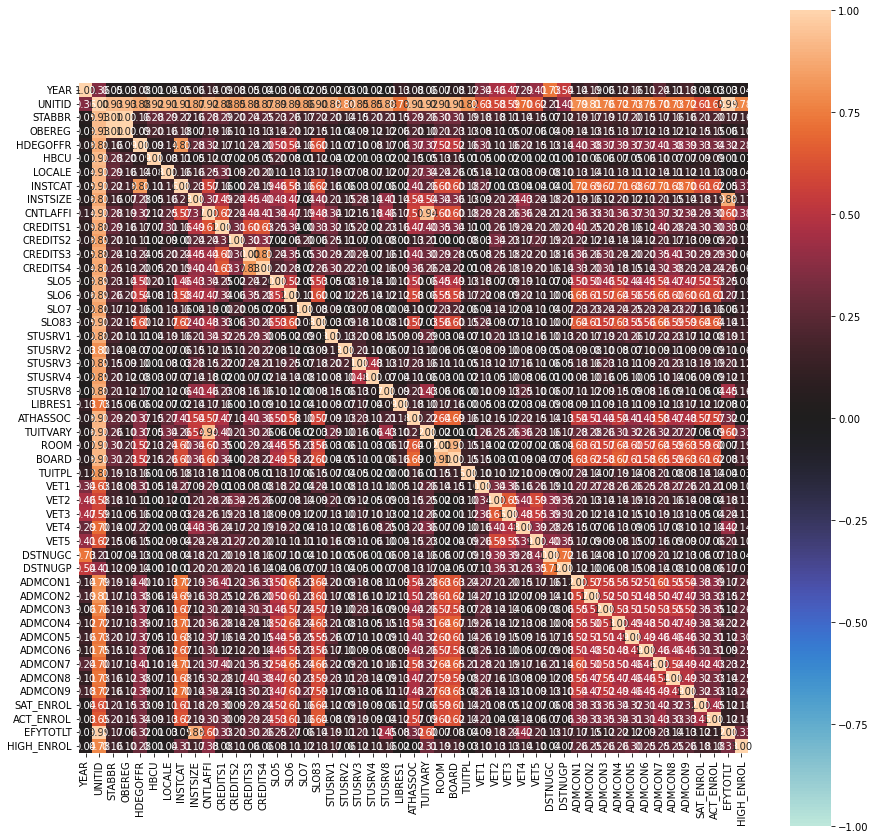

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR      HBCU  \
 YEAR        1.000000  0.362909  0.049356  0.028997  0.076593  0.012956   
 UNITID      0.362909  1.000000  0.926952  0.926549  0.879283  0.924419   
 STABBR      0.049356  0.926952  1.000000  0.999287  0.164754  0.277179   
 OBEREG      0.028997  0.926549  0.999287  1.000000  0.092492  0.197621   
 HDEGOFFR    0.076593  0.879283  0.164754  0.092492  1.000000  0.089746   
 HBCU        0.012956  0.924419  0.277179  0.197621  0.089746  1.000000   
 LOCALE      0.036779  0.913545  0.291185  0.160820  0.140203  0.078877   
 INSTCAT     0.049971  0.906847  0.223381  0.181265  0.827064  0.108840   
 INSTSIZE    0.055684  0.873688  0.159855  0.071614  0.280347  0.051462   
 CNTLAFFI    0.143088  0.919842  0.282855  0.187189  0.322910  0.123167   
 CREDITS1    0.092761  0.879538  0.289022  0.155258  0.171369  0.069560   
 CREDITS2    0.081150  0.849376  0.202738  0.109575  0.114987  0.0168

In [78]:
# plt.figure(figsize=(15, 15))
associations(df_NOA, figsize=(15, 15))

In [79]:
df_NOA['INSTSIZE'].value_counts()

2    12500
1    11805
3     4260
4     1518
5       94
Name: INSTSIZE, dtype: int64

In [80]:
# df_NOA.info()

### Checking Associations between variables but based on subgroups of Instituions based on their size 

In [81]:
df_LARGE = df_NOA.loc[lambda df_NOA:(df_NOA['INSTSIZE']=='5'),:].copy(False)

In [82]:
df_LARGE['CNTLAFFI'].value_counts()

3    72
2    14
1     8
Name: CNTLAFFI, dtype: int64

### None of the Larger Institutions are able to meet the high  enrollment mark of 85%
### In addition, ALL of the Large Institutions have these additional characteristics:
- None are are HBCU 
- All offer both Undergraduate and Graduate programs (which makes sense) 
- All accept Advance Placement credits
- Seemingly as a contradiction Non Accept credit for Life experiences
- All have academic counseling offices

### These initial results led me back to taking a closer look at the enrollment levels and classification of these institutions. 
### It appeared clear that while this group of HEIs is categorized as being able to enroll students in numbers greater than 20,000 a year, their actual yearly enrollment never exceeded the  middle of the 2nd to largest class of HEIs
### Using then the middle of the interval for the second to largest class of enrollment on this group of institutions led me to find more significant results 
### The institutions are a minority within the group (only 94 in total) 
### None are HBCUs
### All offer both Undergraduate and Graduate degree programs 
### Most are Private organizations ( 86 vs 8) with the ones Not for profit constituting the larger portion (72 vs 14)
### The features mostly associated with enrollment for this group align somewhat with those for the 2nd largest group, however, notable differences are: 
- Dual Enrollment services which play a significant role for this group
- Being part of Athletic Associations (not surprisingly)
- Teacher certification programs & Offering Tuition Assistance plans which are not influencing enrollment 
- Vet-oriented programs do not seem to have a great level of influence while
- the presence of a tuition plan assistance program and Distance education courses and programs do influence enrollment (contrary to the 2nd largest group) 


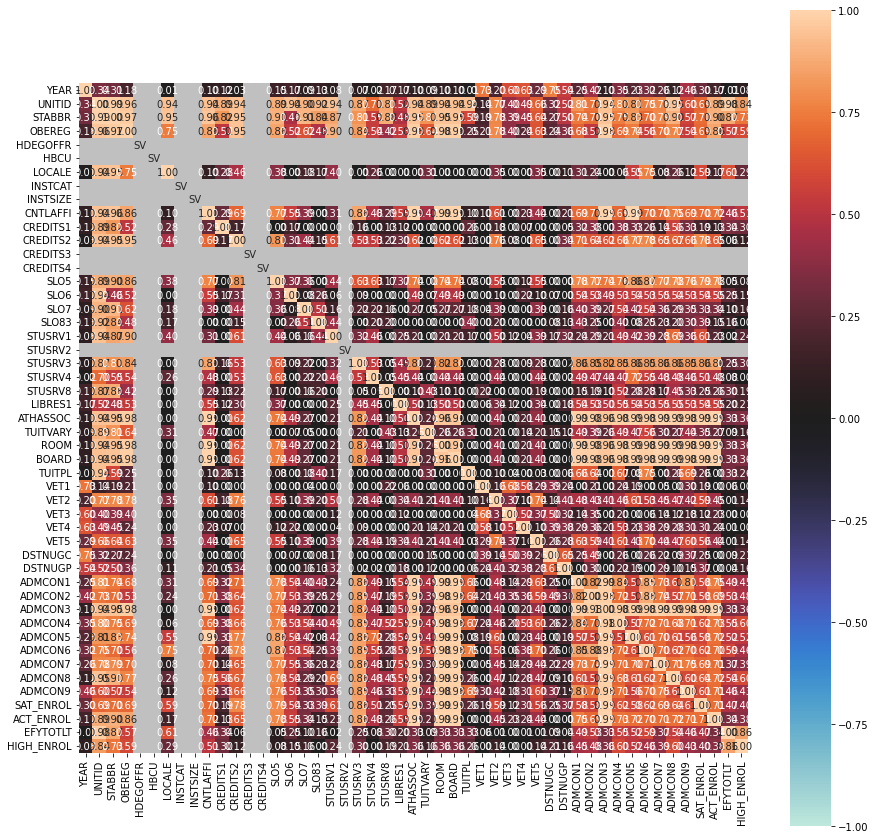

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR  HBCU    LOCALE  \
 YEAR        1.000000  0.338197  0.306488  0.181201       0.0   0.0  0.013383   
 UNITID      0.338197  1.000000  0.987878  0.959403       0.0   0.0  0.938315   
 STABBR      0.306488  0.987878  1.000000  0.971175       0.0   0.0  0.949828   
 OBEREG      0.181201  0.959403  0.971175  1.000000       0.0   0.0  0.746506   
 HDEGOFFR    0.000000  0.000000  0.000000  0.000000       0.0   0.0  0.000000   
 HBCU        0.000000  0.000000  0.000000  0.000000       0.0   0.0  0.000000   
 LOCALE      0.013383  0.938315  0.949828  0.746506       0.0   0.0  1.000000   
 INSTCAT     0.000000  0.000000  0.000000  0.000000       0.0   0.0  0.000000   
 INSTSIZE    0.000000  0.000000  0.000000  0.000000       0.0   0.0  0.000000   
 CNTLAFFI    0.098314  0.943456  0.955033  0.859600       0.0   0.0  0.104716   
 CREDITS1    0.116058  0.891271  0.823272  0.517053       0.0   0.0  0.278993 

In [83]:
# plt.figure(figsize=(15, 15))
associations(df_LARGE, figsize=(15, 15))

In [84]:
df_LARGE['VET5'].value_counts()

0    71
1    23
Name: VET5, dtype: int64

In [85]:
df_LARGE['TUITPL'].value_counts()

1    85
2     9
Name: TUITPL, dtype: int64

In [86]:
df_LARGE['INSTCAT'].value_counts()

2    94
Name: INSTCAT, dtype: int64

In [87]:
df_LARGE['HIGH_ENROL'].value_counts()

1    49
0    45
Name: HIGH_ENROL, dtype: int64

In [88]:
df_LARGE['CREDITS3'].value_counts()

1    94
Name: CREDITS3, dtype: int64

In [89]:
df_LARGE['CREDITS4'].value_counts()
# CREDITS 3 Advanced placement (AP) credits
# CREDITS4 Institution does not accept dual, credit for life, or AP credits
# 1	Yes
# 0	Implied no

0    94
Name: CREDITS4, dtype: int64

In [90]:
df_LARGE['STUSRV2'].value_counts()
# STUSRV2	Academic/career counseling service

1    94
Name: STUSRV2, dtype: int64

In [91]:
df_2nd_LARGE = df_NOA.loc[lambda df_NOA:(df_NOA['INSTSIZE']=='4'),:].copy(False)

# 2    12500
# 1    11805
# 3     4260
# 4     1518
# 5       94

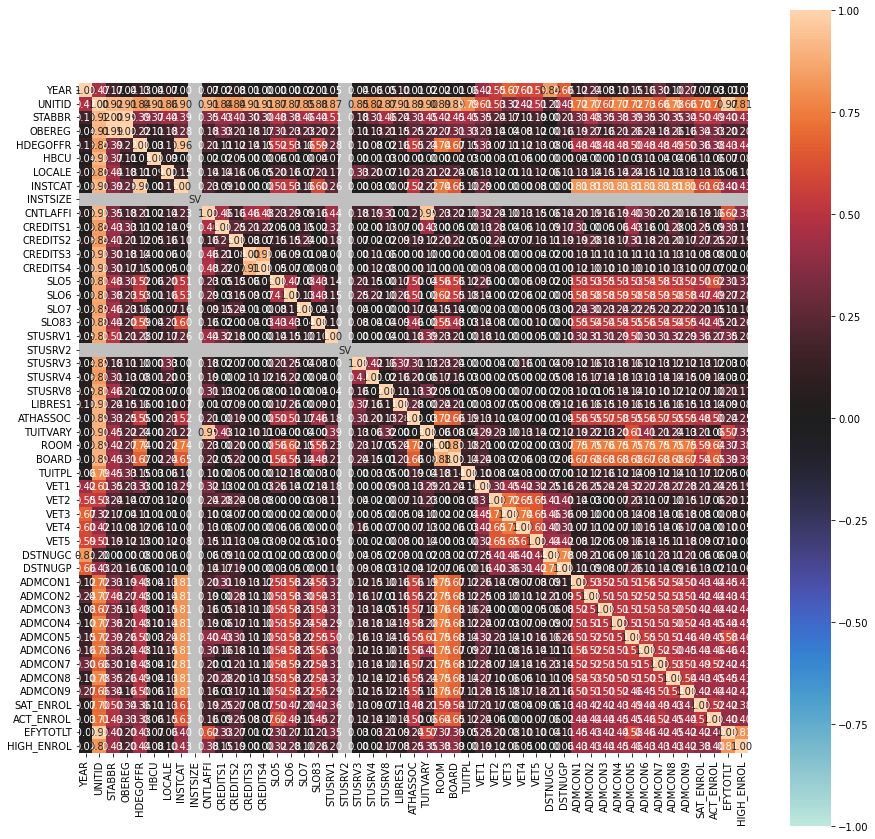

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR      HBCU  \
 YEAR        1.000000  0.473805  0.167464  0.042038  0.127904  0.035210   
 UNITID      0.473805  1.000000  0.920236  0.907657  0.843240  0.905859   
 STABBR      0.167464  0.920236  1.000000  0.986330  0.390613  0.370352   
 OBEREG      0.042038  0.907657  0.986330  1.000000  0.216103  0.109260   
 HDEGOFFR    0.127904  0.843240  0.390613  0.216103  1.000000  0.027578   
 HBCU        0.035210  0.905859  0.370352  0.109260  0.027578  1.000000   
 LOCALE      0.073238  0.856236  0.442416  0.177601  0.107393  0.087492   
 INSTCAT     0.001117  0.901000  0.389131  0.283412  0.957839  0.000000   
 INSTSIZE    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
 CNTLAFFI    0.068978  0.906457  0.351912  0.179643  0.209072  0.019936   
 CREDITS1    0.022460  0.841400  0.425419  0.333193  0.109029  0.017213   
 CREDITS2    0.078097  0.835355  0.406649  0.211841  0.122173  0.0478

In [92]:
associations(df_2nd_LARGE, figsize=(15, 15))

In [93]:
df_all_LARGE = df_NOA.loc[lambda df_NOA:((df_NOA['INSTSIZE']=='4')|(df_NOA['INSTSIZE']=='5')),:].copy(False)

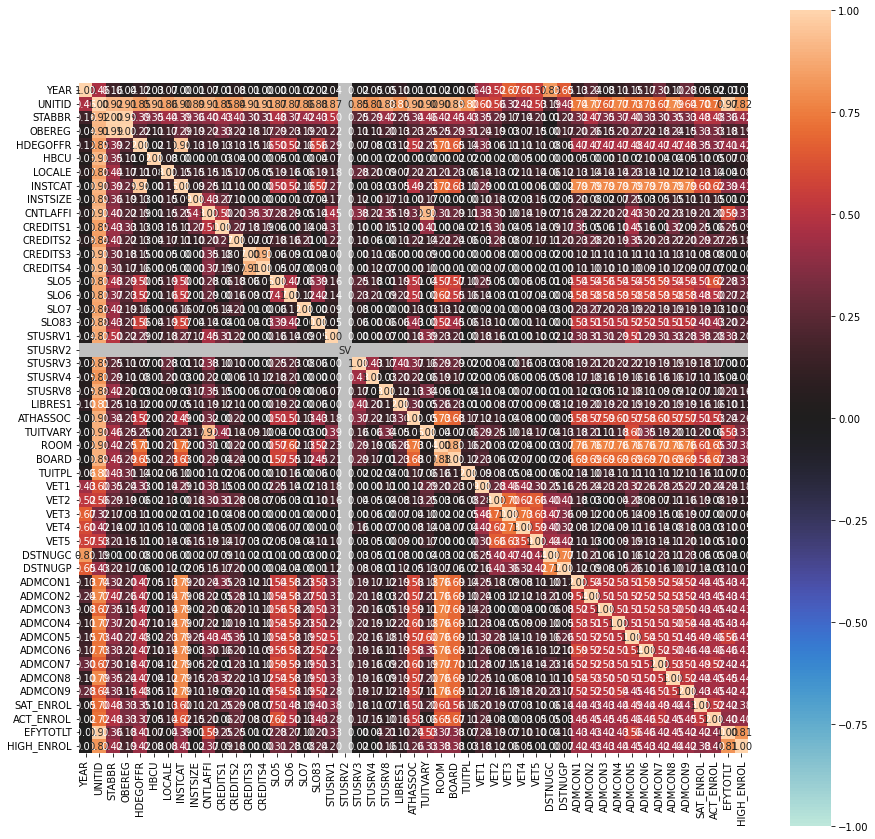

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR      HBCU  \
 YEAR        1.000000  0.462095  0.162630  0.044156  0.123338  0.033913   
 UNITID      0.462095  1.000000  0.921416  0.909564  0.845570  0.907868   
 STABBR      0.162630  0.921416  1.000000  0.987137  0.386989  0.353670   
 OBEREG      0.044156  0.909564  0.987137  1.000000  0.219269  0.106698   
 HDEGOFFR    0.123338  0.845570  0.386989  0.219269  1.000000  0.021645   
 HBCU        0.033913  0.907868  0.353670  0.106698  0.021645  1.000000   
 LOCALE      0.071272  0.858573  0.441458  0.170165  0.109140  0.080755   
 INSTCAT     0.000306  0.903064  0.391608  0.290318  0.958263  0.000000   
 INSTSIZE    0.008138  0.889171  0.361524  0.191466  0.126054  0.000000   
 CNTLAFFI    0.068957  0.908432  0.395451  0.223230  0.192074  0.006143   
 CREDITS1    0.011616  0.850810  0.425862  0.330008  0.131179  0.025050   
 CREDITS2    0.075734  0.841823  0.414508  0.223885  0.130177  0.0430

In [94]:
associations(df_all_LARGE, figsize=(15, 15))

# 2    12500
# 1    11805
# 3     4260
# 4     1518
# 5       94

In [95]:
# df_all_LARGE['STUSRV2'].value_counts()
df_all_LARGE['STUSRV4'].value_counts()

1    1450
0     162
Name: STUSRV4, dtype: int64

In [96]:
df_all_LARGE['DSTNUGC'].value_counts()

0    927
1    685
Name: DSTNUGC, dtype: int64

In [97]:
df_all_LARGE['CREDITS3'].value_counts()

1    1601
0      11
Name: CREDITS3, dtype: int64

In [98]:
df_all_LARGE['CREDITS4'].value_counts()

0    1602
1      10
Name: CREDITS4, dtype: int64

### A minor portion of the Second Largest Institutions are able to meet the high  enrollment mark of 85%
### In addition, ALL of these Institutions have these additional characteristics:
- All have academic counseling offices

In [99]:
df_MIDDLE = df_NOA.loc[lambda df_NOA:(df_NOA['INSTSIZE']=='3'),:].copy(False)

# 2    12500
# 1    11805
# 3     4260
# 4     1518
# 5       94

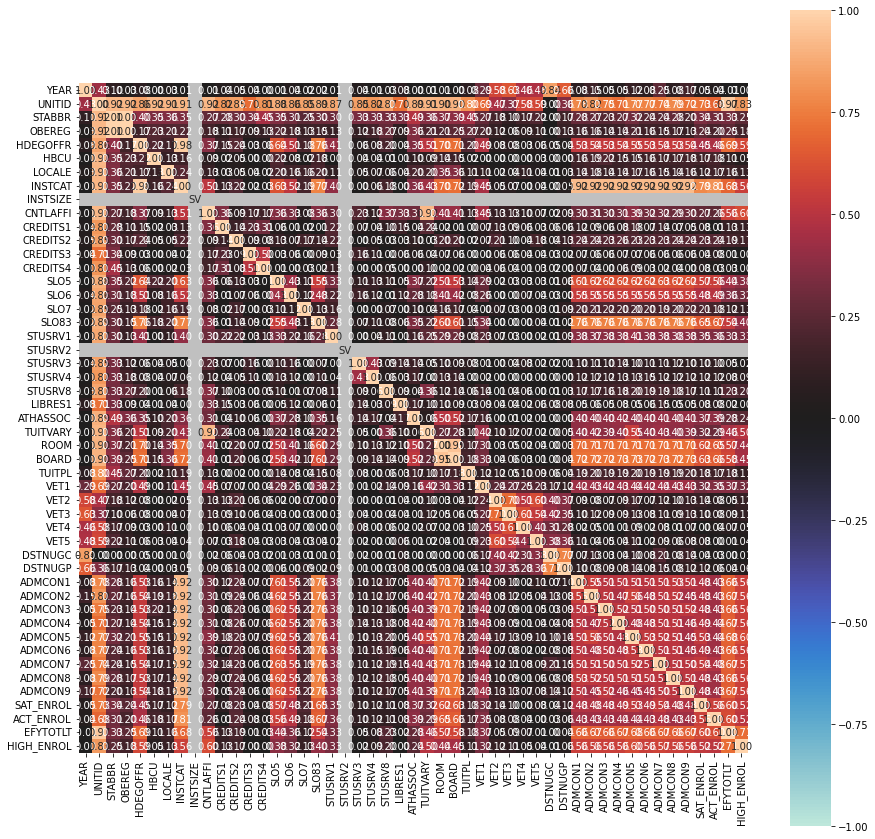

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR      HBCU  \
 YEAR        1.000000  0.434873  0.096891  0.029027  0.078627  0.003251   
 UNITID      0.434873  1.000000  0.921757  0.917454  0.862180  0.916807   
 STABBR      0.096891  0.921757  1.000000  0.995049  0.396852  0.351534   
 OBEREG      0.029027  0.917454  0.995049  1.000000  0.171857  0.228610   
 HDEGOFFR    0.078627  0.862180  0.396852  0.171857  1.000000  0.222523   
 HBCU        0.003251  0.916807  0.351534  0.228610  0.222523  1.000000   
 LOCALE      0.032567  0.907100  0.358830  0.211165  0.173888  0.126161   
 INSTCAT     0.005690  0.912536  0.346681  0.223898  0.975078  0.159262   
 INSTSIZE    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
 CNTLAFFI    0.012408  0.917023  0.268014  0.177688  0.373578  0.086422   
 CREDITS1    0.040265  0.822055  0.276703  0.106932  0.154354  0.019418   
 CREDITS2    0.049181  0.845799  0.300995  0.166340  0.236746  0.0487

In [100]:
associations(df_MIDDLE, figsize=(15, 15))

### Taking a peak at the associations for Middle-sized HEIs, we see that these also ALL offer academic counseling offices 

### Taking a look at the smaller and more numerous groups of HEIs is where the differences in services seem to be more prominent and have a greater effect on enrollments. 

### Neither the smallest nor the second to smallest HEIs in fact have any characteristic that is the same across the board. 
### Furthermore, for this group of institutions, interestingly 

In [101]:
df_2nd_SMALL = df_NOA.loc[lambda df_NOA:(df_NOA['INSTSIZE']=='2'),:].copy(False)

# 2    12500
# 1    11805
# 3     4260
# 4     1518
# 5       94

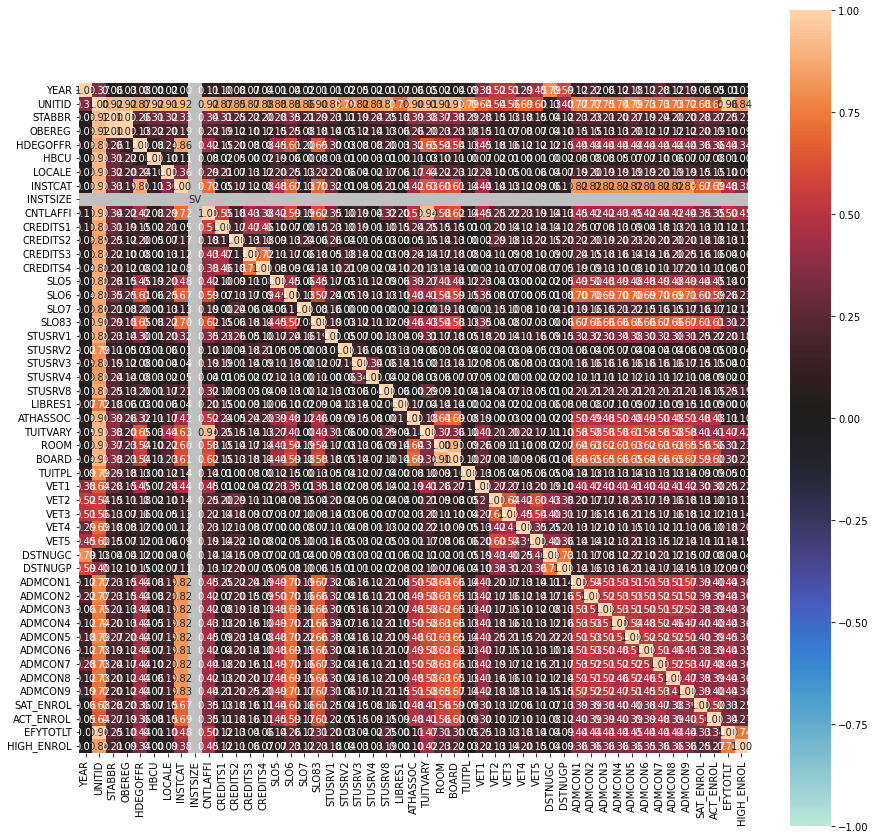

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR      HBCU  \
 YEAR        1.000000  0.366676  0.056498  0.032182  0.084385  0.004469   
 UNITID      0.366676  1.000000  0.923370  0.923673  0.874298  0.923632   
 STABBR      0.056498  0.923370  1.000000  0.998277  0.262363  0.312305   
 OBEREG      0.032182  0.923673  0.998277  1.000000  0.126149  0.220719   
 HDEGOFFR    0.084385  0.874298  0.262363  0.126149  1.000000  0.079093   
 HBCU        0.004469  0.923632  0.312305  0.220719  0.079093  1.000000   
 LOCALE      0.021133  0.913052  0.317182  0.198453  0.242831  0.095203   
 INSTCAT     0.001349  0.915747  0.331233  0.191118  0.864406  0.106828   
 INSTSIZE    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
 CNTLAFFI    0.106462  0.919203  0.341875  0.224804  0.422854  0.075097   
 CREDITS1    0.097929  0.865707  0.306585  0.186815  0.147818  0.021132   
 CREDITS2    0.077906  0.847180  0.247403  0.115902  0.200577  0.0498

In [102]:
associations(df_2nd_SMALL, figsize=(15, 15))

In [103]:
df_SMALL = df_NOA.loc[lambda df_NOA:(df_NOA['INSTSIZE']=='1'),:].copy(False)

# 2    12500
# 1    11805
# 3     4260
# 4     1518
# 5       94

In [104]:
# df_SMALL['HBCU'].value_counts()

In [105]:
# df_2nd_SMALL['HBCU'].value_counts()

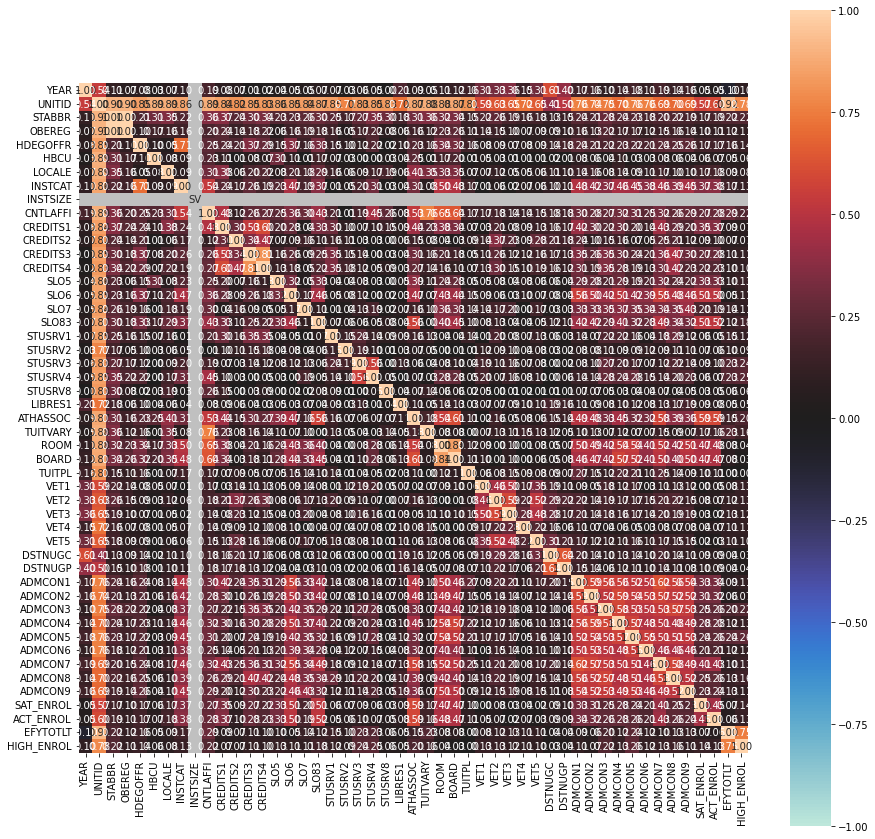

{'ax': <AxesSubplot:>,
 'corr':                 YEAR    UNITID    STABBR    OBEREG  HDEGOFFR      HBCU  \
 YEAR        1.000000  0.544418  0.113807  0.068668  0.078400  0.032112   
 UNITID      0.544418  1.000000  0.903615  0.901412  0.847259  0.892489   
 STABBR      0.113807  0.903615  1.000000  0.998176  0.213877  0.309686   
 OBEREG      0.068668  0.901412  0.998176  1.000000  0.104106  0.168505   
 HDEGOFFR    0.078400  0.847259  0.213877  0.104106  1.000000  0.099420   
 HBCU        0.032112  0.892489  0.309686  0.168505  0.099420  1.000000   
 LOCALE      0.070911  0.887405  0.353749  0.163706  0.053191  0.083763   
 INSTCAT     0.103351  0.860511  0.224986  0.159080  0.706148  0.093053   
 INSTSIZE    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
 CNTLAFFI    0.188225  0.889780  0.359569  0.195980  0.254019  0.233073   
 CREDITS1    0.078750  0.844140  0.367652  0.240048  0.235961  0.113010   
 CREDITS2    0.069607  0.817994  0.238749  0.140146  0.213231  0.0110

In [106]:
associations(df_SMALL, figsize=(15, 15))

### Based on the analysis of the associations existing between the categorical variables and enrollment levels using Cramer's V some interesting patterns emerge

### first of all setting a target of 85% enrollment eliminates all extra-large institutions from the analysis - This group in other words has consistentky not met this target of enrollment over the past years. - 

### Looking at the association between the categorical variables and Overall Enrollment Numbers for Large institutions, however, does not really clarify the situation since almost all variables seems associated and to a high degree. 

### The sheer size of the institutions involved skews the information muddying it. Better measures of variable assoxiation would be necessary - A quick research on the matter led to the identification of some newly proposed methods (Zahng 2019), however, this is a well known challenge that presents itself when working with Categorical variables. 

## Second Largest HEIs
### Looking at the Second largest (and more numerous) group of HEIs in the data set the Institution's location seems to start becoming relevant / have influence on enrollment. 
### In addition:
- type (i.e. whether the HEI offers both undergraduate and graduate level courses) 
- category , and 
- control type 

### all seem to have influence on enrollment as well  but these may be variables counfounding each other.
### Of the variables under HEIs greater control all seem to have influence on Enrollment
### Programs typically offered by larger organizations such as ROTC, Study Abroad, or Remedial Services, or having a strong Athletic progra, all seem to influence enrollment.     

## Middle-size HIEs
### For this group of institutions what stands out as different from the larger organizations is the influence that the Vets Yellow Ribbon Program is having on enrollment (a program launched after September 11 that has been labeled as the new GI-Bill

## Smaller HEIs
### For these institutions, control type seems to be a prominent factor in influencing enrollment
### Other factors play a role but to a lesser extent

## Smallest HEIs
### For the smallest of the set, all factors seem to play to a much smaller extent. Variables that stand out are:
- Employment services for students
- Placement services for thos who finish
- Teacher certification programs (but to a lesser degree) 
- Teachers' recommendations

### These features seem in line with the student segments these institutions serve.

### Given these results it seems to make more sense to take a look at the institutions separately within their more uniform segment in terms of size.  


### Theil Associations might be more revealing here however, I am perplexed by the resuts I get from the function - I will stick to Cramer's V

In [107]:
# associations(df_LARGE, nom_nom_assoc='theil', figsize=(25, 25))

# # https://github.com/shakedzy/dython
# # https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9

In [108]:
df_NOA.drop(['UNITID'], axis=1, inplace=True)


In [109]:
df_NOA.columns

Index(['YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE', 'INSTCAT',
       'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
       'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3',
       'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM',
       'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC',
       'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5',
       'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL',
       'EFYTOTLT', 'HIGH_ENROL'],
      dtype='object')

In [110]:
df_NOA.iloc[:, :-4]

,YEAR,STABBR,OBEREG,HDEGOFFR,HBCU,LOCALE,INSTCAT,INSTSIZE,CNTLAFFI,CREDITS1,...,DSTNUGP,ADMCON1,ADMCON2,ADMCON3,ADMCON4,ADMCON5,ADMCON6,ADMCON7,ADMCON8,ADMCON9
4020,2012,AL,5,10,1,10,2,2,1,1,...,0,1,2,1,2,3,2,1,1,3
4021,2012,AL,5,10,2,10,2,4,1,1,...,0,1,3,1,1,3,3,1,3,3
4022,2012,AL,5,10,2,10,2,1,4,0,...,0,0,0,0,0,0,0,0,0,0
4023,2012,AL,5,10,2,10,2,3,1,1,...,0,1,2,1,1,3,2,1,1,3
4024,2012,AL,5,10,1,10,2,3,1,1,...,0,2,3,2,3,3,3,1,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34554,2020,CA,8,40,2,10,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
34555,2020,CA,8,40,2,20,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
34556,2020,CA,8,40,2,20,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
34557,2020,CA,8,40,2,10,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0


In [111]:
df_NOA.iloc[:, :-2]

,YEAR,STABBR,OBEREG,HDEGOFFR,HBCU,LOCALE,INSTCAT,INSTSIZE,CNTLAFFI,CREDITS1,...,ADMCON2,ADMCON3,ADMCON4,ADMCON5,ADMCON6,ADMCON7,ADMCON8,ADMCON9,SAT_ENROL,ACT_ENROL
4020,2012,AL,5,10,1,10,2,2,1,1,...,2,1,2,3,2,1,1,3,1,2
4021,2012,AL,5,10,2,10,2,4,1,1,...,3,1,1,3,3,1,3,3,1,2
4022,2012,AL,5,10,2,10,2,1,4,0,...,0,0,0,0,0,0,0,0,0,0
4023,2012,AL,5,10,2,10,2,3,1,1,...,2,1,1,3,2,1,1,3,1,1
4024,2012,AL,5,10,1,10,2,3,1,1,...,3,2,3,3,3,1,1,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34554,2020,CA,8,40,2,10,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
34555,2020,CA,8,40,2,20,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
34556,2020,CA,8,40,2,20,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0
34557,2020,CA,8,40,2,10,1,1,2,0,...,0,0,0,0,0,0,0,0,0,0


In [112]:
df_NOA.iloc[:, -2:]

,EFYTOTLT,HIGH_ENROL
4020,4582,1
4021,12962,1
4022,522,1
4023,6983,1
4024,5541,0
...,...,...
34554,182,0
34555,192,0
34556,67,0
34557,51,0


In [113]:
# df.sort_values(by=['col1', 'col2'])
df_NOA.sort_values(by=['YEAR','STABBR','INSTSIZE'])

,YEAR,STABBR,OBEREG,HDEGOFFR,HBCU,LOCALE,INSTCAT,INSTSIZE,CNTLAFFI,CREDITS1,...,ADMCON4,ADMCON5,ADMCON6,ADMCON7,ADMCON8,ADMCON9,SAT_ENROL,ACT_ENROL,EFYTOTLT,HIGH_ENROL
4076,2012,AK,8,30,2,40,1,1,4,1,...,0,0,0,0,0,0,0,0,46,0
4079,2012,AK,8,10,2,10,2,1,4,1,...,2,1,1,1,1,3,1,1,620,1
4081,2012,AK,8,40,2,40,1,1,1,1,...,0,0,0,0,0,0,0,0,2505,1
7466,2012,AK,8,40,2,40,1,1,1,1,...,0,0,0,0,0,0,0,0,620,1
4078,2012,AK,8,20,2,30,2,2,1,1,...,0,0,0,0,0,0,0,0,5787,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33784,2020,WY,7,30,2,20,1,2,1,1,...,0,0,0,0,0,0,0,0,5816,1
33785,2020,WY,7,40,2,30,1,2,1,1,...,0,0,0,0,0,0,0,0,1955,0
33786,2020,WY,7,40,2,30,1,2,1,1,...,0,0,0,0,0,0,0,0,6340,1
33787,2020,WY,7,40,2,30,1,2,1,1,...,0,0,0,0,0,0,0,0,4180,1


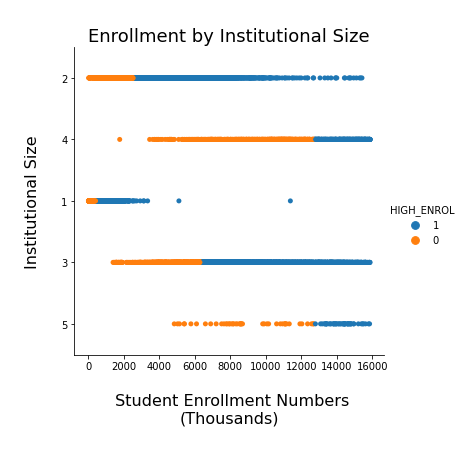

In [114]:
# sns.catplot(x="day", y="total_bill", data=tips)
# sns.catplot(data=df_NOA, x="EFYTOTLT", y="INSTSIZE", hue="HIGH_ENROL")

ax=sns.catplot(data=df_NOA, x="EFYTOTLT", y="INSTSIZE", hue="HIGH_ENROL", jitter=False)
# sns.set_style("whitegrid") 

plt.xlabel("\n Student Enrollment Numbers\n(Thousands)\n", fontsize=16)
plt.ylabel("\nInstitutional Size\n", fontsize=16)
plt.title('\nEnrollment by Institutional Size', fontsize=18)
# # plt.legend(labels=['1= Yes','0 = No'], fontsize=16)

# ax.set(xlabel="\n Student Enrollment Numbers\n(Thousands)\n", 
#        ylabel="\nInstitutional Size\n",
#        title='\nEnrollment by Institutional Size')


#display barplot
plt.show()

<AxesSubplot:xlabel='EFYTOTLT', ylabel='INSTSIZE'>

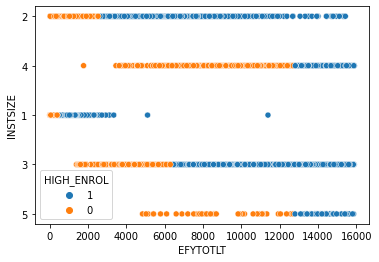

In [115]:
# sns.scatterplot(data=tips, x="total_bill", y="tip")
sns.scatterplot(data=df_NOA, x="EFYTOTLT", y="INSTSIZE", hue="HIGH_ENROL")
# sns.scatterplot(data=df_NOA, x="INSTSIZE", y="EFYTOTLT", hue="HIGH_ENROL", style="OBEREG")
# sns.scatterplot(data=df_NOA, x="EFYTOTLT", y="OBEREG", hue="HIGH_ENROL", style="INSTSIZE")

<AxesSubplot:xlabel='INSTSIZE', ylabel='EFYTOTLT'>

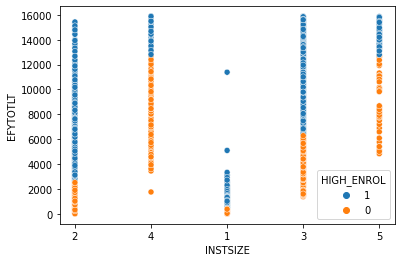

In [116]:
sns.scatterplot(data=df_NOA, x="INSTSIZE", y="EFYTOTLT", hue="HIGH_ENROL")

In [117]:
df_NOA.columns

Index(['YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE', 'INSTCAT',
       'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
       'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3',
       'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM',
       'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC',
       'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5',
       'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL',
       'EFYTOTLT', 'HIGH_ENROL'],
      dtype='object')

In [118]:
df_SMALL.columns

Index(['YEAR', 'UNITID', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE',
       'INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
       'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2',
       'STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
       'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5',
       'DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
       'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL',
       'ACT_ENROL', 'EFYTOTLT', 'HIGH_ENROL'],
      dtype='object')

In [119]:
df_LARGE.columns

Index(['YEAR', 'UNITID', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE',
       'INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
       'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2',
       'STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
       'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5',
       'DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
       'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL',
       'ACT_ENROL', 'EFYTOTLT', 'HIGH_ENROL'],
      dtype='object')

In [120]:
# df_LARGE.value_counts() # CREDITS3','CREDITS4',STUSRV2

In [121]:
# df_LARGE['TUITVARY'].value_counts()

In [122]:
df_all_LARGE['HBCU'].value_counts()

2    1592
1      20
Name: HBCU, dtype: int64

In [123]:
# df_LARGE_1.iloc[:, -2:-1]

In [124]:
# df_LARGE_1.iloc[:, :-1]

In [125]:
df_2nd_LARGE['ACT_ENROL'].value_counts() #162928

1    556
2    515
0    416
3     31
Name: ACT_ENROL, dtype: int64

In [126]:
# df_2nd_LARGE

### Prior to running our Machine Learning algorithm on our categorical data, I decide to run the XGBoost regressor algorithm on four different groups of HEIs and check both results and comparative results. 
### The groups will be the following, based on HEIs sizes: 
- smallest HEIs
- Second to smallest HEIs
- Medium sized HEIs
- Largest HEIs

In [127]:
def feature_importance():
  feat_imp = clf.named_steps['regressor'].feature_importances_
  feature_names=clf.named_steps['preprocessor'].get_feature_names_out(input_features=None)
  feature_names_ = pd.Series(feature_names)
  feature_names_.replace('^num__','',regex=True, inplace = True)
  feature_names_.replace('^cat__','',regex=True, inplace = True)
  feats = pd.DataFrame(feat_imp, columns=['FEAT_IMP'])
  feats = pd.concat([feats, feature_names_], axis=1)
  feats.rename(columns={feats.columns[1]: "FEAT_NAME"}, inplace=True)
  feats.sort_values("FEAT_IMP", ascending = False, inplace=True)
  graph_c=feats[:25].plot(kind='bar', width = 0.5, figsize=(18,5), fontsize = 18)
  graph_c.set_xlabel("\nFeatures\n", fontsize = 16)
  graph_c.set_xticklabels(feats['FEAT_NAME'][:25])
  graph_c.set_ylabel("\nWeight\n", fontsize=16)
  graph_c.set_title("Feature importance in Time_Split model\n", fontsize = 21)
  return graph_c

In [128]:
df_all_LARGE_1=df_all_LARGE.copy(deep=False)
df_all_LARGE_1.drop(['UNITID','INSTSIZE'], axis=1, inplace=True)



Observations n: 324 split n: 1

Training Observations: 163 
Training Predictions: 163

Testing Observations: 161 
Testing Predictions: 161
[19:57:30] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 50.24%

Testing Data Model Accuracy 
(R-squared for Testing Data): 38.31%

Mean absolute error (MAE) (train data):  1699.51 
Mean squared error (MSE) (train data):  4261906.06 
Root Mean squared error (RMSE) (train data):  2064.44 

Mean absolute error (MAE) (test data):  1880.5 
Mean squared error (MSE) (test data):  5457715.04 
Root Mean squared error (RMSE) (test data):  2336.18 



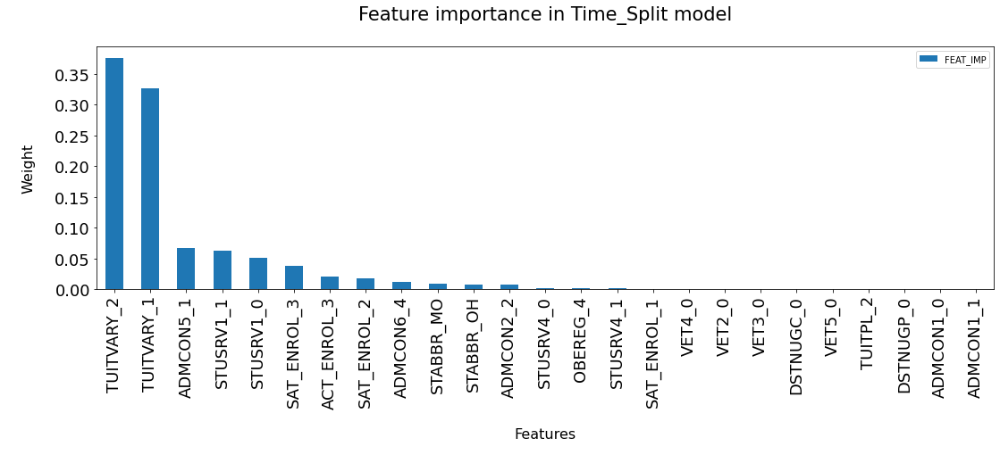

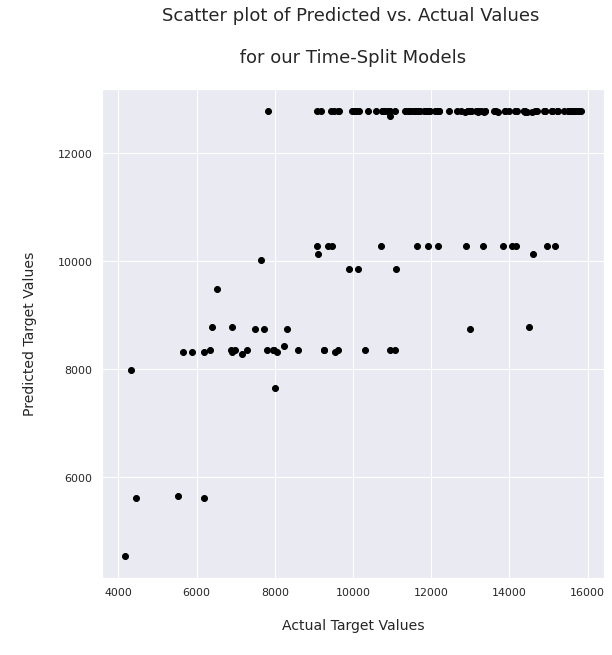


Observations n: 485 split n: 2

Training Observations: 324 
Training Predictions: 324

Testing Observations: 161 
Testing Predictions: 161
[19:57:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 51.44%

Testing Data Model Accuracy 
(R-squared for Testing Data): 32.27%

Mean absolute error (MAE) (train data):  1688.77 
Mean squared error (MSE) (train data):  4227697.77 
Root Mean squared error (RMSE) (train data):  2056.14 

Mean absolute error (MAE) (test data):  1869.88 
Mean squared error (MSE) (test data):  5558170.67 
Root Mean squared error (RMSE) (test data):  2357.58 



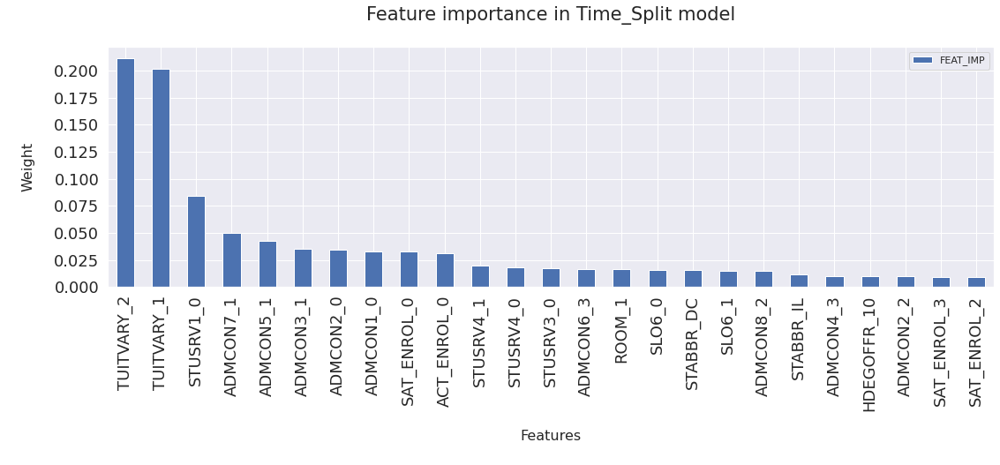

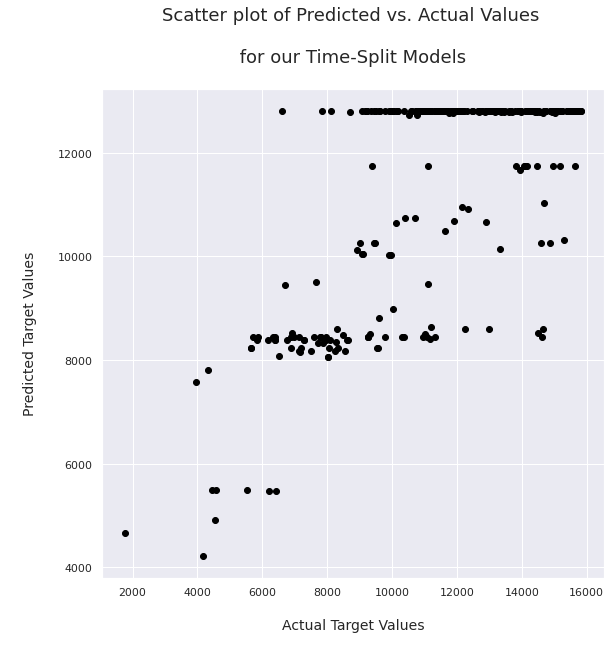


Observations n: 646 split n: 3

Training Observations: 485 
Training Predictions: 485

Testing Observations: 161 
Testing Predictions: 161
[19:57:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 52.94%

Testing Data Model Accuracy 
(R-squared for Testing Data): 44.24%

Mean absolute error (MAE) (train data):  1617.15 
Mean squared error (MSE) (train data):  4019526.66 
Root Mean squared error (RMSE) (train data):  2004.88 

Mean absolute error (MAE) (test data):  1653.48 
Mean squared error (MSE) (test data):  4248602.41 
Root Mean squared error (RMSE) (test data):  2061.21 



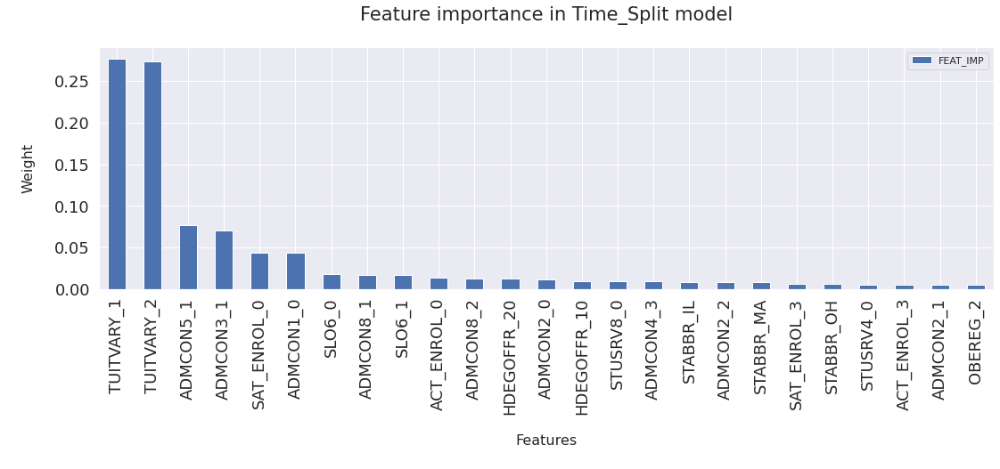

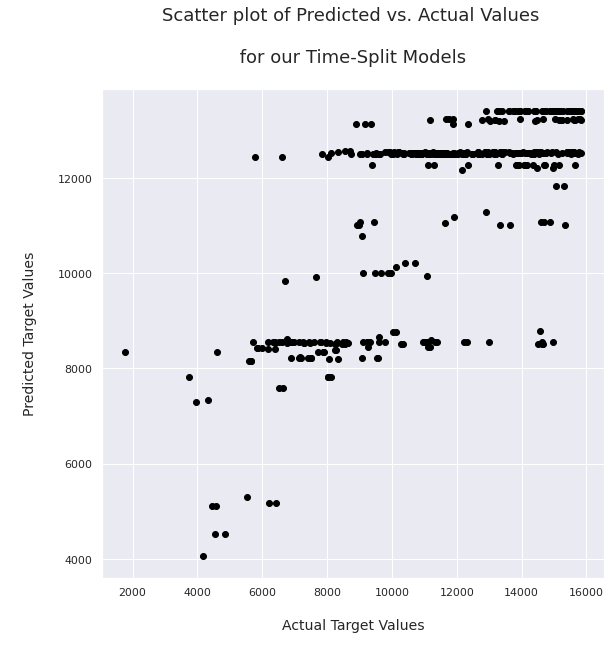


Observations n: 807 split n: 4

Training Observations: 646 
Training Predictions: 646

Testing Observations: 161 
Testing Predictions: 161
[19:57:32] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 57.61%

Testing Data Model Accuracy 
(R-squared for Testing Data): 51.92%

Mean absolute error (MAE) (train data):  1495.99 
Mean squared error (MSE) (train data):  3528679.76 
Root Mean squared error (RMSE) (train data):  1878.48 

Mean absolute error (MAE) (test data):  1554.31 
Mean squared error (MSE) (test data):  3808560.85 
Root Mean squared error (RMSE) (test data):  1951.55 



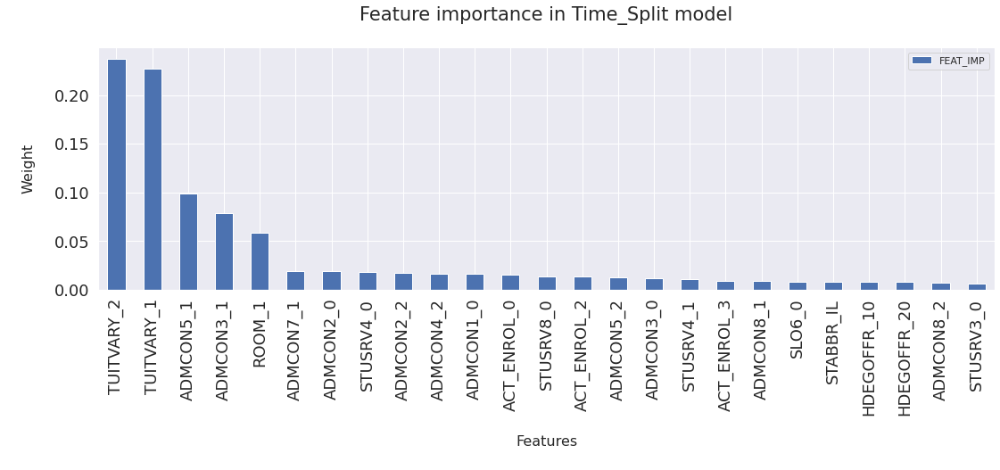

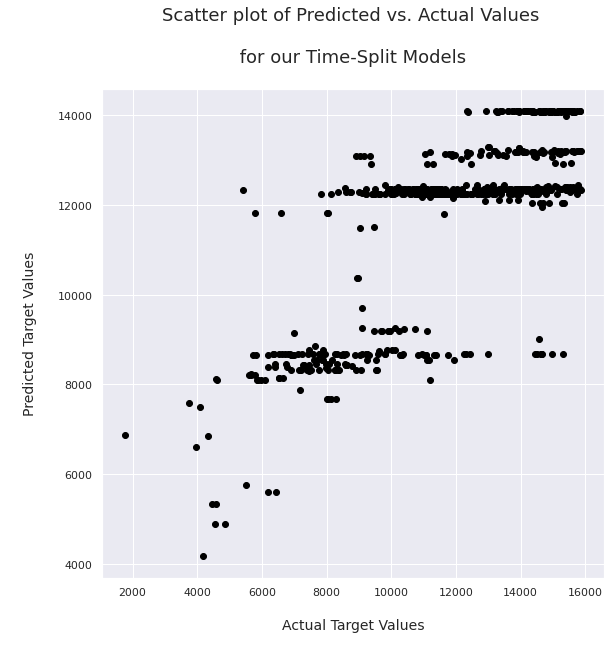


Observations n: 968 split n: 5

Training Observations: 807 
Training Predictions: 807

Testing Observations: 161 
Testing Predictions: 161
[19:57:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 58.23%

Testing Data Model Accuracy 
(R-squared for Testing Data): 47.08%

Mean absolute error (MAE) (train data):  1472.21 
Mean squared error (MSE) (train data):  3445995.08 
Root Mean squared error (RMSE) (train data):  1856.34 

Mean absolute error (MAE) (test data):  1570.55 
Mean squared error (MSE) (test data):  4289514.22 
Root Mean squared error (RMSE) (test data):  2071.11 



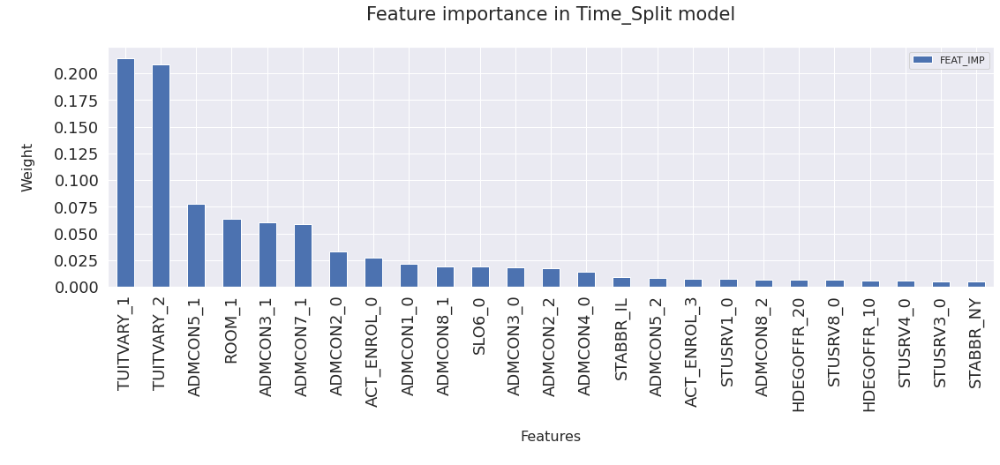

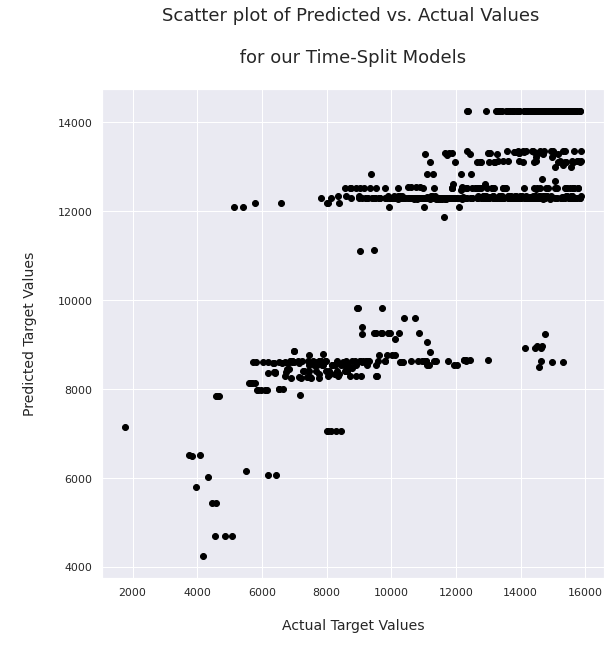


Observations n: 1129 split n: 6

Training Observations: 968 
Training Predictions: 968

Testing Observations: 161 
Testing Predictions: 161
[19:57:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 56.92%

Testing Data Model Accuracy 
(R-squared for Testing Data): 47.24%

Mean absolute error (MAE) (train data):  1489.41 
Mean squared error (MSE) (train data):  3544273.74 
Root Mean squared error (RMSE) (train data):  1882.62 

Mean absolute error (MAE) (test data):  1645.22 
Mean squared error (MSE) (test data):  4373862.01 
Root Mean squared error (RMSE) (test data):  2091.38 



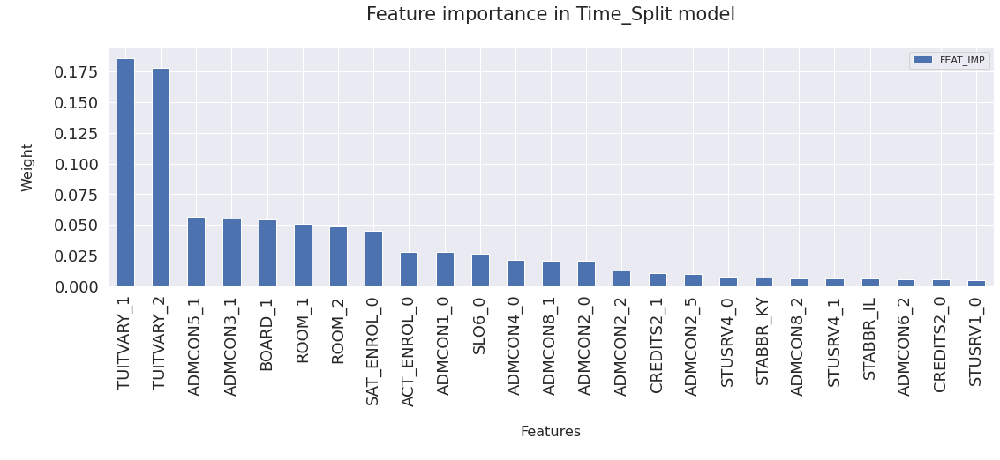

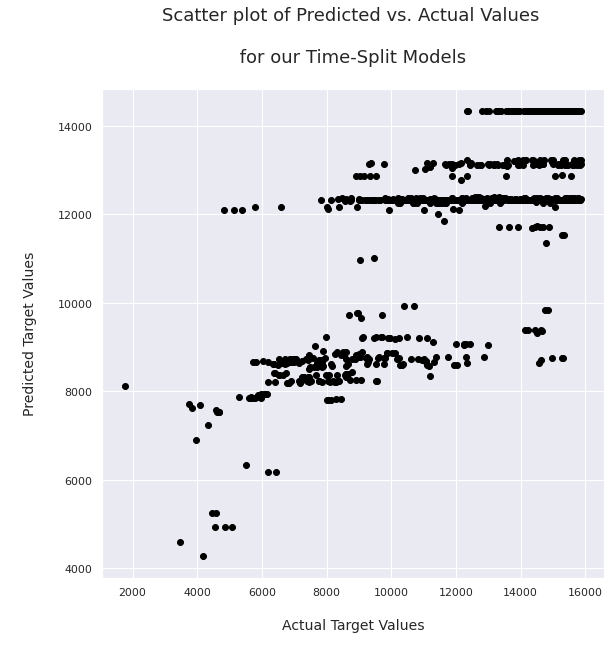


Observations n: 1290 split n: 7

Training Observations: 1129 
Training Predictions: 1129

Testing Observations: 161 
Testing Predictions: 161
[19:57:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 57.45%

Testing Data Model Accuracy 
(R-squared for Testing Data): 62.75%

Mean absolute error (MAE) (train data):  1483.82 
Mean squared error (MSE) (train data):  3504499.77 
Root Mean squared error (RMSE) (train data):  1872.03 

Mean absolute error (MAE) (test data):  1459.25 
Mean squared error (MSE) (test data):  3254164.76 
Root Mean squared error (RMSE) (test data):  1803.93 



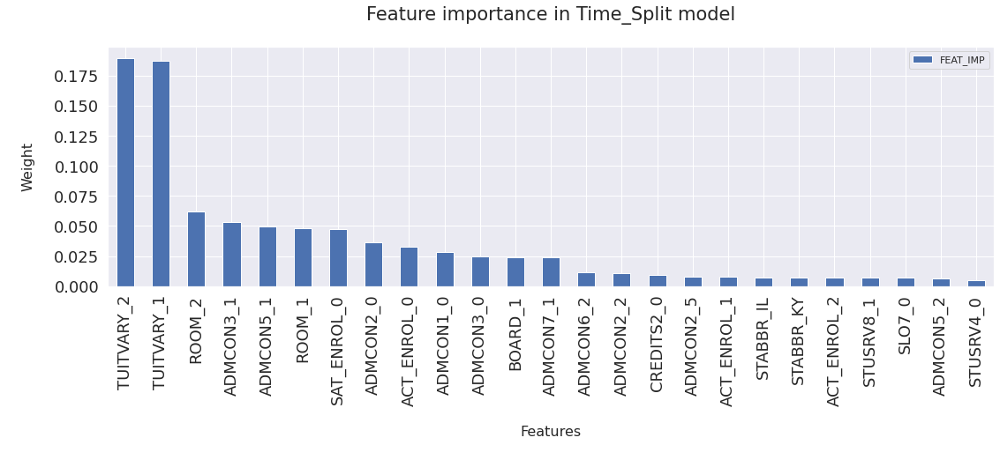

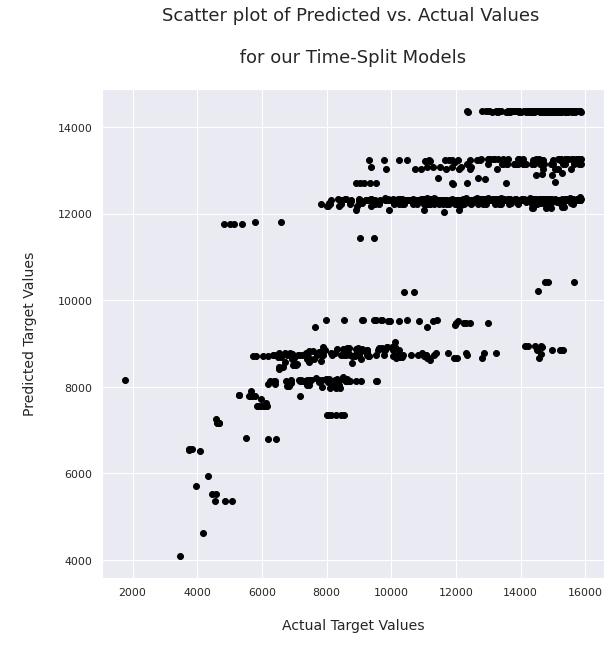


Observations n: 1451 split n: 8

Training Observations: 1290 
Training Predictions: 1290

Testing Observations: 161 
Testing Predictions: 161
[19:57:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 59.25%

Testing Data Model Accuracy 
(R-squared for Testing Data): 47.04%

Mean absolute error (MAE) (train data):  1461.46 
Mean squared error (MSE) (train data):  3381393.22 
Root Mean squared error (RMSE) (train data):  1838.86 

Mean absolute error (MAE) (test data):  1611.02 
Mean squared error (MSE) (test data):  4272911.34 
Root Mean squared error (RMSE) (test data):  2067.1 



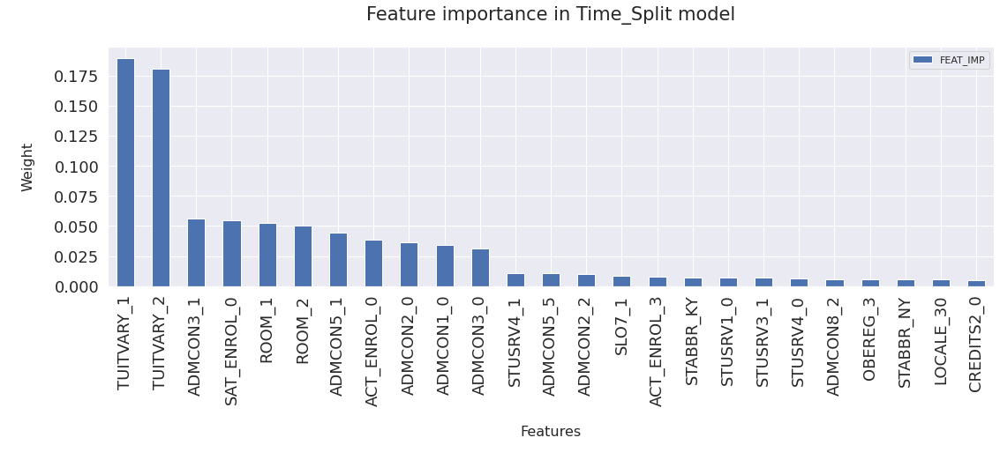

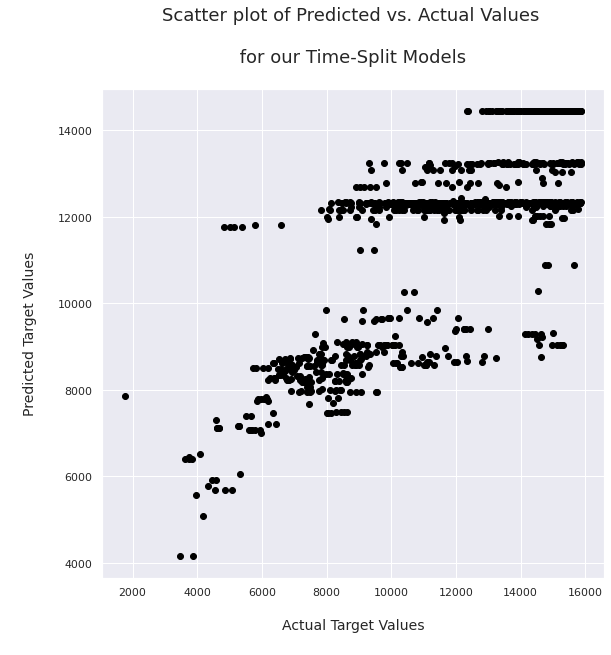


Observations n: 1612 split n: 9

Training Observations: 1451 
Training Predictions: 1451

Testing Observations: 161 
Testing Predictions: 161
[19:57:38] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 58.45%

Testing Data Model Accuracy 
(R-squared for Testing Data): 47.38%

Mean absolute error (MAE) (train data):  1473.63 
Mean squared error (MSE) (train data):  3438966.89 
Root Mean squared error (RMSE) (train data):  1854.45 

Mean absolute error (MAE) (test data):  1647.53 
Mean squared error (MSE) (test data):  4186941.17 
Root Mean squared error (RMSE) (test data):  2046.2 



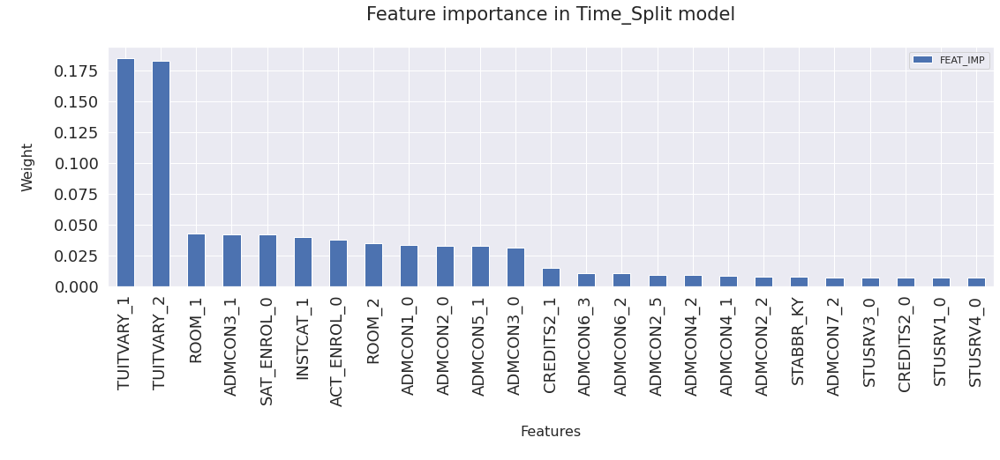

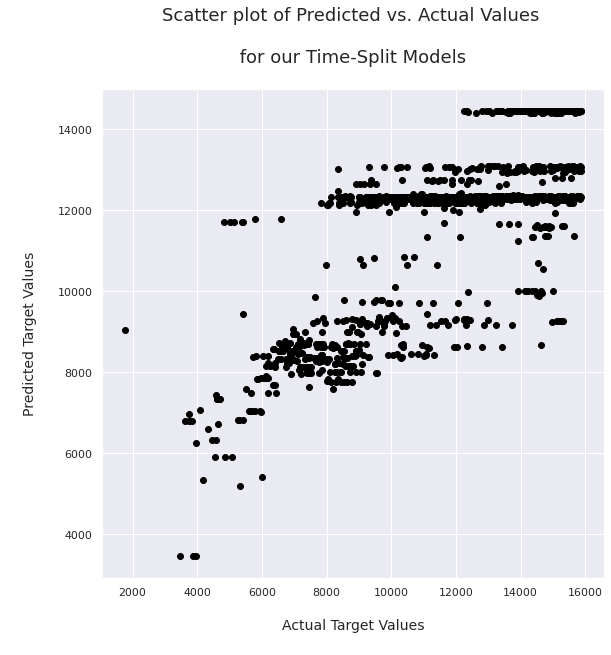

In [129]:
# https://towardsdatascience.com/an-introduction-to-logistic-regression-for-categorical-data-analysis-7cabc551546c
# https://medium.com/@curryrowan/simplified-logistic-regression-classification-with-categorical-variables-in-python-1ce50c4b137


# Dropping some of the unnecessary columns 
# ['YEAR', 'UNITID', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE',
      #  'INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
      #  'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2',
      #  'STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
      #  'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5',
      #  'DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
      #  'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL',
      #  'ACT_ENROL', 'EFYTOTLT', 'HIGH_ENROL']

X = df_all_LARGE_1.iloc[:, :-2].values
y = df_all_LARGE_1.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU','LOCALE', 'INSTCAT','CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  
# # 'YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE','INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
#   'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2','STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
#   'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5','DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
#   'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL', 'EFYTOTLT','HIGH_ENROL'

  X_test.set_axis(['YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU','LOCALE', 'INSTCAT','CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)

  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU','LOCALE', 'INSTCAT','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  scaler = ColumnTransformer(
      transformers=[
          ("num", numeric_transformer, numeric_features),
          ("cat", categorical_transformer, categorical_features)
      ]
  )

  scaler_y = RobustScaler()

  model_xgboost = XGBRFRegressor(learning_rate= 1, max_depth= 5, n_estimators=100, subsample=0.7, colsample_bynode=0.8)

# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.
  clf = Pipeline(
      steps=[("preprocessor", scaler),("out_prep", scaler_y), ("regressor", model_xgboost)]
  )

  # clf.info()
  clf.fit(X_train, y_train)
  # 
  # Model Performance on training data AND on testing data
  scores_accuracy_train = clf.score(X_train, y_train)
  print("\nTraining Data Model Accuracy \n(R-squared for Training Data): %.2f%%\n" % (scores_accuracy_train*100))
  scores_accuracy_test = clf.score(X_test, y_test)
  print("Testing Data Model Accuracy \n(R-squared for Testing Data): %.2f%%\n" % (scores_accuracy_test*100))

  y_test_scaled_predicted = clf.predict(X_test)

  y_train_scaled_predicted = clf.predict(X_train)

  feature_importance()

  # print("\nR-Squared (test data): ", round((r2_score(y_test, y_test_scaled_predicted)*100), 2), '%\n')
  # print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")

  print("Mean absolute error (MAE) (train data): ", round((mean_absolute_error(y_train, y_train_scaled_predicted)), 2), '')
  print("Mean squared error (MSE) (train data): ", round((mean_squared_error(y_train, y_train_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (train data): ", round((np.sqrt(mean_squared_error(y_train, y_train_scaled_predicted))), 2),'\n')
  
  print("Mean absolute error (MAE) (test data): ", round((mean_absolute_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Mean squared error (MSE) (test data): ", round((mean_squared_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (test data): ", round((np.sqrt(mean_squared_error(y_test, y_test_scaled_predicted))), 2),'\n')

  # print("The larger value of the MSE on the test dataset the more problematic is the model's performance (Overfitting)\n\n")

  # print("R-Squared (train data): ", round((r2_score(y_train, y_train_scaled_predicted)*100), 2), '%\n')

  sns.set(rc = {'figure.figsize':(9,9)})

  fig, ax = plt.subplots()
  ax.scatter(y_train, y_train_scaled_predicted,  color='black')
  ax.set_title("Scatter plot of Predicted vs. Actual Values \n \n for our Time-Split Models \n", fontsize=18)
  ax.set_xlabel("\nActual Target Values\n", fontsize=14)
  ax.set_ylabel("\nPredicted Target Values\n", fontsize=14)
  # plt.add_artist(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.line(xy1=(0, 0), slope=1, color='r', lw=2)
  # plt.lines.Line2D((0, 0), (1, 1), linewidth=4, color='r')
  # ax.Axes.axline(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.axline([0, 0], [1, 1], linewidth=4, color='r')
  plt.show()

  i = i+1

# print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")  

# print("The larger value of the MSE on the test dataset the more problematic is the model's performance. \nThe smaller the MSE, in fact, the closer the fit is to the data. \n")

# print("The RMSE is however a better and more easily interpretable measure of theerror. \nFor our model, the RMSE tells us directly how many students 
# we are off on average in our yearly prediction of Enrollment Numbers.\n The presence of outilers is surely affecting our predictions, as is the wide variety in Institutional size.")

In [130]:
# df_2nd_LARGE_1=df_2nd_LARGE.copy(deep=False)
# df_2nd_LARGE_1.drop(['UNITID','INSTSIZE','STABBR','LOCALE','CNTLAFFI','INSTCAT'], axis=1, inplace=True) #'INSTCAT','HDEGOFFR','HBCU'

In [131]:
# # https://towardsdatascience.com/an-introduction-to-logistic-regression-for-categorical-data-analysis-7cabc551546c
# # https://medium.com/@curryrowan/simplified-logistic-regression-classification-with-categorical-variables-in-python-1ce50c4b137

# # SAT_ENROL and ACT_ENROL CODES:
# # 0 = none
# # 1 = less than 10%
# # 2 = between 10 and 20%
# # 3 = between 20% and 30%
# # 4 = between 30% and 40%
# # 5 =  greater than 40%

# from sklearn.model_selection import TimeSeriesSplit

# X = df_2nd_LARGE_1.iloc[:, :-2].values
# y = df_2nd_LARGE_1.iloc[:, -2:-1].values
# splits = TimeSeriesSplit(n_splits=9)
# i = 1
# for train_index, test_index in splits.split(X, y):
#   # print("TRAIN:", train_index, "TEST:", test_index)
#   X_train, X_test = X[train_index], X[test_index]
#   y_train, y_test = y[train_index], y[test_index]
#   print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
#   print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
#   print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
#   X_train = pd.DataFrame(X_train)
#   y_train = pd.DataFrame(y_train)
#   X_test = pd.DataFrame(X_test)
#   y_test = pd.DataFrame(y_test)
#   X_train.set_axis(['YEAR', 'OBEREG', 'HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
#                     'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
#                     'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
#                     'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  
# # # 'YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE','INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
# #   'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2','STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
# #   'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5','DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
# #   'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL', 'EFYTOTLT','HIGH_ENROL'

#   X_test.set_axis(['YEAR', 'OBEREG', 'HDEGOFFR','HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
#                     'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
#                     'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
#                     'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
#   y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
#   y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

#   X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
#   X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
#   y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
#   y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)

#   numeric_features = ['YEAR']
#   numeric_transformer = RobustScaler()
#   numeric_out =['EFYTOTLT']

#   categorical_features = ['OBEREG', 'HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
#                           'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
#                           'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
#                           'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
#   categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

#   scaler = ColumnTransformer(
#       transformers=[
#           ("num", numeric_transformer, numeric_features),
#           ("cat", categorical_transformer, categorical_features)
#       ]
#   )

#   scaler_y = RobustScaler()

#   model_xgboost = XGBRFRegressor(learning_rate= 1, max_depth= 5, n_estimators=100, subsample=0.7, colsample_bynode=0.8)

# # Append classifier to preprocessing pipeline.
# # Now we have a full prediction pipeline.
#   clf = Pipeline(
#       steps=[("preprocessor", scaler),("out_prep", scaler_y), ("regressor", model_xgboost)]
#   )

#   # clf.info()
#   clf.fit(X_train, y_train)
#   # 
#   # Model Performance on training data AND on testing data
#   scores_accuracy_train = clf.score(X_train, y_train)
#   print("\nTraining Data Model Accuracy \n(R-squared for Training Data): %.2f%%\n" % (scores_accuracy_train*100))
#   scores_accuracy_test = clf.score(X_test, y_test)
#   print("Testing Data Model Accuracy \n(R-squared for Testing Data): %.2f%%\n" % (scores_accuracy_test*100))

#   y_test_scaled_predicted = clf.predict(X_test)

#   y_train_scaled_predicted = clf.predict(X_train)

#   feature_importance()


#   # print("\nR-Squared (test data): ", round((r2_score(y_test, y_test_scaled_predicted)*100), 2), '%\n')
#   # print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")

#   print("Mean absolute error (MAE) (train data): ", round((mean_absolute_error(y_train, y_train_scaled_predicted)), 2), '')
#   print("Mean squared error (MSE) (train data): ", round((mean_squared_error(y_train, y_train_scaled_predicted)), 2),'')
#   print("Root Mean squared error (RMSE) (train data): ", round((np.sqrt(mean_squared_error(y_train, y_train_scaled_predicted))), 2),'\n')
  
#   print("Mean absolute error (MAE) (test data): ", round((mean_absolute_error(y_test, y_test_scaled_predicted)), 2),'')
#   print("Mean squared error (MSE) (test data): ", round((mean_squared_error(y_test, y_test_scaled_predicted)), 2),'')
#   print("Root Mean squared error (RMSE) (test data): ", round((np.sqrt(mean_squared_error(y_test, y_test_scaled_predicted))), 2),'\n')

#   # print("The larger value of the MSE on the test dataset the more problematic is the model's performance (Overfitting)\n\n")

#   # print("R-Squared (train data): ", round((r2_score(y_train, y_train_scaled_predicted)*100), 2), '%\n')

#   sns.set(rc = {'figure.figsize':(9,9)})

#   fig, ax = plt.subplots()
#   ax.scatter(y_train, y_train_scaled_predicted,  color='black')
#   ax.set_title("Scatter plot of Predicted vs. Actual Values \n \n for our Time-Split Models \n", fontsize=18)
#   ax.set_xlabel("\nActual Target Values\n", fontsize=14)
#   ax.set_ylabel("\nPredicted Target Values\n", fontsize=14)
#   # plt.add_artist(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
#   # ax.line(xy1=(0, 0), slope=1, color='r', lw=2)
#   # plt.lines.Line2D((0, 0), (1, 1), linewidth=4, color='r')
#   # ax.Axes.axline(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
#   # ax.axline([0, 0], [1, 1], linewidth=4, color='r')
#   plt.show()


#   i = i+1

# print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")  

# print("The larger value of the MSE on the test dataset the more problematic is the model's performance. \nThe smaller the MSE, in fact, the closer the fit is to the data. \n")

# print("The RMSE is however a better and more easily interpretable measure of theerror. \nFor our model, the RMSE tells us directly how many students we are off on average in our yearly prediction of Enrollment Numbers.\n The presence of outilers is surely affecting our predictions, as is the wide variety in Institutional size.")

In [132]:
df_MIDDLE_1=df_MIDDLE.copy(deep=False)
df_MIDDLE_1.drop(['UNITID','INSTSIZE'], axis=1, inplace=True) #'INSTCAT','HDEGOFFR','HBCU'


Observations n: 852 split n: 1

Training Observations: 426 
Training Predictions: 426

Testing Observations: 426 
Testing Predictions: 426
[19:57:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 56.77%

Testing Data Model Accuracy 
(R-squared for Testing Data): 54.16%

Mean absolute error (MAE) (train data):  1539.4 
Mean squared error (MSE) (train data):  3897086.2 
Root Mean squared error (RMSE) (train data):  1974.1 

Mean absolute error (MAE) (test data):  1603.35 
Mean squared error (MSE) (test data):  4303496.68 
Root Mean squared error (RMSE) (test data):  2074.49 



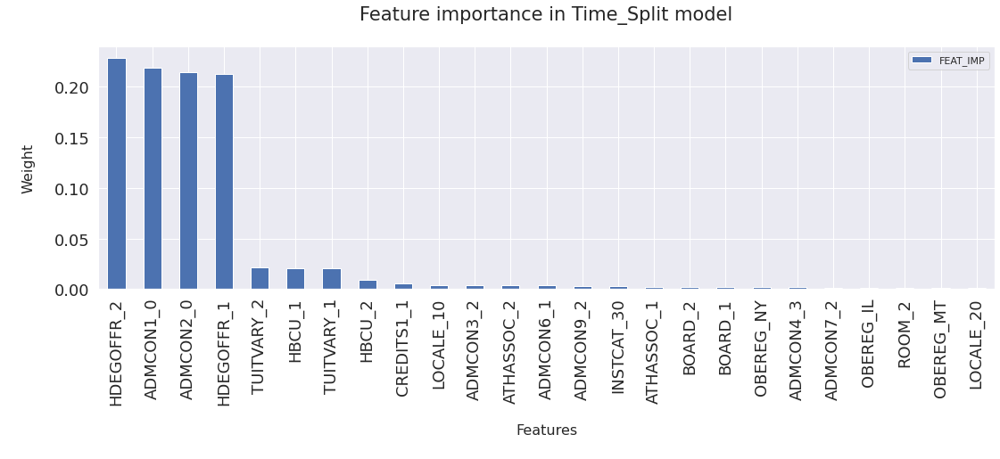

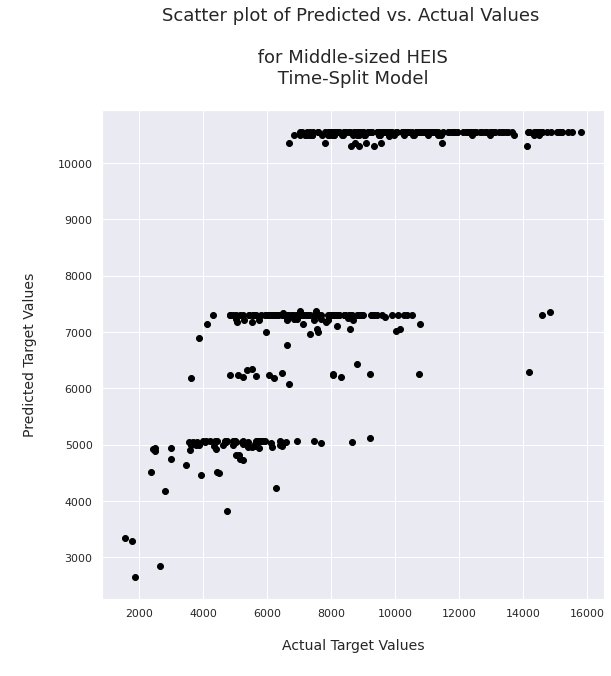


Observations n: 1278 split n: 2

Training Observations: 852 
Training Predictions: 852

Testing Observations: 426 
Testing Predictions: 426
[19:57:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 60.69%

Testing Data Model Accuracy 
(R-squared for Testing Data): 57.70%

Mean absolute error (MAE) (train data):  1497.4 
Mean squared error (MSE) (train data):  3620783.25 
Root Mean squared error (RMSE) (train data):  1902.84 

Mean absolute error (MAE) (test data):  1565.85 
Mean squared error (MSE) (test data):  3801311.03 
Root Mean squared error (RMSE) (test data):  1949.7 



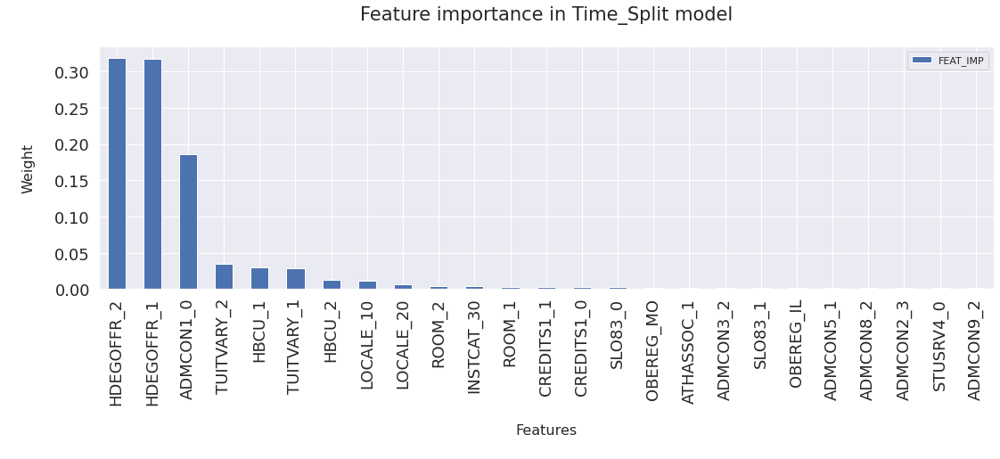

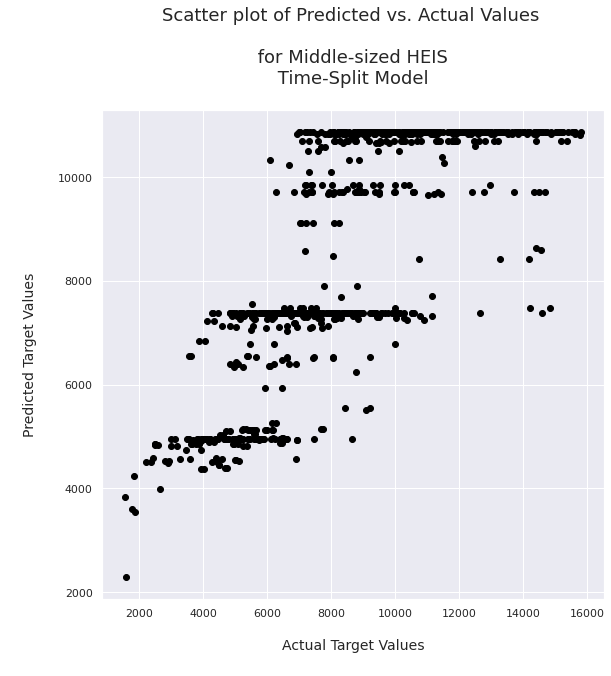


Observations n: 1704 split n: 3

Training Observations: 1278 
Training Predictions: 1278

Testing Observations: 426 
Testing Predictions: 426
[19:57:41] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 61.16%

Testing Data Model Accuracy 
(R-squared for Testing Data): 58.06%

Mean absolute error (MAE) (train data):  1492.72 
Mean squared error (MSE) (train data):  3550738.19 
Root Mean squared error (RMSE) (train data):  1884.34 

Mean absolute error (MAE) (test data):  1595.72 
Mean squared error (MSE) (test data):  3908063.41 
Root Mean squared error (RMSE) (test data):  1976.88 



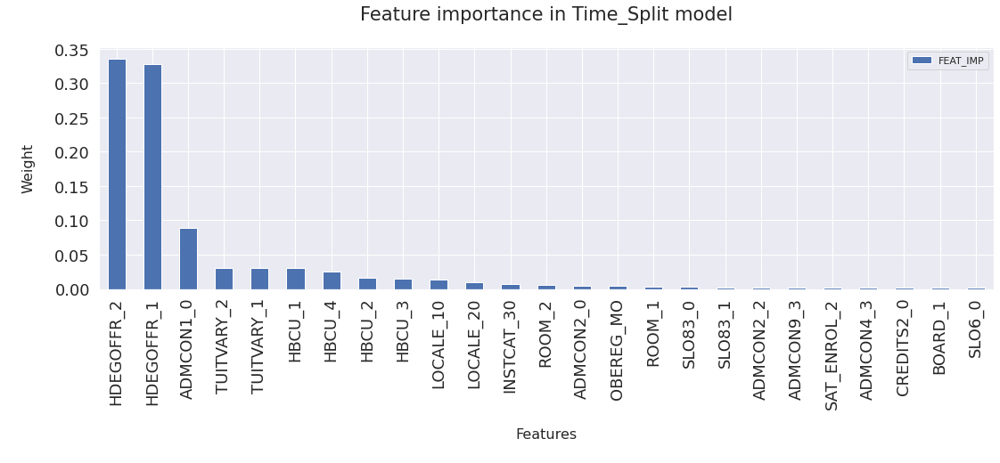

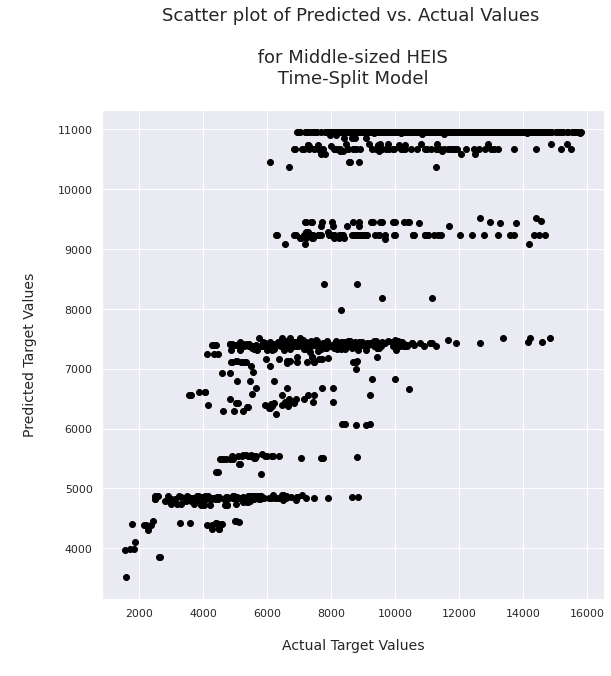


Observations n: 2130 split n: 4

Training Observations: 1704 
Training Predictions: 1704

Testing Observations: 426 
Testing Predictions: 426
[19:57:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 61.86%

Testing Data Model Accuracy 
(R-squared for Testing Data): 55.50%

Mean absolute error (MAE) (train data):  1489.37 
Mean squared error (MSE) (train data):  3503759.88 
Root Mean squared error (RMSE) (train data):  1871.83 

Mean absolute error (MAE) (test data):  1622.67 
Mean squared error (MSE) (test data):  4023174.06 
Root Mean squared error (RMSE) (test data):  2005.79 



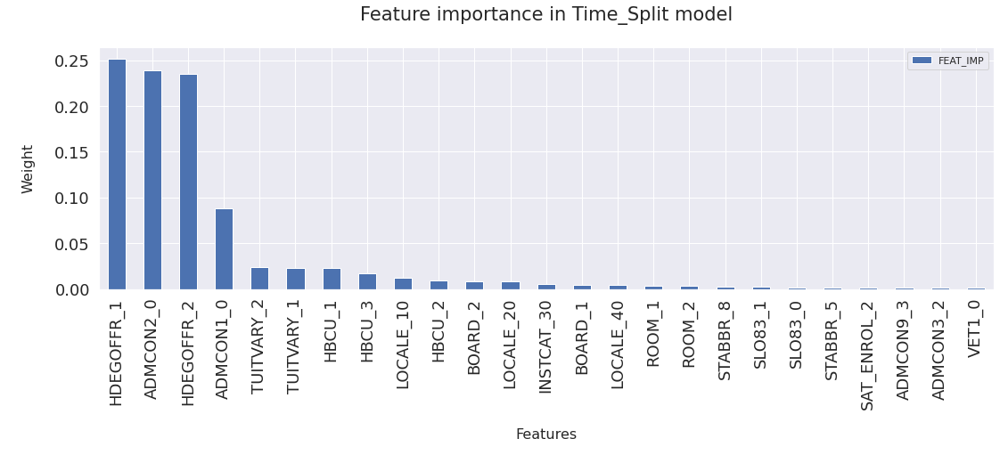

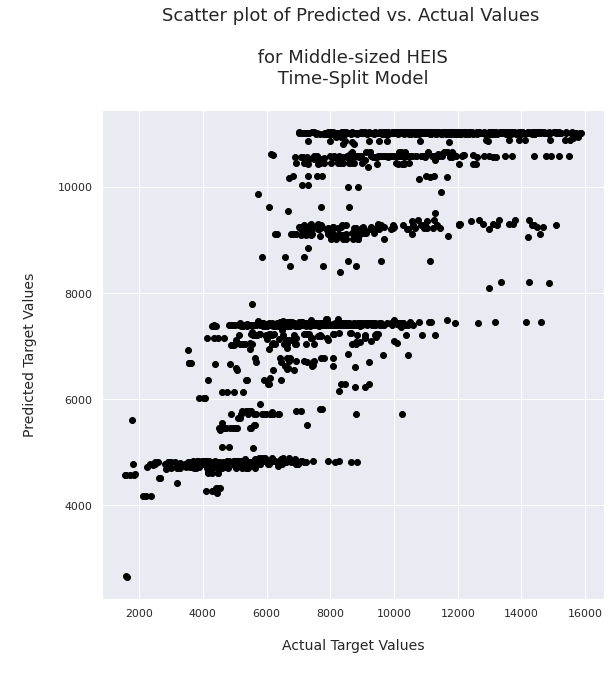


Observations n: 2556 split n: 5

Training Observations: 2130 
Training Predictions: 2130

Testing Observations: 426 
Testing Predictions: 426
[19:57:44] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 62.47%

Testing Data Model Accuracy 
(R-squared for Testing Data): 57.84%

Mean absolute error (MAE) (train data):  1482.4 
Mean squared error (MSE) (train data):  3436529.21 
Root Mean squared error (RMSE) (train data):  1853.79 

Mean absolute error (MAE) (test data):  1617.03 
Mean squared error (MSE) (test data):  3949572.02 
Root Mean squared error (RMSE) (test data):  1987.35 



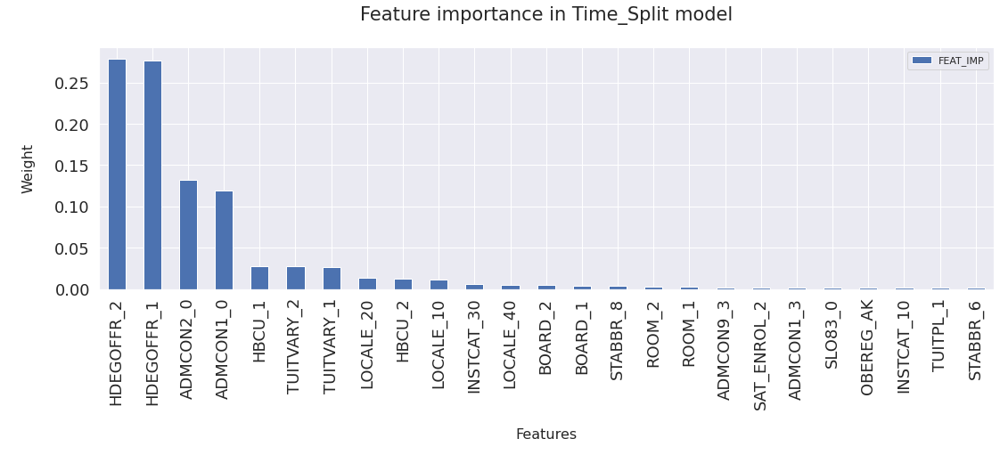

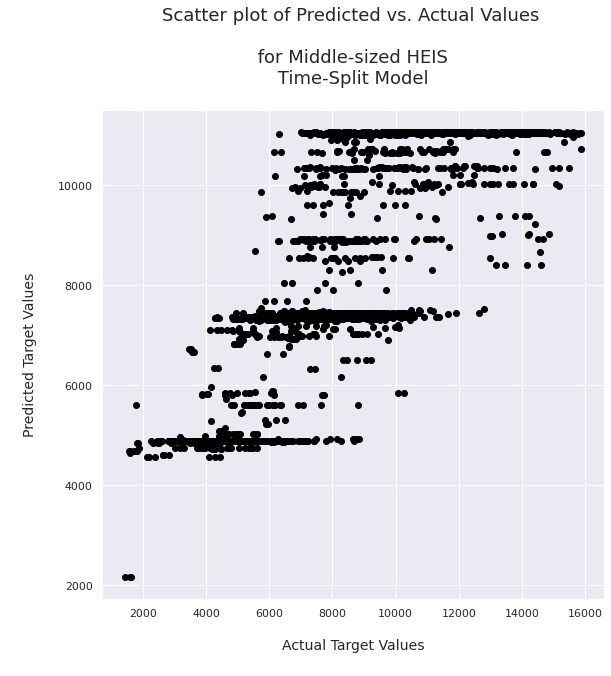


Observations n: 2982 split n: 6

Training Observations: 2556 
Training Predictions: 2556

Testing Observations: 426 
Testing Predictions: 426
[19:57:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 62.60%

Testing Data Model Accuracy 
(R-squared for Testing Data): 59.14%

Mean absolute error (MAE) (train data):  1485.31 
Mean squared error (MSE) (train data):  3438009.24 
Root Mean squared error (RMSE) (train data):  1854.19 

Mean absolute error (MAE) (test data):  1512.51 
Mean squared error (MSE) (test data):  3546911.96 
Root Mean squared error (RMSE) (test data):  1883.32 



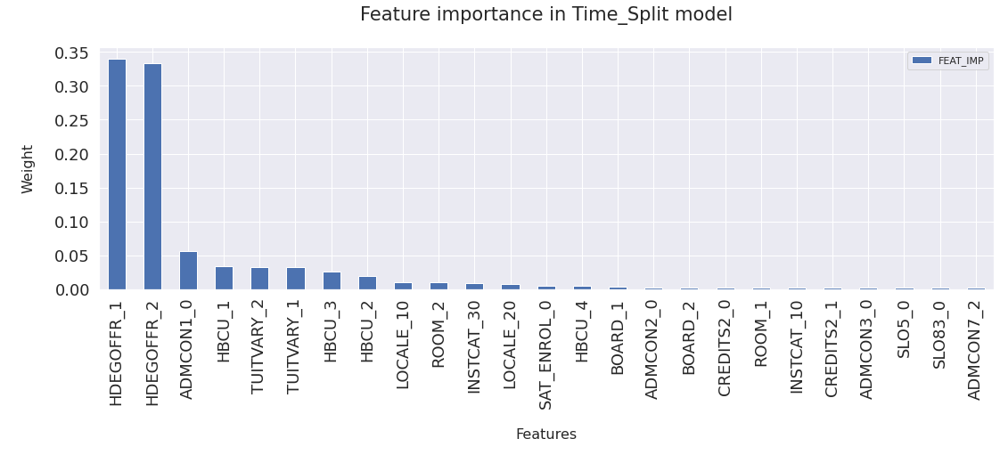

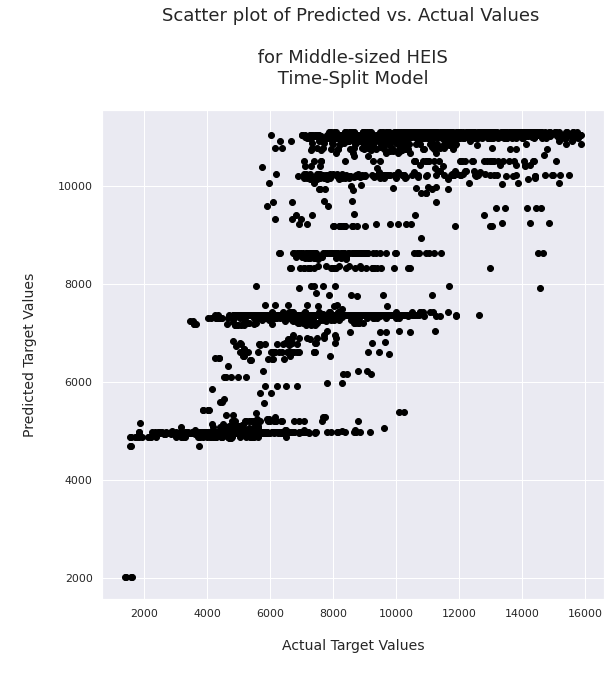


Observations n: 3408 split n: 7

Training Observations: 2982 
Training Predictions: 2982

Testing Observations: 426 
Testing Predictions: 426
[19:57:49] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 62.70%

Testing Data Model Accuracy 
(R-squared for Testing Data): 60.54%

Mean absolute error (MAE) (train data):  1479.94 
Mean squared error (MSE) (train data):  3403523.38 
Root Mean squared error (RMSE) (train data):  1844.86 

Mean absolute error (MAE) (test data):  1477.53 
Mean squared error (MSE) (test data):  3437659.04 
Root Mean squared error (RMSE) (test data):  1854.09 



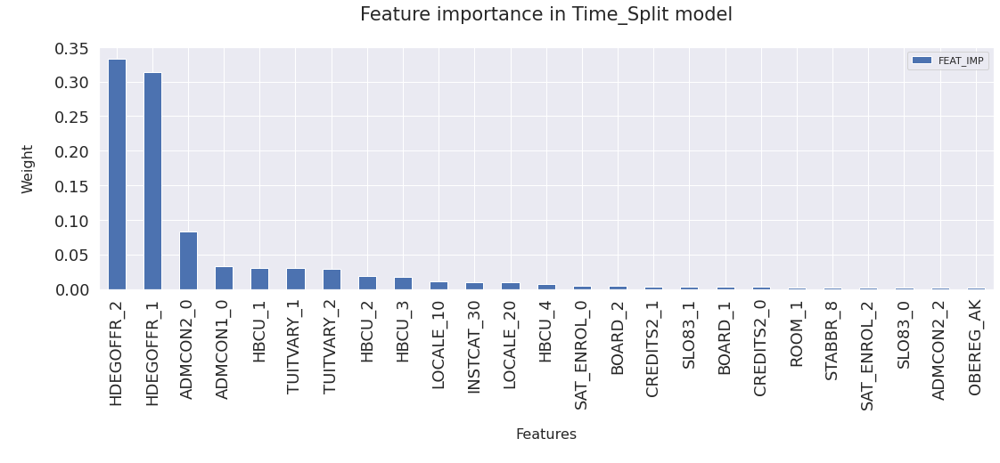

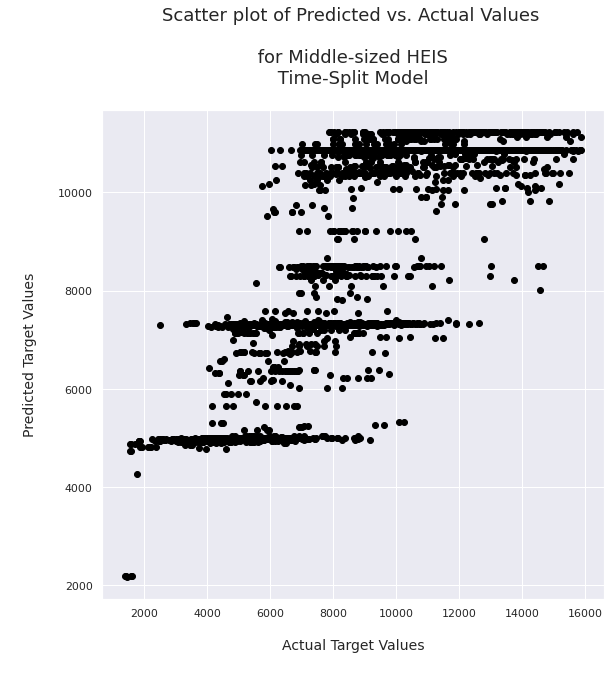


Observations n: 3834 split n: 8

Training Observations: 3408 
Training Predictions: 3408

Testing Observations: 426 
Testing Predictions: 426
[19:57:51] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 62.63%

Testing Data Model Accuracy 
(R-squared for Testing Data): 55.85%

Mean absolute error (MAE) (train data):  1477.58 
Mean squared error (MSE) (train data):  3391554.16 
Root Mean squared error (RMSE) (train data):  1841.62 

Mean absolute error (MAE) (test data):  1506.17 
Mean squared error (MSE) (test data):  3614042.34 
Root Mean squared error (RMSE) (test data):  1901.06 



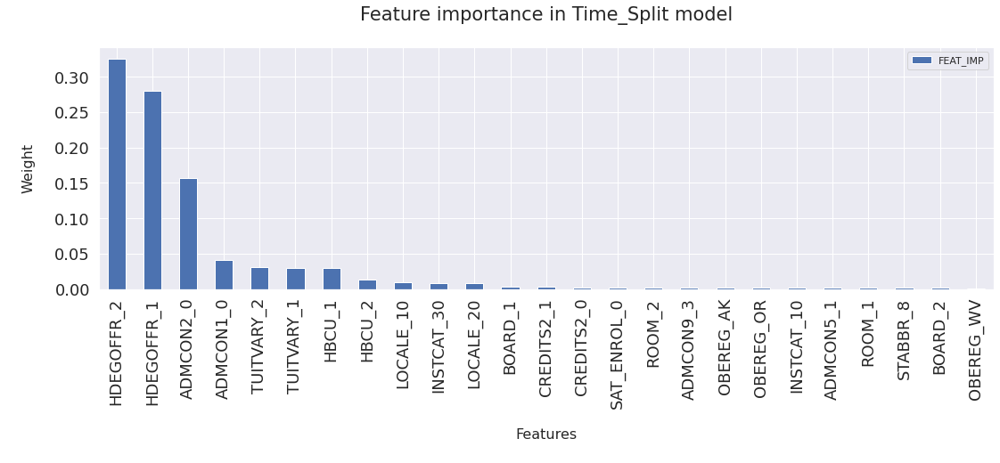

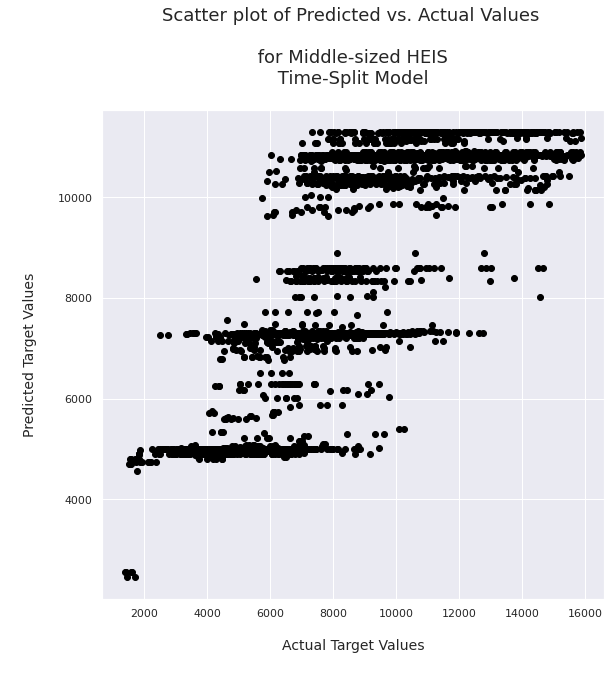


Observations n: 4260 split n: 9

Training Observations: 3834 
Training Predictions: 3834

Testing Observations: 426 
Testing Predictions: 426
[19:57:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 62.23%

Testing Data Model Accuracy 
(R-squared for Testing Data): 55.10%

Mean absolute error (MAE) (train data):  1475.13 
Mean squared error (MSE) (train data):  3391693.72 
Root Mean squared error (RMSE) (train data):  1841.66 

Mean absolute error (MAE) (test data):  1599.56 
Mean squared error (MSE) (test data):  4221188.36 
Root Mean squared error (RMSE) (test data):  2054.55 



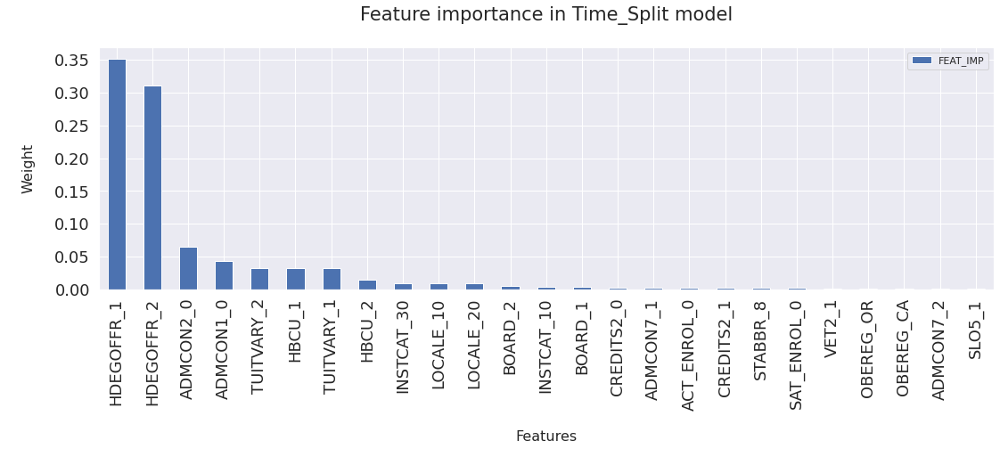

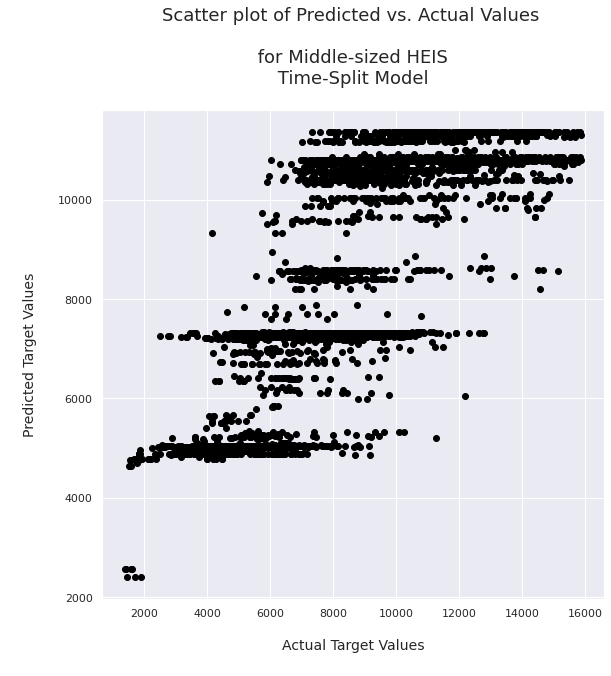

In [133]:
# https://towardsdatascience.com/an-introduction-to-logistic-regression-for-categorical-data-analysis-7cabc551546c
# https://medium.com/@curryrowan/simplified-logistic-regression-classification-with-categorical-variables-in-python-1ce50c4b137

# SAT_ENROL and ACT_ENROL CODES:
# 0 = none
# 1 = less than 10%
# 2 = between 10 and 20%
# 3 = between 20% and 30%
# 4 = between 30% and 40%
# 5 =  greater than 40%

from sklearn.model_selection import TimeSeriesSplit

X = df_MIDDLE_1.iloc[:, :-2].values
y = df_MIDDLE_1.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  
# # 'YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE','INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
#   'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2','STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
#   'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5','DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
#   'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL', 'EFYTOTLT','HIGH_ENROL'

  X_test.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)

  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  scaler = ColumnTransformer(
      transformers=[
          ("num", numeric_transformer, numeric_features),
          ("cat", categorical_transformer, categorical_features)
      ]
  )

  scaler_y = RobustScaler()

  model_xgboost = XGBRFRegressor(learning_rate= 1, max_depth= 5, n_estimators=100, subsample=0.7, colsample_bynode=0.8)

# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.
  clf = Pipeline(
      steps=[("preprocessor", scaler),("out_prep", scaler_y), ("regressor", model_xgboost)]
  )

  # clf.info()
  clf.fit(X_train, y_train)
  # 
  # Model Performance on training data AND on testing data
  scores_accuracy_train = clf.score(X_train, y_train)
  print("\nTraining Data Model Accuracy \n(R-squared for Training Data): %.2f%%\n" % (scores_accuracy_train*100))
  scores_accuracy_test = clf.score(X_test, y_test)
  print("Testing Data Model Accuracy \n(R-squared for Testing Data): %.2f%%\n" % (scores_accuracy_test*100))

  y_test_scaled_predicted = clf.predict(X_test)

  y_train_scaled_predicted = clf.predict(X_train)

  feature_importance()


  # print("\nR-Squared (test data): ", round((r2_score(y_test, y_test_scaled_predicted)*100), 2), '%\n')
  # print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")

  print("Mean absolute error (MAE) (train data): ", round((mean_absolute_error(y_train, y_train_scaled_predicted)), 2), '')
  print("Mean squared error (MSE) (train data): ", round((mean_squared_error(y_train, y_train_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (train data): ", round((np.sqrt(mean_squared_error(y_train, y_train_scaled_predicted))), 2),'\n')
  
  print("Mean absolute error (MAE) (test data): ", round((mean_absolute_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Mean squared error (MSE) (test data): ", round((mean_squared_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (test data): ", round((np.sqrt(mean_squared_error(y_test, y_test_scaled_predicted))), 2),'\n')

  # print("The larger value of the MSE on the test dataset the more problematic is the model's performance (Overfitting)\n\n")

  # print("R-Squared (train data): ", round((r2_score(y_train, y_train_scaled_predicted)*100), 2), '%\n')

  sns.set(rc = {'figure.figsize':(9,9)})

  fig, ax = plt.subplots()
  ax.scatter(y_train, y_train_scaled_predicted,  color='black')
  ax.set_title("Scatter plot of Predicted vs. Actual Values \n \n for Middle-sized HEIS \n Time-Split Model \n", fontsize=18)
  ax.set_xlabel("\nActual Target Values\n", fontsize=14)
  ax.set_ylabel("\nPredicted Target Values\n", fontsize=14)
  # plt.add_artist(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.line(xy1=(0, 0), slope=1, color='r', lw=2)
  # plt.lines.Line2D((0, 0), (1, 1), linewidth=4, color='r')
  # ax.Axes.axline(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.axline([0, 0], [1, 1], linewidth=4, color='r')
  plt.show()


  i = i+1

In [145]:
df_MIDDLE_1['HDEGOFFR'].value_counts()

40    1833
10    1441
20     714
30     272
Name: HDEGOFFR, dtype: int64

In [147]:
# Pulling out of the group of Middle HEIs the sub groups by HDEGOFFR (masters and Doctorates on one side and Bachelors and Associates pn the other)



df_MIDDLE_1_NOG=df_MIDDLE_1.loc[lambda df_MIDDLE_1:((df_MIDDLE_1['HDEGOFFR']=='10')|(df_MIDDLE_1['HDEGOFFR']=='20')),:]
df_MIDDLE_1_G=df_MIDDLE_1.loc[lambda df_MIDDLE_1:((df_MIDDLE_1['HDEGOFFR']=='30')|(df_MIDDLE_1['HDEGOFFR']=='40')),:]
df_MIDDLE_1_NOG.drop(['HDEGOFFR'], axis=1, inplace=True) 
df_MIDDLE_1_G.drop(['HDEGOFFR'], axis=1, inplace=True) 


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [141]:
from sklearn.cluster import DBSCAN

from sklearn.decomposition import PCA

from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 852 split n: 1

Training Observations: 426 
Training Predictions: 426

Testing Observations: 426 
Testing Predictions: 426
Increase in Explained Variance with every additional principal component:  [0.39951239 0.04849599 0.03733755]

This is the original data fed to the model: 
 [[ 2.84493206e-17 -1.35189678e-03  1.99078904e-02 ...  1.66986925e-01
  -8.39921680e-04  1.85150352e-03]
 [ 1.95459201e-17 -4.56534741e-03  1.72499839e-02 ...  1.68286917e-01
  -1.98636408e-04  2.32485827e-03]
 [ 1.18998451e-17 -4.58375816e-03  1.12817096e-02 ...  1.42956973e-01
   6.73180599e-04  1.87566168e-03]
 ...
 [-1.30568198e-18  2.43225367e-03  4.12580628e-03 ... -1.45928904e-01
  -4.70794853e-03 -3.10291069e-04]
 [ 2.01186496e-17  6.30805866e-04  9.03297268e-03 ...  1.43626757e-01
   1.37026412e-03  6.31853163e-04]
 [-1.78633849e-17 -2.26614138e-03 -4.99373779e-03 ... -1.21346906e-01
  -1.86404664e-03  1.73734475e-05]] 



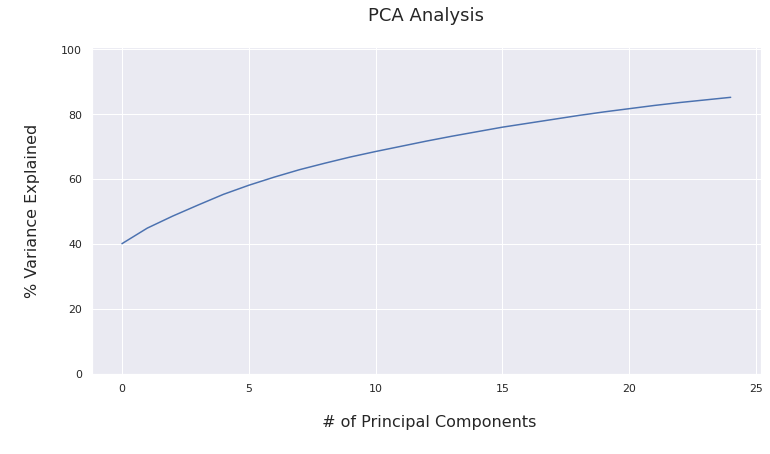

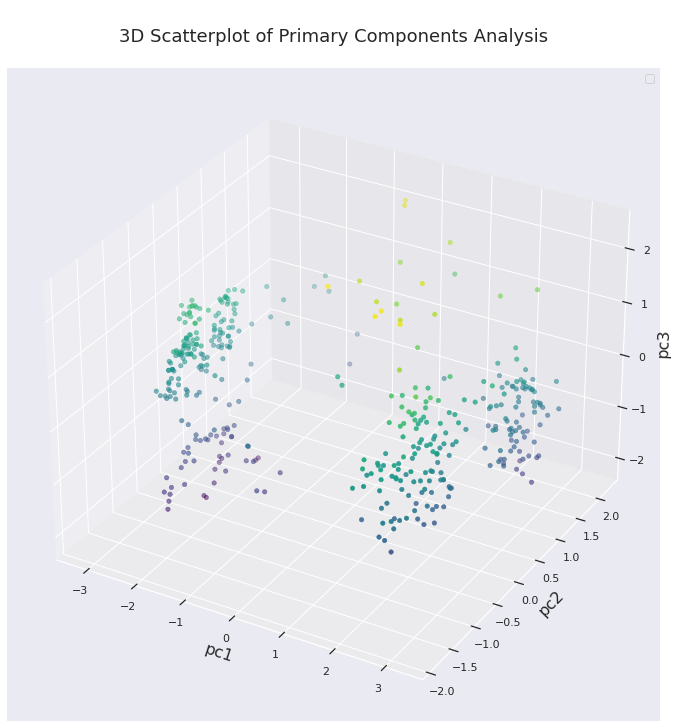

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1278 split n: 2

Training Observations: 852 
Training Predictions: 852

Testing Observations: 426 
Testing Predictions: 426
Increase in Explained Variance with every additional principal component:  [0.39825703 0.04987587 0.03497411]

This is the original data fed to the model: 
 [[ 0.01674267  0.00183498  0.01639491 ...  0.17019746  0.00690733
   0.0013301 ]
 [ 0.04463978 -0.00390814  0.0292785  ...  0.24512662  0.00678984
   0.00375985]
 [ 0.03211976 -0.00294357  0.01659453 ...  0.17308139  0.0067266
   0.00225666]
 ...
 [-0.00204601 -0.00161994  0.01173948 ... -0.0532251  -0.01027682
   0.00157323]
 [-0.00447459 -0.00201241  0.0032587  ... -0.08115183 -0.00865496
   0.00075751]
 [ 0.05161132 -0.0071058   0.03626488 ...  0.22234111  0.00128081
   0.00511653]] 



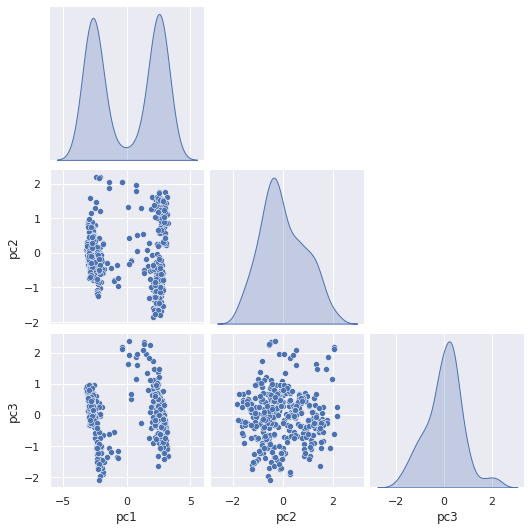

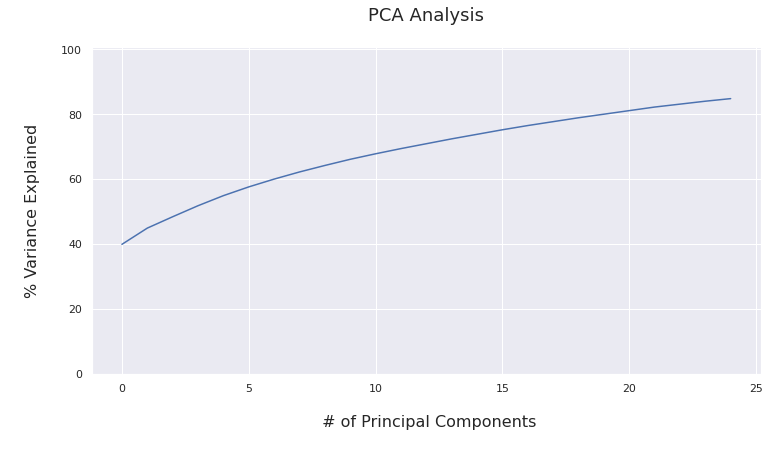

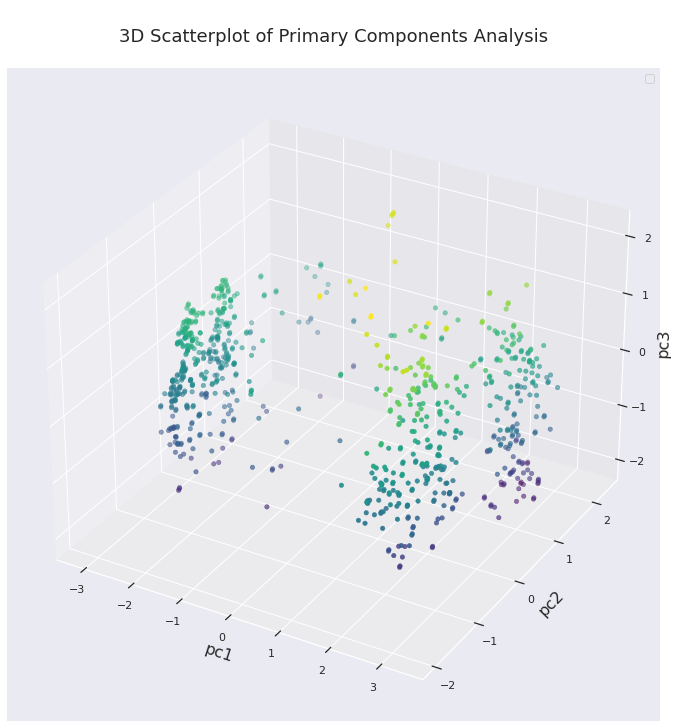

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1704 split n: 3

Training Observations: 1278 
Training Predictions: 1278

Testing Observations: 426 
Testing Predictions: 426
Increase in Explained Variance with every additional principal component:  [0.36992307 0.06306053 0.04624431]

This is the original data fed to the model: 
 [[-2.37634130e-01  1.24387300e-03  2.00199675e-02 ...  2.02661813e-01
   9.84008151e-03  2.02519998e-03]
 [-2.28215847e-01 -1.09248139e-04  1.01981224e-02 ...  1.52209410e-01
   7.79943662e-03  1.41425080e-03]
 [-2.65964009e-01 -9.22480728e-04  4.17411570e-03 ...  1.17066204e-01
   5.54165105e-03  1.18649155e-03]
 ...
 [ 2.59183064e-02 -2.74051175e-03 -7.51860911e-03 ...  9.16226004e-02
   1.02699777e-02 -4.85817261e-04]
 [ 3.23872904e-01  8.46660167e-04  1.29043074e-02 ...  1.59432576e-01
   1.58422447e-02 -3.11302959e-04]
 [ 9.33879942e-01 -1.47966549e-05  2.98913022e-03 ...  1.10859677e-01
   2.27316522e-02 -2.97501333e-03]] 



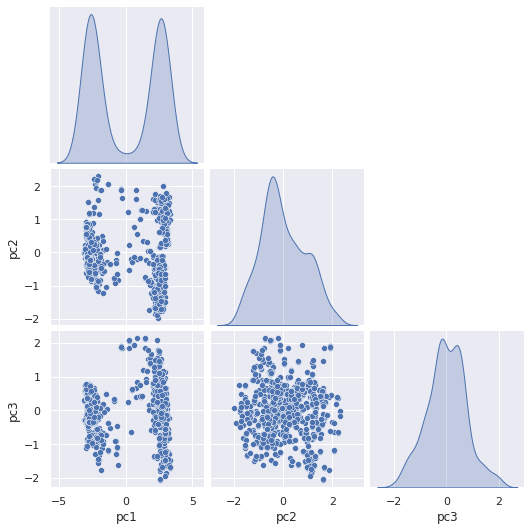

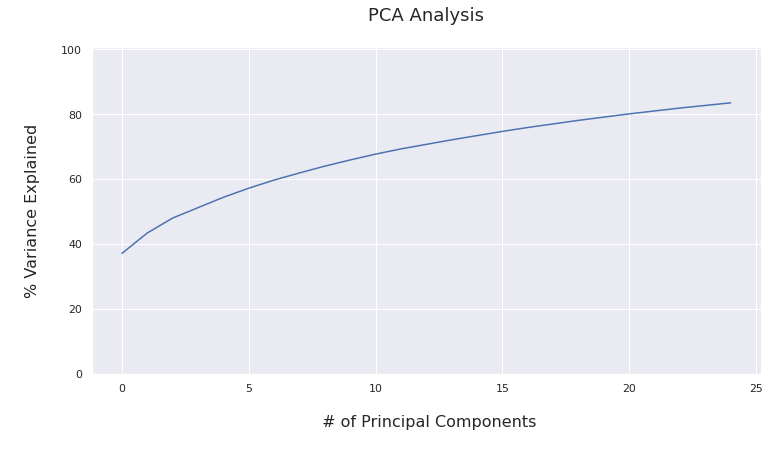

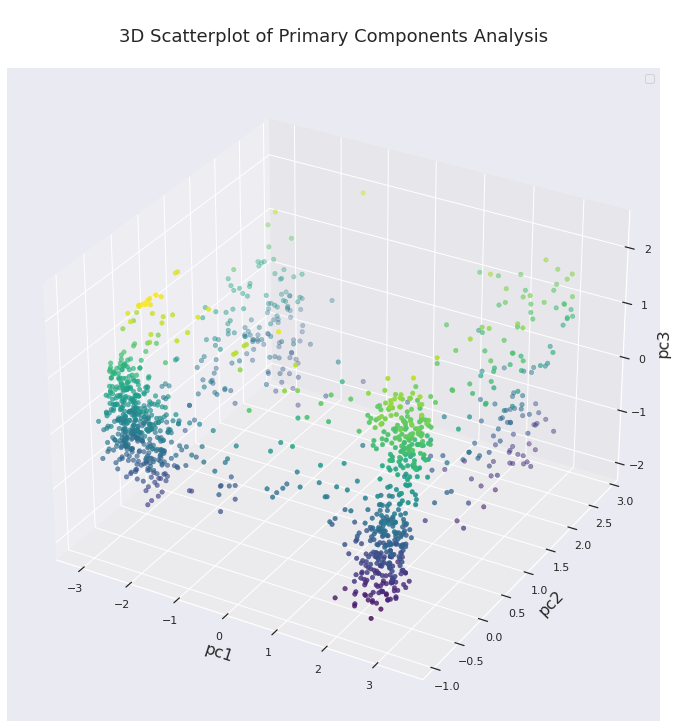

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 2130 split n: 4

Training Observations: 1704 
Training Predictions: 1704

Testing Observations: 426 
Testing Predictions: 426
Increase in Explained Variance with every additional principal component:  [0.35613141 0.08558809 0.04473207]

This is the original data fed to the model: 
 [[-4.19410680e-01  2.21379480e-03  1.92308955e-02 ...  2.04025054e-01
   1.12212618e-02  2.65210031e-03]
 [-3.80279388e-01  6.09370635e-04  1.02045106e-02 ...  1.52990301e-01
   8.50409327e-03  1.59109685e-03]
 [-4.17688845e-01 -3.26442298e-04  4.83137487e-03 ...  1.17941305e-01
   5.85446991e-03  9.97732690e-04]
 ...
 [ 3.77426444e-01  3.66675253e-03  2.26910849e-02 ...  1.84820837e-01
   1.67542354e-02  2.39726232e-03]
 [ 6.70312068e-01  1.71424739e-03  4.26509358e-04 ... -1.16978095e-01
  -4.18448298e-03 -6.27335614e-04]
 [ 8.52039528e-01 -2.84543946e-04  2.64433109e-03 ...  1.25793412e-01
   1.95655280e-02 -1.66832294e-04]] 



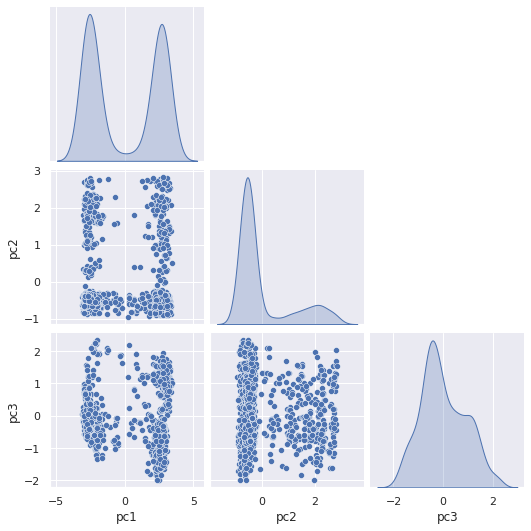

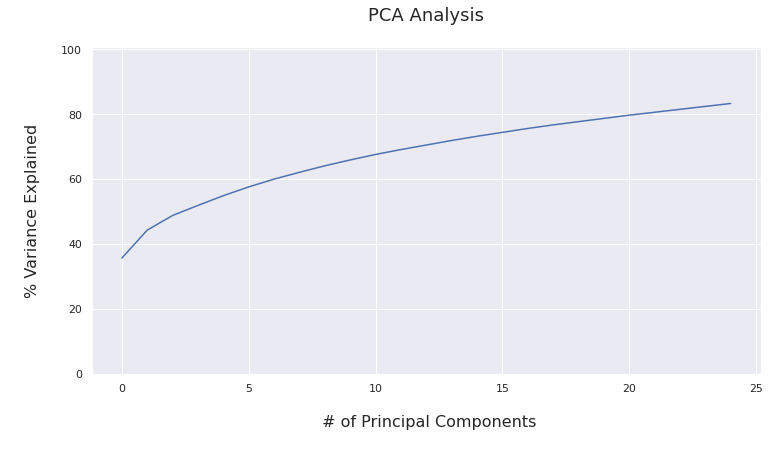

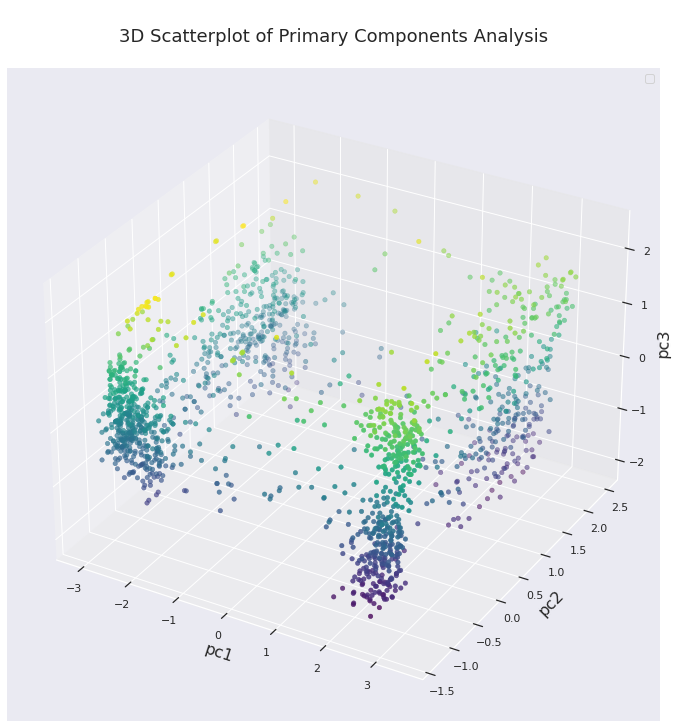

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 2556 split n: 5

Training Observations: 2130 
Training Predictions: 2130

Testing Observations: 426 
Testing Predictions: 426
Increase in Explained Variance with every additional principal component:  [0.34973672 0.09465069 0.04432318]

This is the original data fed to the model: 
 [[-6.49408443e-01  2.32635082e-03  1.53937895e-02 ...  1.88931294e-01
   9.21163164e-03  2.36949289e-03]
 [-5.90219814e-01  6.89098547e-04  7.51015425e-03 ...  1.44627625e-01
   7.52151151e-03  1.53393617e-03]
 [-6.32148402e-01 -2.20676610e-04  2.93076383e-03 ...  1.13409417e-01
   5.30835753e-03  1.13764213e-03]
 ...
 [ 8.20231094e-01 -1.12389831e-03 -9.55886349e-03 ... -1.53678663e-01
  -5.83451421e-03 -2.01213991e-03]
 [ 7.59049824e-01  2.50182202e-03  1.38090964e-02 ...  1.27395917e-01
   1.56234260e-02  4.46757171e-04]
 [ 9.27259776e-01  9.93088287e-04  6.96237376e-04 ... -9.33582306e-02
  -1.75327517e-03 -1.14860582e-03]] 



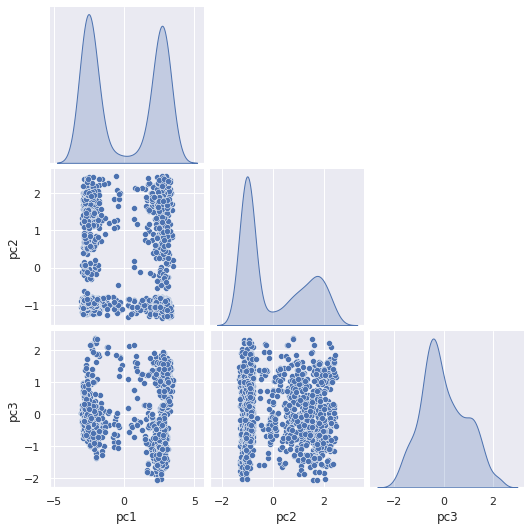

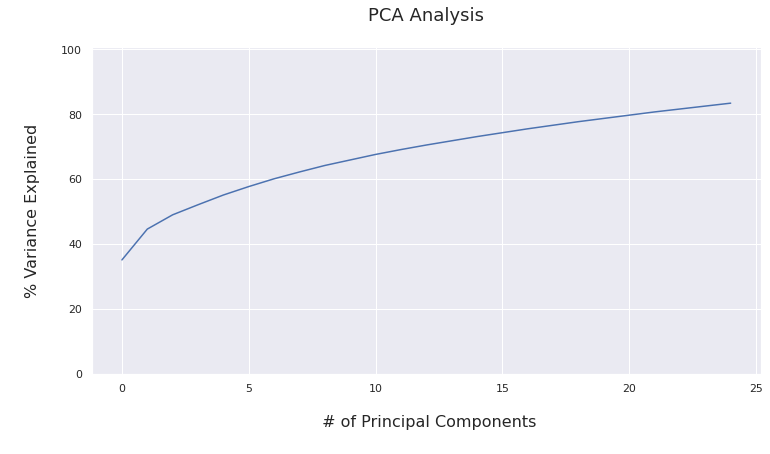

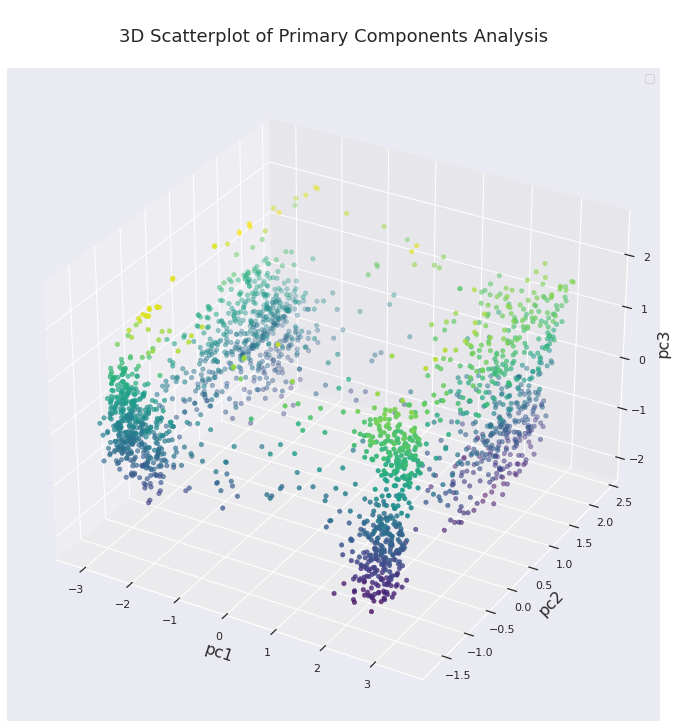


Observations n: 2982 split n: 6

Training Observations: 2556 
Training Predictions: 2556

Testing Observations: 426 
Testing Predictions: 426


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.34852613 0.08819921 0.04480311]

This is the original data fed to the model: 
 [[-5.38044288e-01  2.20492088e-03  1.37086605e-02 ...  1.78986690e-01
   9.29031220e-03  2.22949248e-03]
 [-4.88730447e-01  6.77708762e-04  6.85210685e-03 ...  1.40815749e-01
   7.44621863e-03  1.53004926e-03]
 [-5.28882111e-01 -2.50789951e-04  2.68428653e-03 ...  1.11686560e-01
   4.78724277e-03  1.23422415e-03]
 ...
 [ 3.23256410e-01  1.79264857e-03  4.07194921e-03 ... -9.35101316e-02
  -7.08622028e-03 -2.56301050e-04]
 [ 6.35756554e-01  4.99106919e-03  2.18143462e-02 ...  1.66936183e-01
   2.09081012e-02  7.60233518e-04]
 [ 3.66860400e-01  1.52820999e-03  2.82338436e-03 ... -9.97752672e-02
  -6.90689853e-03 -4.47855950e-04]] 



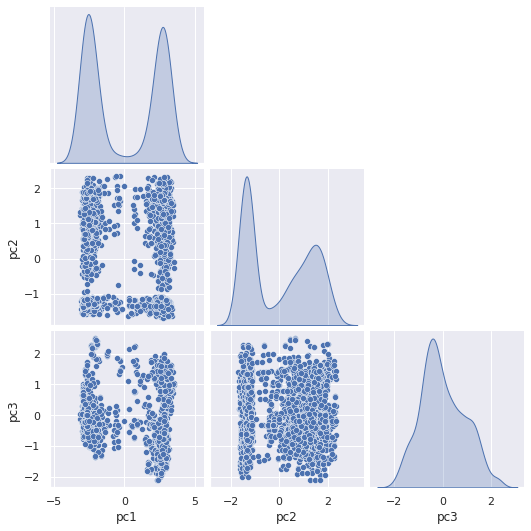

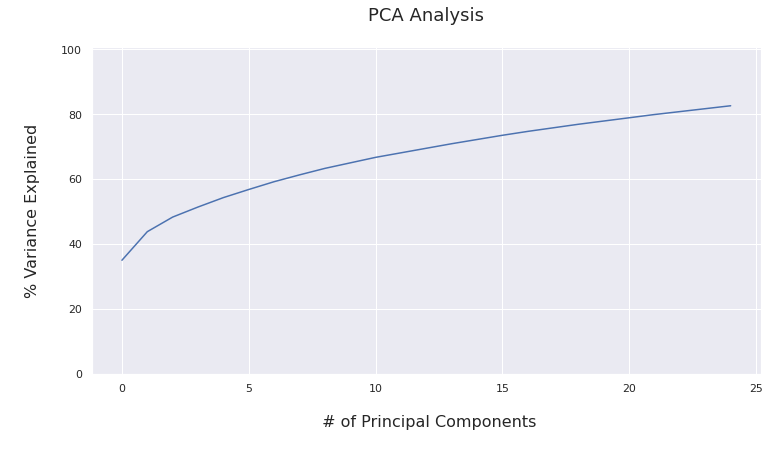

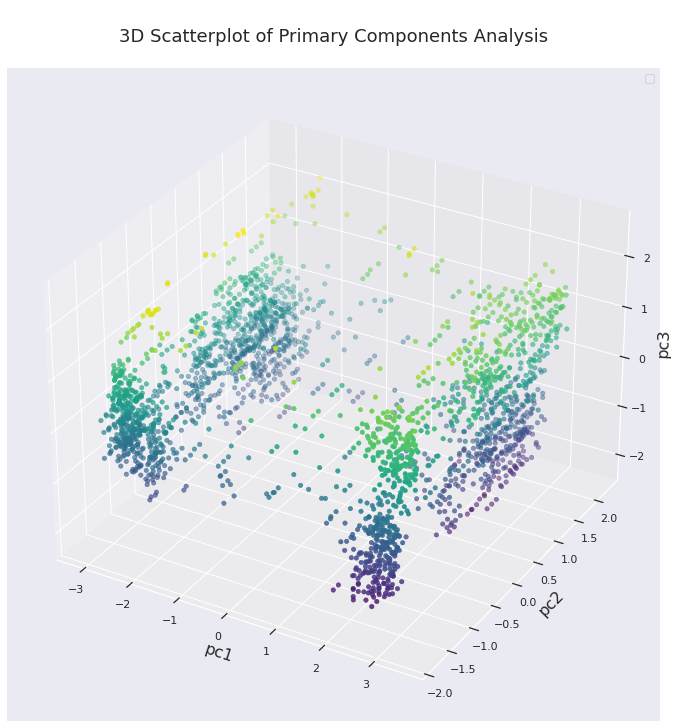


Observations n: 3408 split n: 7

Training Observations: 2982 
Training Predictions: 2982

Testing Observations: 426 
Testing Predictions: 426


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.34122553 0.09189326 0.04398089]

This is the original data fed to the model: 
 [[-7.07231065e-01  2.19581306e-03  1.27518054e-02 ...  1.82990421e-01
   1.00443508e-02  2.16826822e-03]
 [-6.53409554e-01  7.25568321e-04  5.79308559e-03 ...  1.43691501e-01
   7.78028577e-03  1.58900792e-03]
 [-6.94591646e-01 -2.70482134e-04  1.04633913e-03 ...  1.13532904e-01
   5.02378986e-03  1.33189123e-03]
 ...
 [ 7.50157424e-02 -2.23258668e-04  1.65063335e-03 ...  1.53342383e-01
   1.76139922e-02  1.09739143e-05]
 [ 6.88571445e-01 -7.21748090e-04 -1.81735700e-03 ...  8.79725918e-02
   1.76583967e-02 -1.33201406e-03]
 [ 5.57608441e-01  4.20641836e-04 -7.72302592e-04 ... -1.37771855e-01
  -9.27191520e-03 -1.07427730e-03]] 



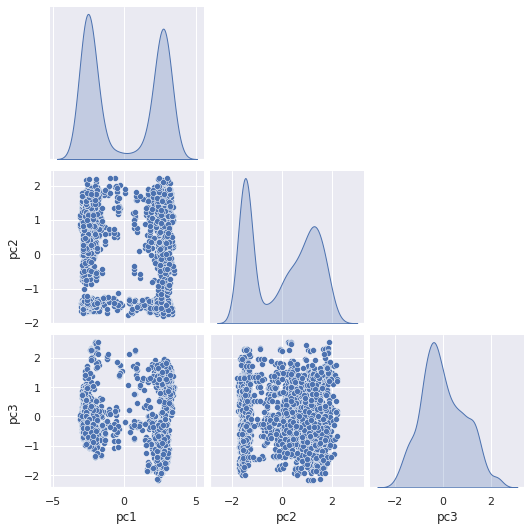

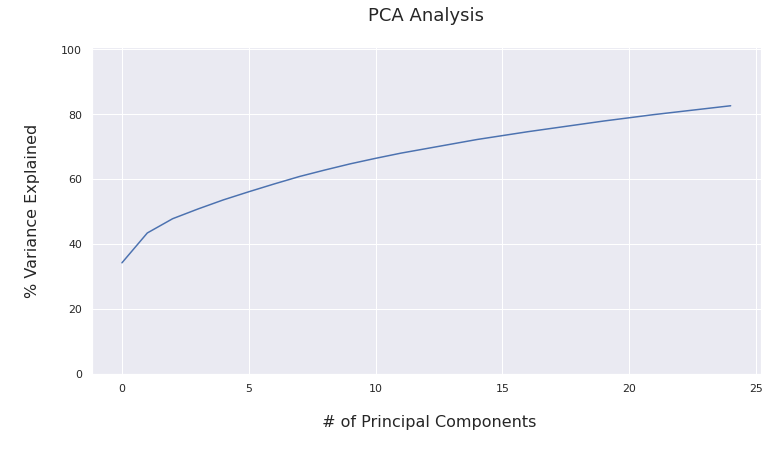

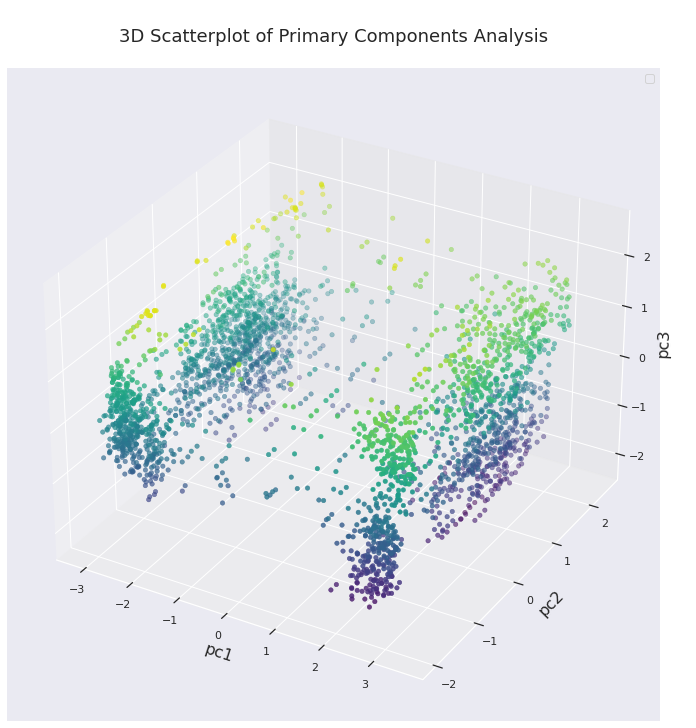


Observations n: 3834 split n: 8

Training Observations: 3408 
Training Predictions: 3408

Testing Observations: 426 
Testing Predictions: 426


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.33983465 0.09108791 0.043773  ]

This is the original data fed to the model: 
 [[-6.27873668e-01  2.25798997e-03  1.32643455e-02 ...  1.83794406e-01
   1.08587219e-02  2.07411081e-03]
 [-5.74120805e-01  8.16826651e-04  6.14911223e-03 ...  1.44717784e-01
   8.53995924e-03  1.55750454e-03]
 [-6.11397975e-01 -2.48698534e-04  9.30500310e-04 ...  1.14542017e-01
   5.70896955e-03  1.33757748e-03]
 ...
 [ 2.56216644e-01  1.30811141e-04  2.39090263e-03 ...  1.44458510e-01
   1.96680760e-02 -3.76842167e-04]
 [ 3.14309569e-01  4.60156439e-05  1.91891444e-03 ...  1.41385631e-01
   2.01340839e-02 -5.24348731e-04]
 [ 1.89020394e-01  1.68142411e-03  9.92730324e-03 ...  1.77353419e-01
   2.09950887e-02  1.90423564e-04]] 



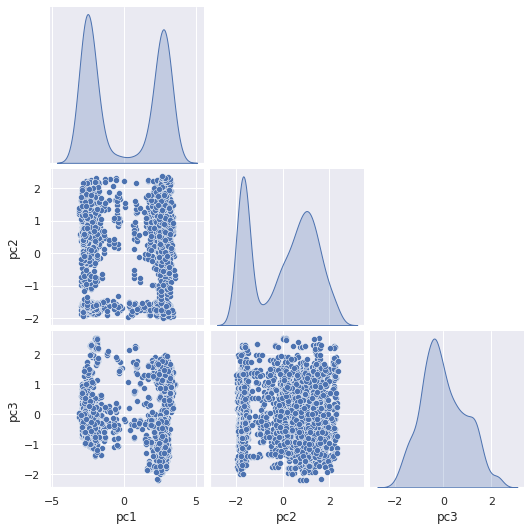

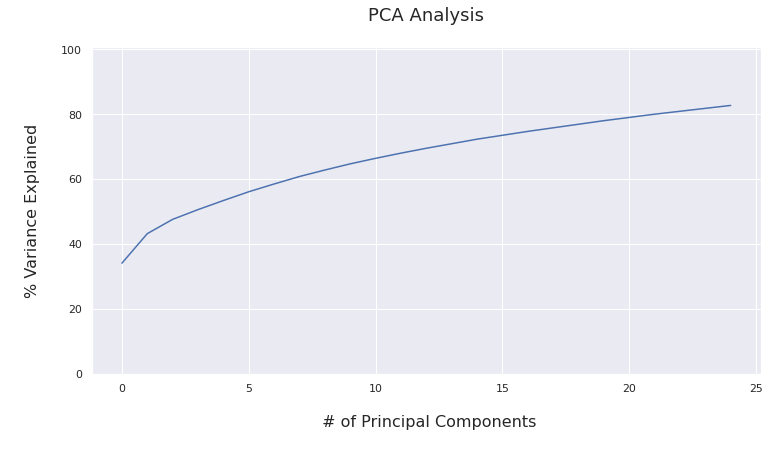

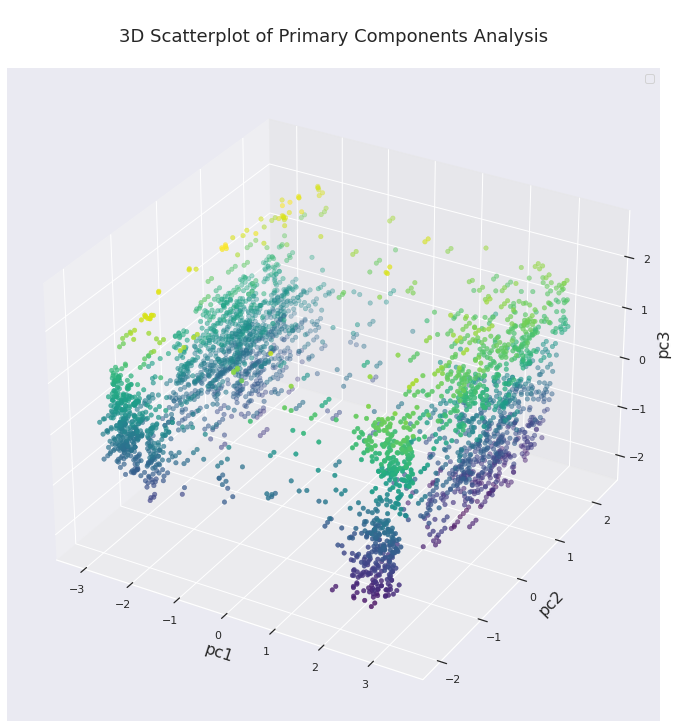


Observations n: 4260 split n: 9

Training Observations: 3834 
Training Predictions: 3834

Testing Observations: 426 
Testing Predictions: 426


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.33291629 0.10382001 0.04313959]

This is the original data fed to the model: 
 [[-1.05809719e+00  2.46008055e-03  1.24738626e-02 ...  1.85636607e-01
   1.09737942e-02  2.06342081e-03]
 [-9.82558930e-01  9.99999646e-04  5.46941327e-03 ...  1.45982813e-01
   8.58820059e-03  1.61384820e-03]
 [-1.02301444e+00 -1.07637718e-04  6.16605655e-05 ...  1.15075870e-01
   6.05013466e-03  1.40056179e-03]
 ...
 [ 1.07773974e+00  1.40894687e-03  6.77640780e-03 ... -4.00971000e-02
   1.21816285e-03 -1.13213633e-03]
 [ 1.15365583e+00 -1.18812889e-03 -5.09608961e-03 ... -5.91958365e-02
   2.23272301e-03 -1.81876354e-03]
 [ 8.47658025e-01 -9.30865550e-04 -5.41257925e-03 ... -1.57206755e-01
  -1.07685519e-02 -1.42939467e-03]] 



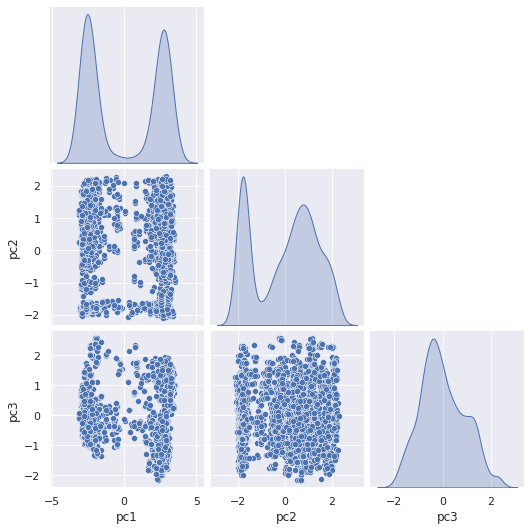

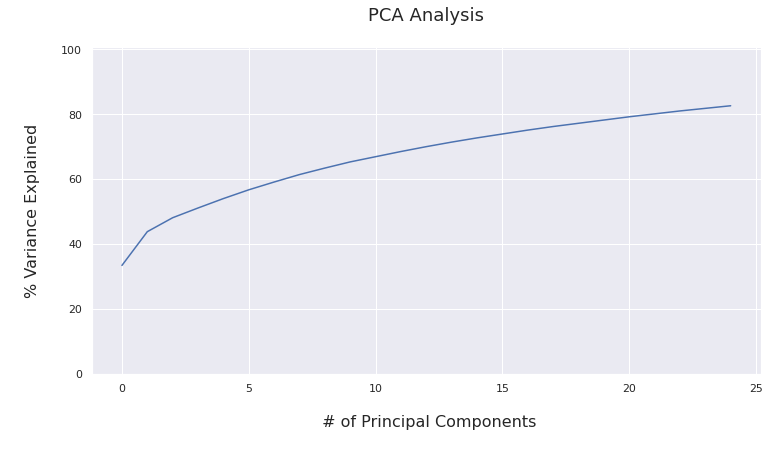

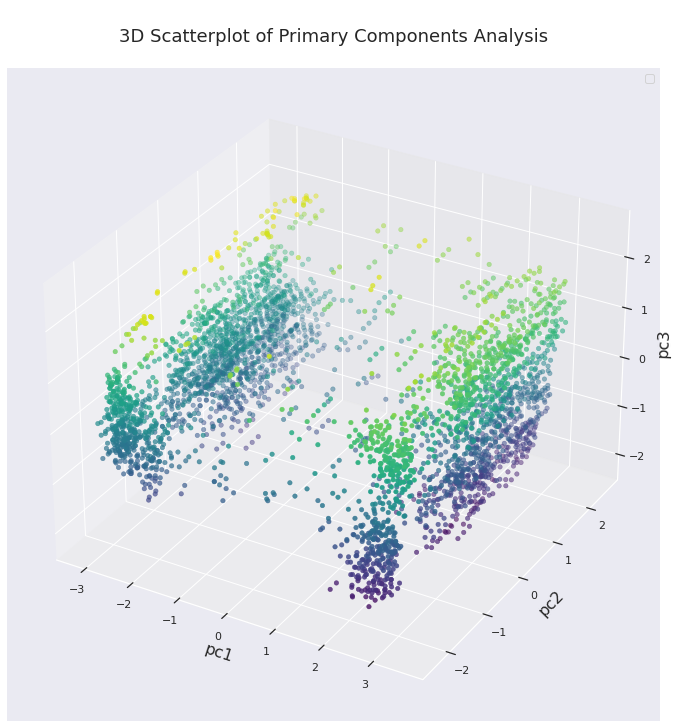

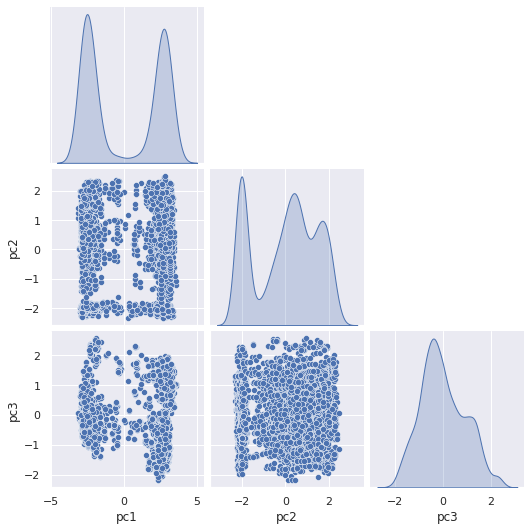

In [144]:
# df_MIDDLE_1_NOG
# df_MIDDLE_1_G
X = df_MIDDLE_1.iloc[:, :-2].values
y = df_MIDDLE_1.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)

  X_test.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)
  
  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)
  
  scaler = ColumnTransformer(
      transformers=[("num", numeric_transformer, numeric_features),
                    ("cat", categorical_transformer, categorical_features)
                    ])
  scaler_y = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)

  X_train_scaled1=pd.DataFrame(X_train_scaled)
  X_test_scaled1=pd.DataFrame(X_test_scaled)

  y_train_scaled = scaler_y.fit_transform(y_train)
  y_test_scaled = scaler_y.transform(y_test)

  y_train_scaled1=pd.DataFrame(y_train_scaled)
  y_test_scaled1=pd.DataFrame(y_test_scaled)

  pca = PCA(n_components=25)
# X_train_pca = pca.fit(X_train_scaled1)
  pca.fit(X_train_scaled1)
# X_test_pca = pca.fit(X_test_scaled1)
  variance = pca.explained_variance_ratio_ 
  var=np.cumsum(np.round(variance, 3)*100)
  plt.figure(figsize=(12,6))
  plt.ylabel('\n% Variance Explained\n', fontsize = 16)
  plt.xlabel('\n # of Principal Components\n', fontsize = 16)
  plt.title('PCA Analysis\n', fontsize=18)
  plt.ylim(0,100.5)
  plt.plot(var)
  # plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Analysis.png")

# Looking at a total of three pricipal components 
  pca2 = PCA(n_components=3)
# X_train_pca = pca2.fit(X_train_scaled1)
# X_test_pca = pca2.fit(X_test_scaled1)
  pca2.fit(X_train_scaled1)
  pca_scale_result = pca2.transform(X_train_scaled1)
  pca_df = pd.DataFrame(pca_scale_result, columns=['pc1', 'pc2', 'pc3'])
  print("Increase in Explained Variance with every additional principal component: ", pca2.explained_variance_ratio_)
  pca_df


# data_reduced = np.dot(data, pca.components_.T) # transform
  data_original = np.dot(pca_scale_result, pca2.components_) # inverse_transform
  print("\nThis is the original data fed to the model: \n", data_original,"\n")

  fig = plt.figure(figsize=(12,12))
  ax = fig.add_subplot(projection='3d')
# ax = plt.axes(projection='3d')
# Data for three-dimensional scattered points
  zdata = pca_df['pc3']
  xdata = pca_df['pc1']
  ydata = pca_df['pc2']

### SCALING ONE LINER 
# ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([2,2, 2, 2]))


# # # Change the viewing angle to an agreeable one
# ax.view_init(2,None)

  ax.scatter(xdata, ydata, zdata, c=zdata, cmap='viridis', linewidth=0.5);

# ax.contour3D(xdata, ydata, zdata, 50, cmap='binary')
  ax.set_title('\n3D Scatterplot of Primary Components Analysis\n', fontsize=18)
  ax.set_xlabel('\npc1\n', fontsize=16)
  ax.set_ylabel('\npc2\n', fontsize=16)
  ax.set_zlabel('\npc3\n', fontsize=16);

# ax.plot(z, y, x, label='parametric curve')
  ax.legend()

  plt.show()
# plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Analysis_Scatterplot3D.png")

#Seaborn pair plot
# sns.pairplot(pca_df, hue='pc1')

# sns.pairplot(pca_df, corner=True)

  g = sns.pairplot(pca_df, diag_kind="kde", corner=True)

  i = i + 1 






Observations n: 435 split n: 1

Training Observations: 220 
Training Predictions: 220

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.10415939 0.09374292 0.06541498]

This is the original data fed to the model: 
 [[ 7.94069219e-18 -1.61191452e-03  2.66762220e-02 ...  4.43164851e-02
   6.98505005e-02 -3.42644659e-03]
 [ 5.75142821e-18  1.09099431e-03  5.13768040e-02 ... -2.73469436e-01
   2.85876510e-01 -4.60243532e-03]
 [ 2.64442356e-18  5.77880303e-03  2.99609314e-02 ... -2.26416005e-01
   1.32486295e-01 -3.11874551e-03]
 ...
 [ 2.41949817e-18  2.08614884e-03 -2.19344040e-02 ...  2.60946129e-01
  -2.43582167e-01  3.77862480e-04]
 [-1.56678254e-17  5.58880111e-02 -3.54700280e-03 ... -9.65789928e-01
  -2.41206080e-01 -2.43334153e-03]
 [ 3.95548058e-19 -5.83876783e-03 -1.54509104e-02 ...  2.00296791e-01
  -7.65968667e-02  1.49196778e-03]] 



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


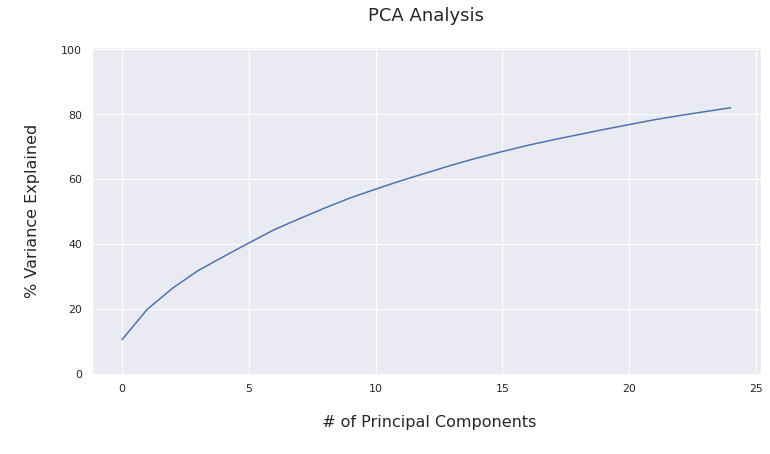

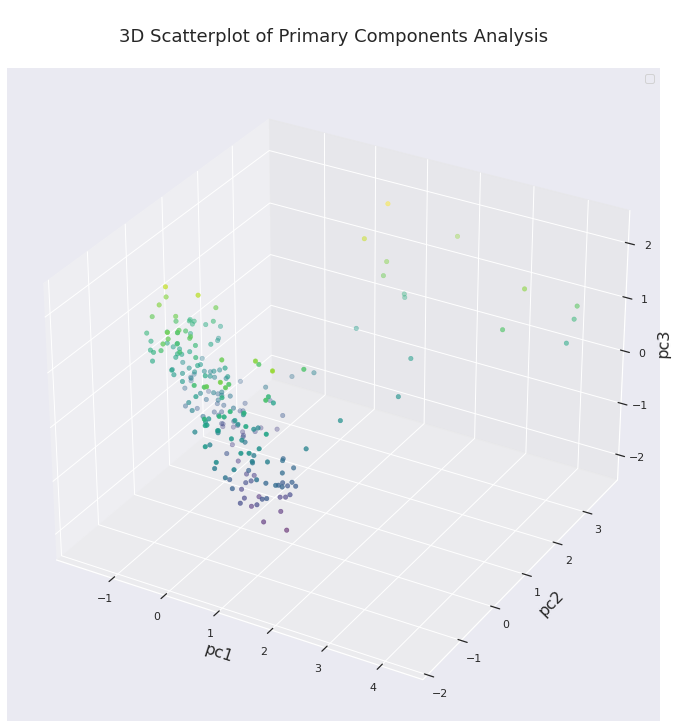

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 650 split n: 2

Training Observations: 435 
Training Predictions: 435

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.11354827 0.09643035 0.06334814]

This is the original data fed to the model: 
 [[ 3.60366157e-03  5.89853942e-04  2.85973156e-02 ...  2.55740516e-02
   9.75423591e-02  9.91990754e-05]
 [-1.58724302e-02  1.19542426e-03  5.19472433e-02 ... -2.92183135e-01
   3.00472137e-01  4.37446336e-03]
 [-2.57635300e-02  4.64017972e-03  2.83496133e-02 ... -2.21471682e-01
   1.44241426e-01  1.03096330e-03]
 ...
 [-1.72719622e-01  4.46942360e-02  1.02952194e-03 ... -4.05707438e-01
  -3.23613202e-01 -1.88157213e-02]
 [-1.49882246e-04 -8.35388717e-04  3.91361446e-02 ... -1.26000944e-01
   2.10262115e-01  3.04152075e-03]
 [ 4.78056656e-02 -1.61612862e-02  1.49417364e-02 ... -1.10581406e-01
   2.72334671e-01  1.04354626e-02]] 



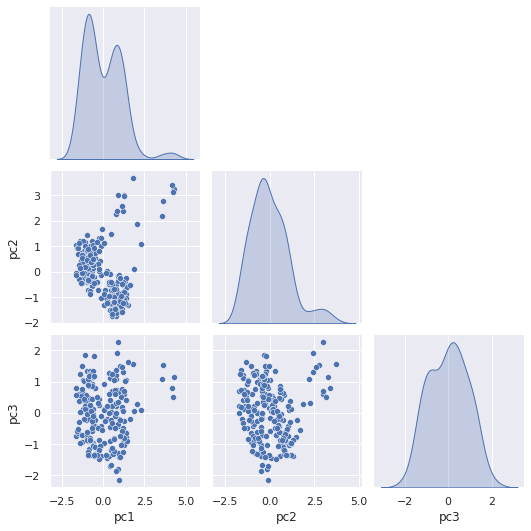

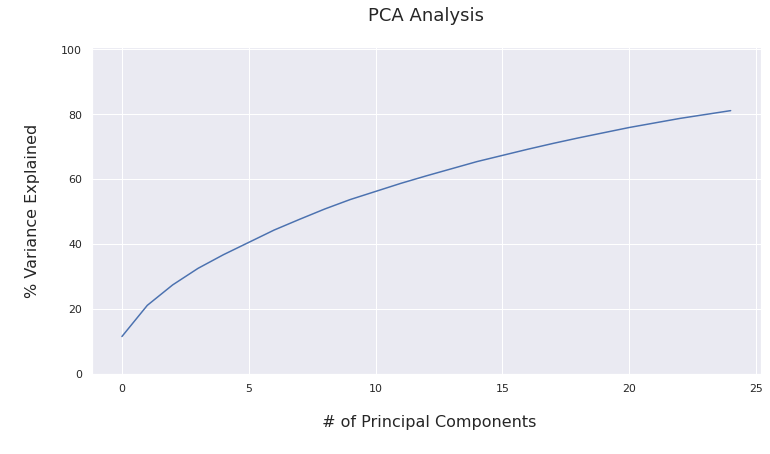

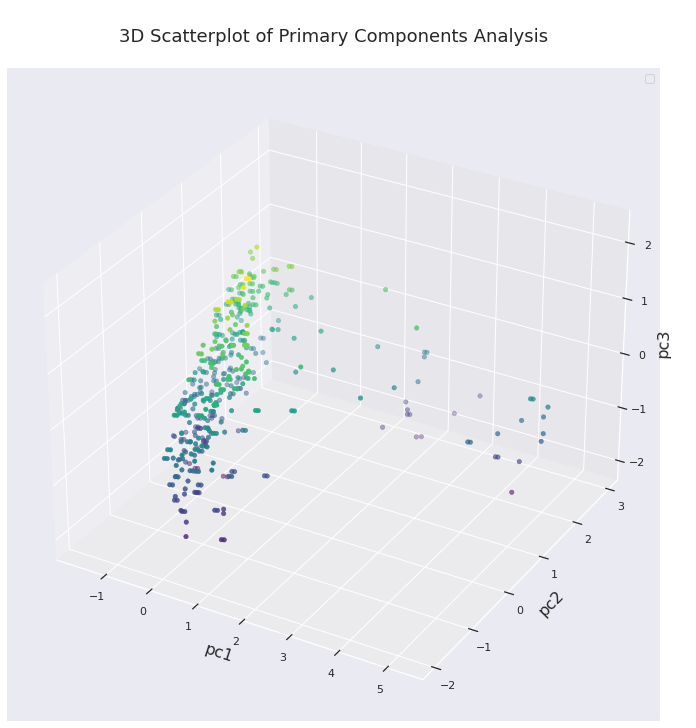

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 865 split n: 3

Training Observations: 650 
Training Predictions: 650

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.10520105 0.09005541 0.08348741]

This is the original data fed to the model: 
 [[-1.93468846e-01 -1.69670854e-03  2.92986313e-02 ...  4.66762226e-02
   1.21317026e-01  1.51426407e-03]
 [-1.52479539e-01  6.64952792e-03  3.15322537e-02 ... -1.28222239e-01
   1.03938831e-01 -1.23685831e-03]
 [-2.05458982e-01  6.37731687e-03  1.55351202e-02 ... -1.23482957e-01
   4.36781074e-02 -5.09340761e-03]
 ...
 [ 5.31938521e-01 -2.52516468e-03  3.02136504e-02 ...  4.00915918e-02
   1.16727655e-01  1.86096825e-02]
 [ 7.60440912e-01 -1.12429914e-03  1.28446019e-02 ...  4.23919894e-04
   4.19337053e-02  2.01128673e-02]
 [ 4.94943589e-01 -1.79705976e-03  4.33314847e-02 ...  2.83460180e-02
   1.65785776e-01  1.96924807e-02]] 



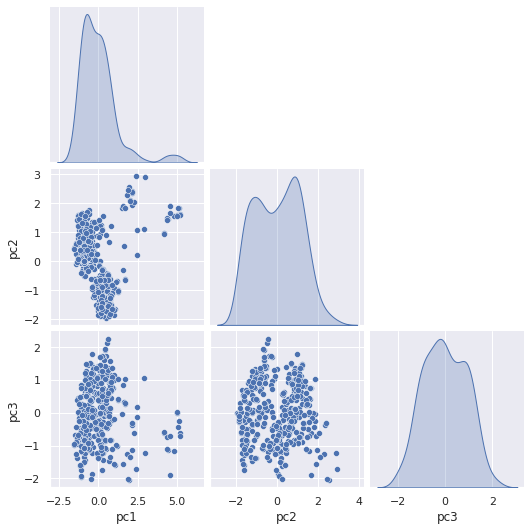

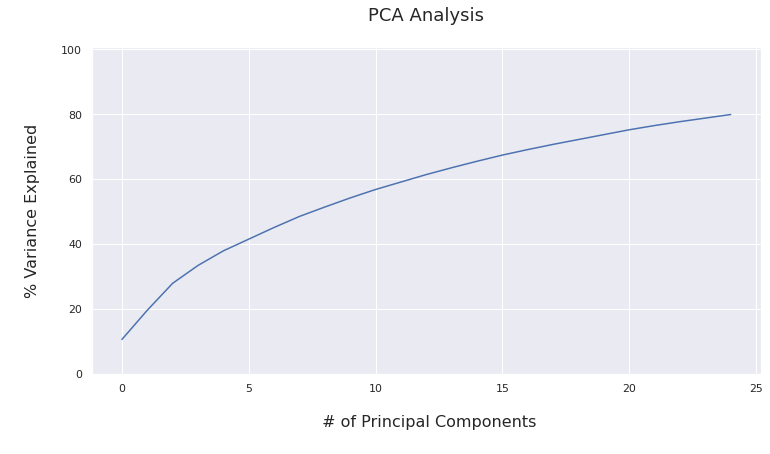

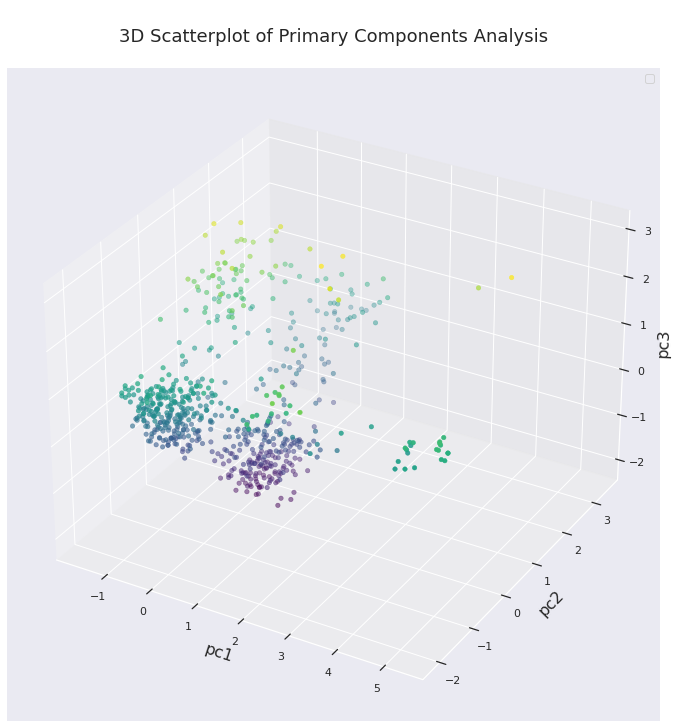

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1080 split n: 4

Training Observations: 865 
Training Predictions: 865

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.1141321  0.0965767  0.08051584]

This is the original data fed to the model: 
 [[-4.16413674e-01 -6.60673780e-04  2.56492844e-02 ...  1.28084980e-01
   1.49361451e-03 -3.66795707e-04]
 [-3.88717335e-01  6.10973464e-03  2.67613736e-02 ...  1.06935060e-01
  -3.11455925e-03 -3.05047635e-04]
 [-4.28146758e-01  5.49938973e-03  1.24498991e-02 ...  4.79823260e-02
  -7.20003347e-03 -1.14234733e-03]
 ...
 [-2.38855481e-01 -4.72879864e-03  1.00549501e-02 ...  6.92553815e-02
   2.98360730e-03 -3.71840638e-04]
 [ 5.69400016e-01 -3.77027366e-03  2.54567642e-02 ...  1.06544470e-01
   1.84775761e-02  3.50154408e-03]
 [ 5.28914600e-01 -2.98098520e-03  2.47055481e-02 ...  1.01660831e-01
   1.70482624e-02  3.29617037e-03]] 



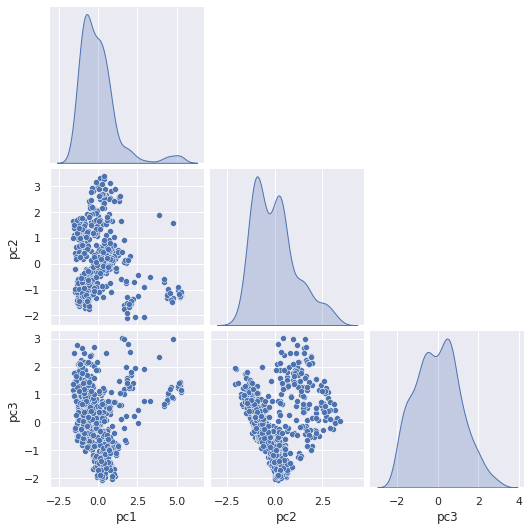

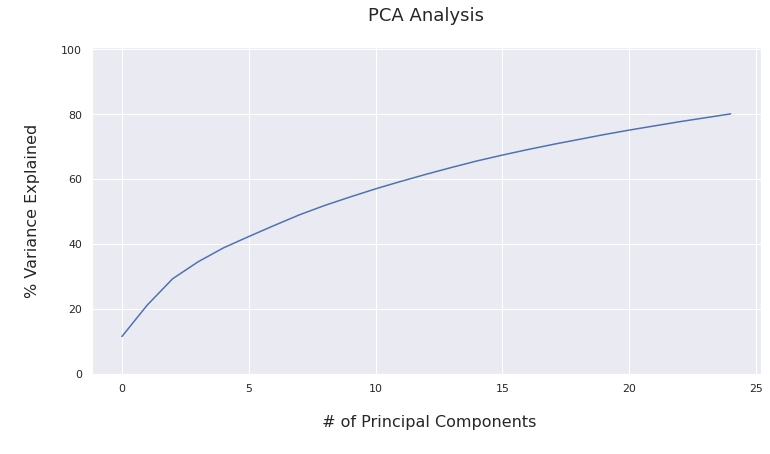

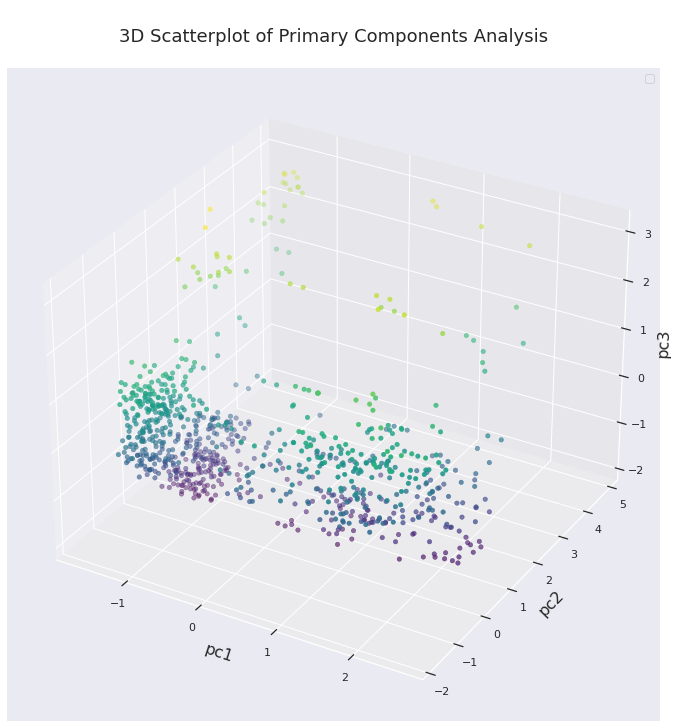

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1295 split n: 5

Training Observations: 1080 
Training Predictions: 1080

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.12433403 0.09814866 0.07844706]

This is the original data fed to the model: 
 [[-6.63249263e-01  6.02973022e-04  2.29171935e-02 ...  9.84523589e-02
  -8.05327084e-03 -3.30658011e-04]
 [-6.06824281e-01  5.27673648e-03  2.05007376e-02 ...  6.04074018e-02
  -1.34944273e-02 -3.99328557e-04]
 [-6.54911350e-01  4.57487340e-03  7.71447464e-03 ...  8.11622065e-03
  -1.75727406e-02 -9.98401154e-04]
 ...
 [ 6.18749367e-01  5.16176818e-03  3.92458144e-02 ...  1.42361309e-01
   1.88894807e-02  2.67893231e-03]
 [ 8.77719616e-01  1.47903567e-02 -2.06264618e-02 ... -1.78539860e-01
  -6.10018733e-03  5.75247145e-04]
 [ 9.67815379e-01 -4.33288272e-03 -6.47694246e-03 ... -4.44328115e-03
   2.44071038e-02  1.63559235e-03]] 



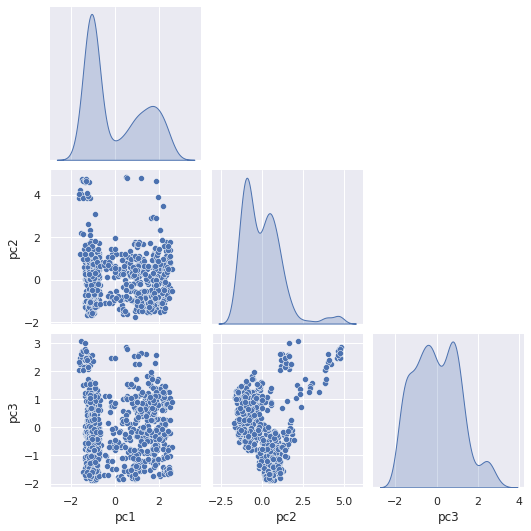

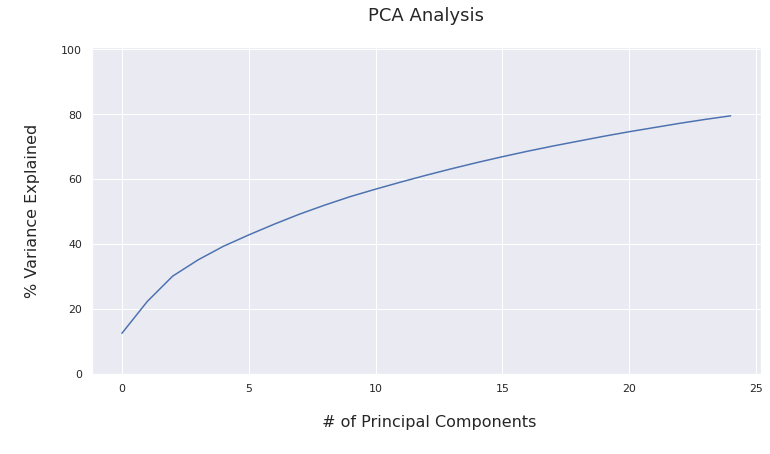

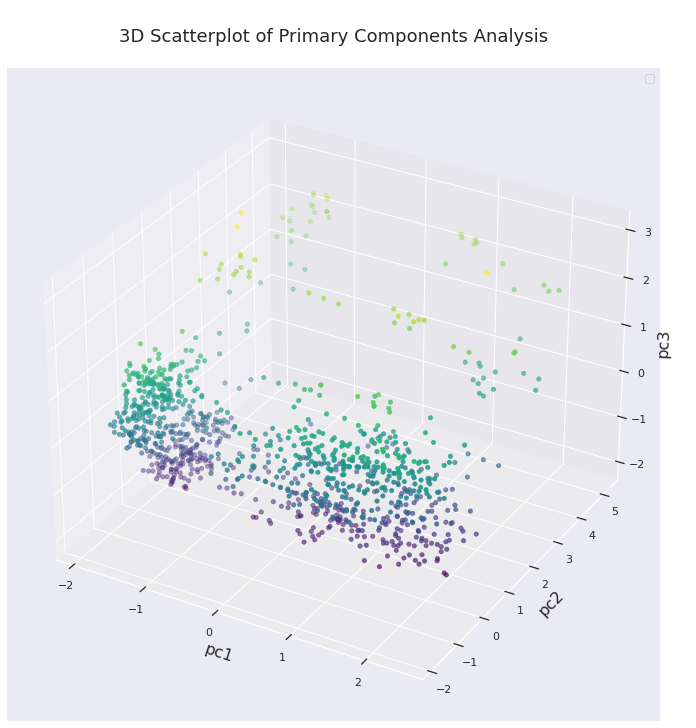

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1510 split n: 6

Training Observations: 1295 
Training Predictions: 1295

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.11683661 0.10040894 0.07870444]

This is the original data fed to the model: 
 [[-5.50137072e-01  1.06195545e-03  2.04637202e-02 ...  8.38217514e-02
  -6.18711139e-03 -2.47684084e-04]
 [-5.02117067e-01  4.42949856e-03  1.70032428e-02 ...  3.97783644e-02
  -1.13942720e-02 -3.43560493e-04]
 [-5.40016540e-01  3.49015965e-03  5.11441801e-03 ... -6.49701650e-03
  -1.51960474e-02 -8.35480643e-04]
 ...
 [ 1.25826486e-01 -9.31408152e-03 -3.69436556e-02 ... -8.98152248e-02
   3.03868085e-03 -9.88975412e-04]
 [ 5.04597724e-01 -1.61200849e-04 -2.33643585e-02 ... -1.04644475e-01
   2.78395607e-03  4.44179337e-05]
 [-1.10923762e-02 -8.30908638e-03 -3.06476466e-02 ... -6.97043929e-02
   8.41244463e-04 -1.01810622e-03]] 



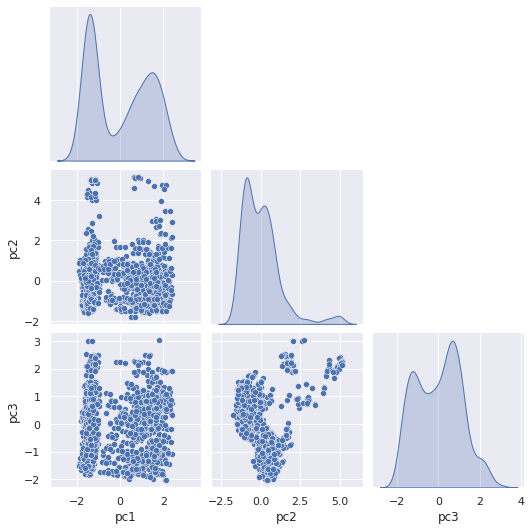

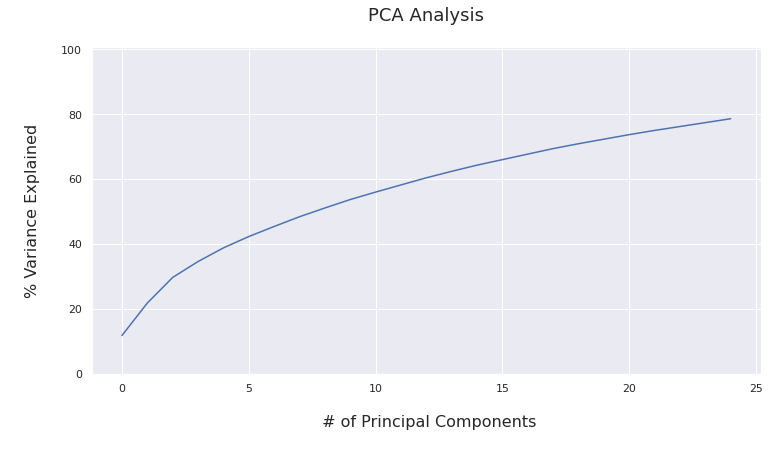

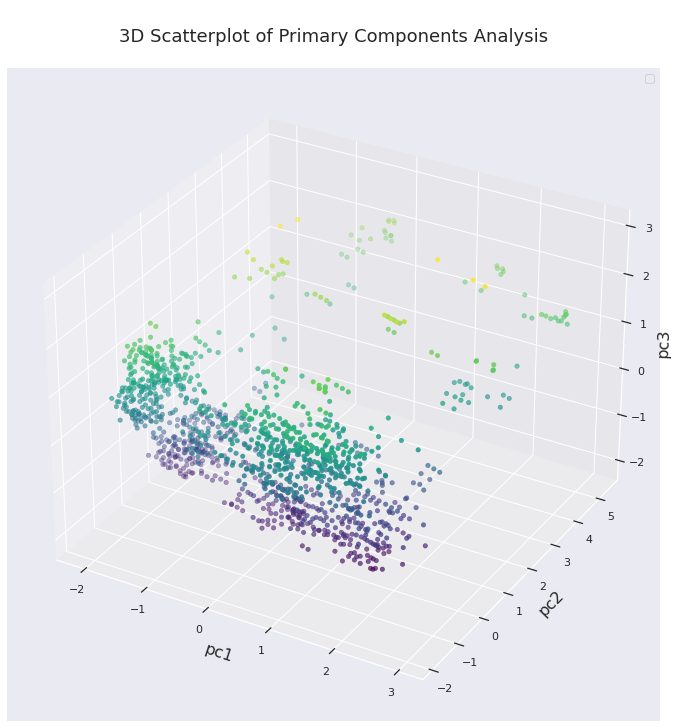

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1725 split n: 7

Training Observations: 1510 
Training Predictions: 1510

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.12076915 0.10068405 0.07714493]

This is the original data fed to the model: 
 [[-7.16887574e-01  1.33167861e-03  1.86534128e-02 ...  8.96642495e-02
  -5.88017528e-03 -8.03546334e-05]
 [-6.80173953e-01  3.89473668e-03  1.43651315e-02 ...  4.44928959e-02
  -1.16859339e-02 -2.14313540e-04]
 [-7.07580238e-01  2.67643977e-03  2.14092085e-03 ...  3.88295580e-04
  -1.53651363e-02 -5.96660546e-04]
 ...
 [ 6.79262271e-01  3.99574502e-03  2.23543141e-02 ...  4.93655179e-02
   1.39132030e-02  1.23147897e-03]
 [ 5.66873671e-01 -9.29446800e-03 -2.49929913e-02 ... -3.92229708e-02
   1.46766771e-02 -1.38008262e-04]
 [ 9.51910224e-01 -3.88617288e-03 -6.25707327e-03 ... -1.33673083e-02
   1.96884474e-02  7.03067565e-04]] 



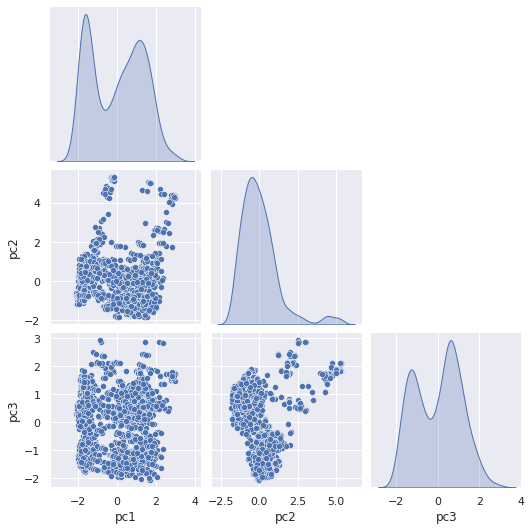

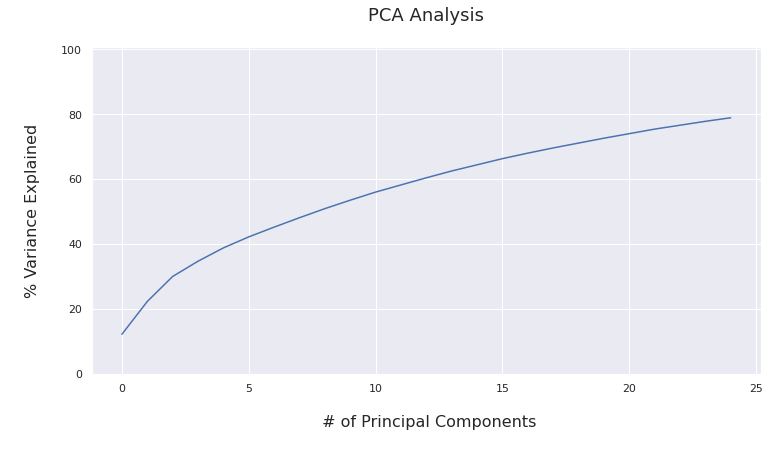

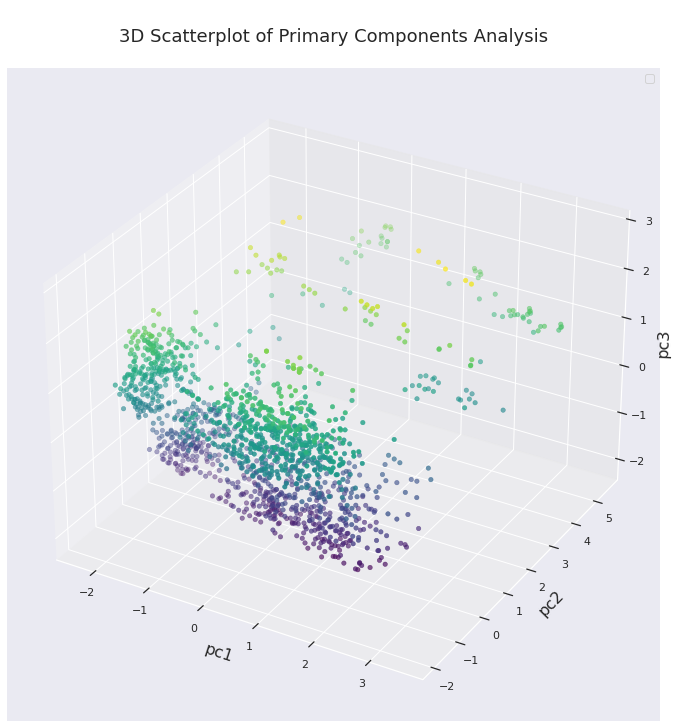

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 1940 split n: 8

Training Observations: 1725 
Training Predictions: 1725

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.1190495  0.1013176  0.07598176]

This is the original data fed to the model: 
 [[-6.33181125e-01  1.46361117e-03  1.75827905e-02 ...  9.55871376e-02
  -5.62929153e-03  1.59192553e-05]
 [-5.97932370e-01  3.58409922e-03  1.28201114e-02 ...  5.03222015e-02
  -1.13449299e-02 -1.11078671e-04]
 [-6.18681759e-01  2.18814313e-03  2.51865292e-04 ...  7.10513997e-03
  -1.49834952e-02 -4.25541729e-04]
 ...
 [ 6.98766239e-02 -6.97126076e-03 -2.06931275e-02 ... -2.84055071e-02
   4.82899013e-03 -3.86832122e-04]
 [ 5.57458474e-01 -5.40433369e-03 -1.87830017e-02 ... -5.76640618e-02
   1.13064507e-02 -4.23575268e-05]
 [ 7.43296730e-01 -5.85499468e-03 -2.20910215e-02 ... -7.69041667e-02
   1.38774244e-02  4.03279962e-07]] 



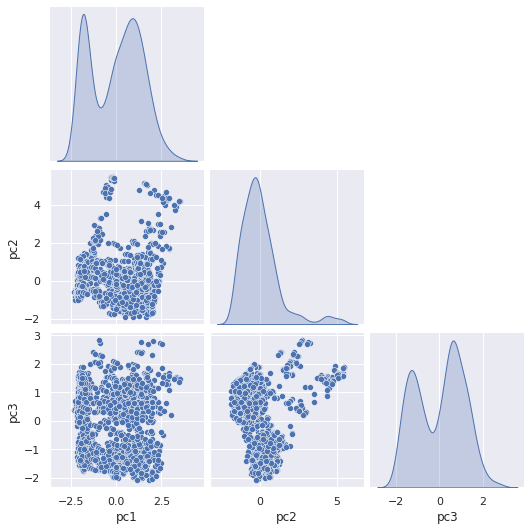

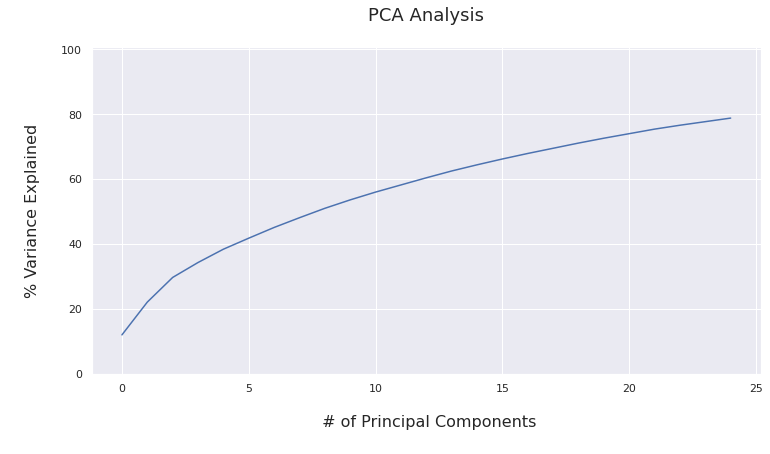

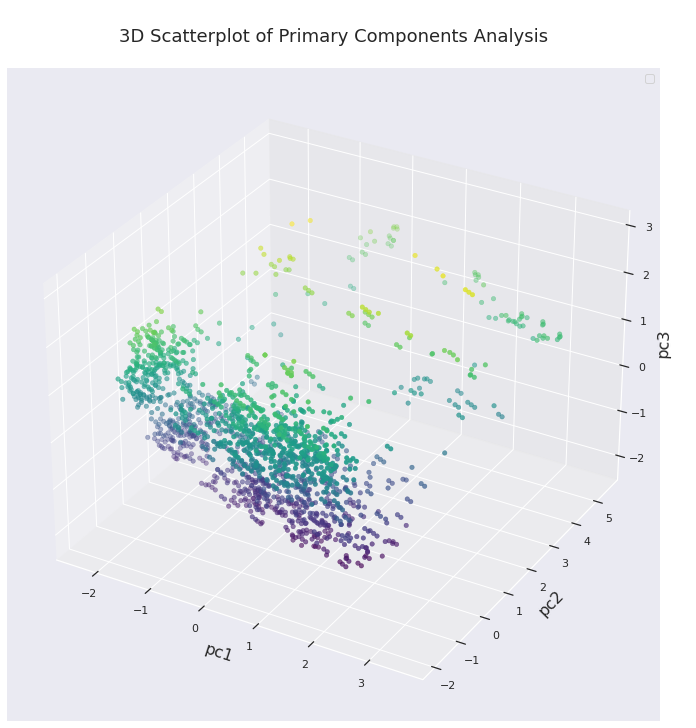

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 2155 split n: 9

Training Observations: 1940 
Training Predictions: 1940

Testing Observations: 215 
Testing Predictions: 215
Increase in Explained Variance with every additional principal component:  [0.13090684 0.09975532 0.0739603 ]

This is the original data fed to the model: 
 [[-1.06542877e+00  1.74806557e-03  1.55936709e-02 ...  1.02747476e-01
  -4.22019581e-03  2.17128935e-04]
 [-1.02938039e+00  3.72690922e-03  1.13145472e-02 ...  5.85793262e-02
  -9.79152186e-03  1.04354838e-04]
 [-1.04625118e+00  2.19226378e-03 -1.26706648e-03 ...  1.40894001e-02
  -1.29473704e-02 -1.60800864e-04]
 ...
 [ 1.16891035e+00 -2.73346706e-03  2.66777084e-03 ... -6.47800029e-03
   1.56088328e-02  2.10574446e-04]
 [ 7.21619594e-01 -6.66881465e-03 -1.75154352e-02 ... -4.40140030e-02
   1.01271980e-02 -2.42682630e-04]
 [ 8.18587755e-01  9.41985534e-03  5.09137396e-02 ...  1.13315164e-01
   1.24030680e-02  1.11657804e-03]] 



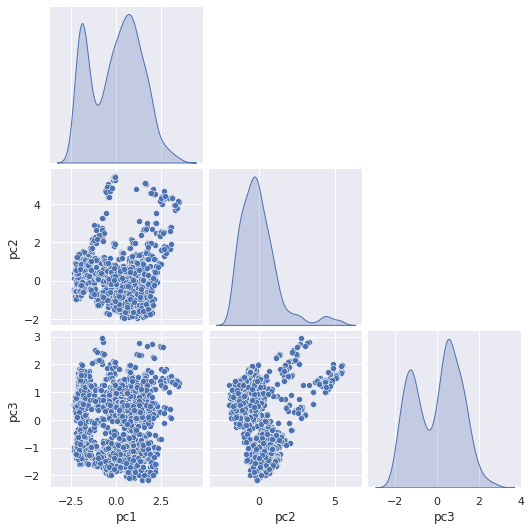

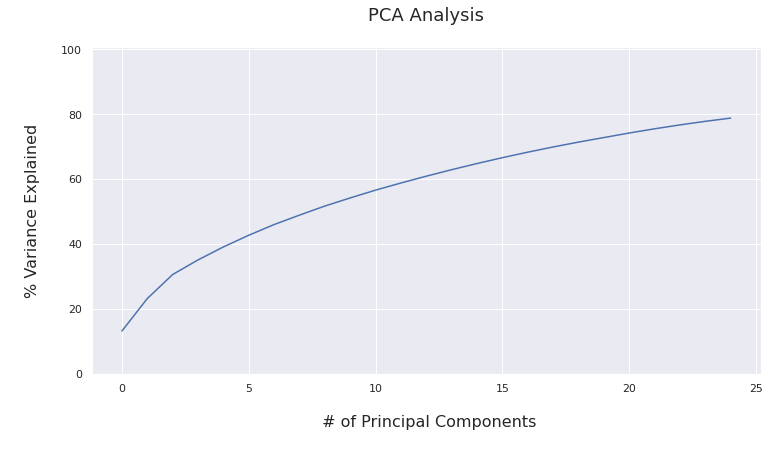

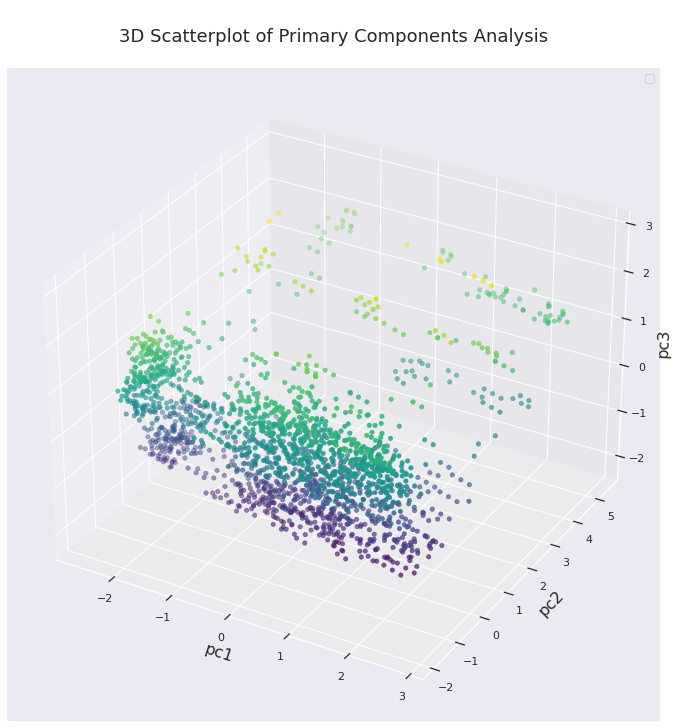

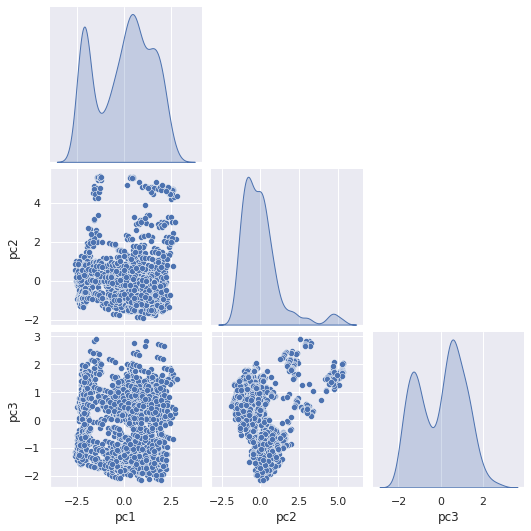

In [148]:
# df_MIDDLE_1_NOG - NO GRADUATE LEVEL PROGRAMS (NO MASTERS AND DOCTORATE DEGREES)
# df_MIDDLE_1_G (  GRADUATE LEVEL DEGREES NO BACHELORS AND NO ASSOCIATES DEGREES
X = df_MIDDLE_1_NOG.iloc[:, :-2].values
y = df_MIDDLE_1_NOG.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)

  X_test.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)
  
  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)
  
  scaler = ColumnTransformer(
      transformers=[("num", numeric_transformer, numeric_features),
                    ("cat", categorical_transformer, categorical_features)
                    ])
  scaler_y = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)

  X_train_scaled1=pd.DataFrame(X_train_scaled)
  X_test_scaled1=pd.DataFrame(X_test_scaled)

  y_train_scaled = scaler_y.fit_transform(y_train)
  y_test_scaled = scaler_y.transform(y_test)

  y_train_scaled1=pd.DataFrame(y_train_scaled)
  y_test_scaled1=pd.DataFrame(y_test_scaled)

  pca = PCA(n_components=25)
# X_train_pca = pca.fit(X_train_scaled1)
  pca.fit(X_train_scaled1)
# X_test_pca = pca.fit(X_test_scaled1)
  variance = pca.explained_variance_ratio_ 
  var=np.cumsum(np.round(variance, 3)*100)
  plt.figure(figsize=(12,6))
  plt.ylabel('\n% Variance Explained\n', fontsize = 16)
  plt.xlabel('\n # of Principal Components\n', fontsize = 16)
  plt.title('PCA Analysis\n', fontsize=18)
  plt.ylim(0,100.5)
  plt.plot(var)
  # plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Analysis.png")

# Looking at a total of three pricipal components 
  pca2 = PCA(n_components=3)
# X_train_pca = pca2.fit(X_train_scaled1)
# X_test_pca = pca2.fit(X_test_scaled1)
  pca2.fit(X_train_scaled1)
  pca_scale_result = pca2.transform(X_train_scaled1)
  pca_df = pd.DataFrame(pca_scale_result, columns=['pc1', 'pc2', 'pc3'])
  print("Increase in Explained Variance with every additional principal component: ", pca2.explained_variance_ratio_)
  pca_df


# data_reduced = np.dot(data, pca.components_.T) # transform
  data_original = np.dot(pca_scale_result, pca2.components_) # inverse_transform
  print("\nThis is the original data fed to the model: \n", data_original,"\n")

  fig = plt.figure(figsize=(12,12))
  ax = fig.add_subplot(projection='3d')
# ax = plt.axes(projection='3d')
# Data for three-dimensional scattered points
  zdata = pca_df['pc3']
  xdata = pca_df['pc1']
  ydata = pca_df['pc2']

### SCALING ONE LINER 
# ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([2,2, 2, 2]))


# # # Change the viewing angle to an agreeable one
# ax.view_init(2,None)

  ax.scatter(xdata, ydata, zdata, c=zdata, cmap='viridis', linewidth=0.5);

# ax.contour3D(xdata, ydata, zdata, 50, cmap='binary')
  ax.set_title('\n3D Scatterplot of Primary Components Analysis\n', fontsize=18)
  ax.set_xlabel('\npc1\n', fontsize=16)
  ax.set_ylabel('\npc2\n', fontsize=16)
  ax.set_zlabel('\npc3\n', fontsize=16);

# ax.plot(z, y, x, label='parametric curve')
  ax.legend()

  plt.show()
# plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Analysis_Scatterplot3D.png")

#Seaborn pair plot
# sns.pairplot(pca_df, hue='pc1')

# sns.pairplot(pca_df, corner=True)

  g = sns.pairplot(pca_df, diag_kind="kde", corner=True)



  i = i + 1 






Observations n: 425 split n: 1

Training Observations: 215 
Training Predictions: 215

Testing Observations: 210 
Testing Predictions: 210
Increase in Explained Variance with every additional principal component:  [0.12386551 0.11581095 0.08089255]

This is the original data fed to the model: 
 [[ 1.15446498e-17 -3.98307924e-03  1.84887368e-02 ...  4.71553747e-02
   2.69722380e-02  6.89550457e-03]
 [-2.45965687e-18  2.51729952e-02 -4.00794142e-03 ... -2.30034437e-02
  -1.14550522e-02  1.17404114e-02]
 [-6.83621011e-18  7.25416429e-03 -2.34535019e-03 ...  1.82398233e-03
  -2.77174348e-04  4.14011867e-03]
 ...
 [ 6.45407766e-19 -1.13536315e-02 -4.66465929e-04 ...  2.81436893e-03
   1.12627383e-03 -6.64836093e-03]
 [ 3.00669962e-18 -1.98419002e-02 -2.61768313e-03 ... -5.81200336e-03
  -3.19570848e-03 -1.32506841e-02]
 [-2.63417774e-18 -1.60187018e-02 -5.58187391e-03 ... -7.04156348e-03
  -4.94017102e-03 -1.16773152e-02]] 



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


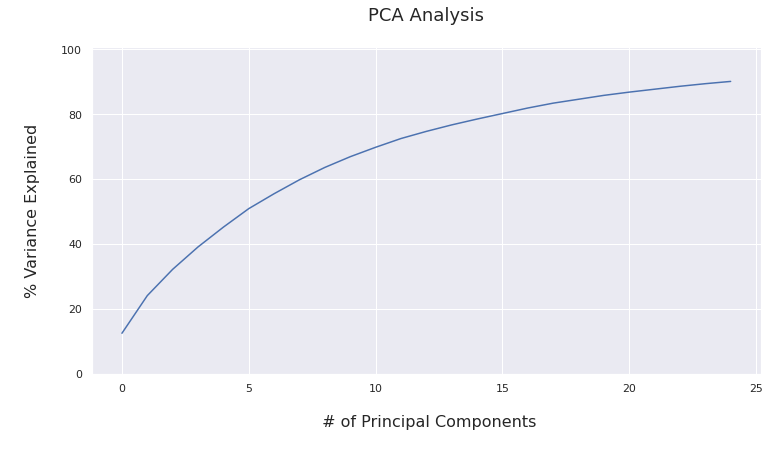

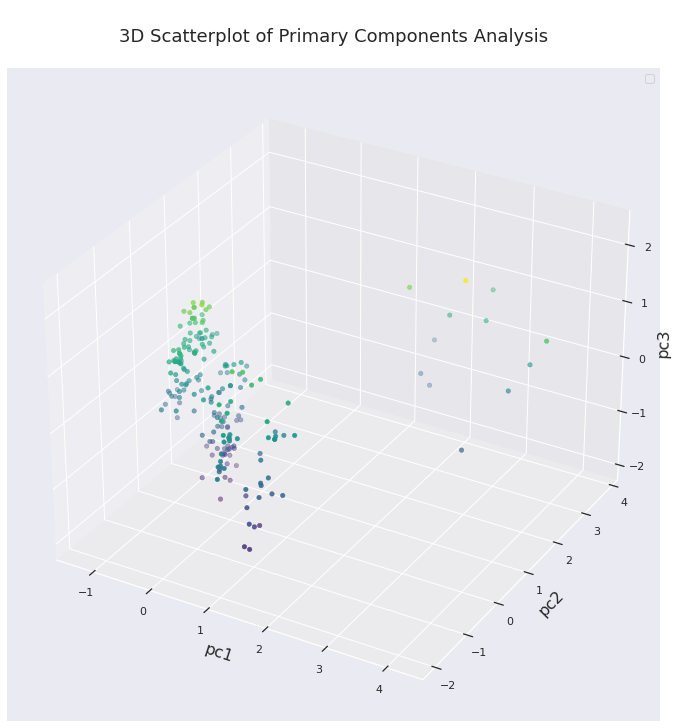

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 635 split n: 2

Training Observations: 425 
Training Predictions: 425

Testing Observations: 210 
Testing Predictions: 210
Increase in Explained Variance with every additional principal component:  [0.11531636 0.09772292 0.07887945]

This is the original data fed to the model: 
 [[-0.0002229   0.00199709  0.01822966 ...  0.04340354  0.03659354
   0.01174681]
 [-0.06782042  0.03341695  0.00352117 ... -0.01436309 -0.00692714
   0.01383086]
 [-0.02308392  0.01233821  0.00296426 ... -0.0050175  -0.00065285
   0.00552964]
 ...
 [ 0.01099278 -0.00312808  0.01310408 ...  0.03009982  0.02654988
   0.0061932 ]
 [ 0.01562332  0.0091059   0.10352321 ...  0.21883993  0.19714344
   0.06143198]
 [ 0.03887659 -0.02092754 -0.01046304 ... -0.0069228  -0.01088404
  -0.01299373]] 



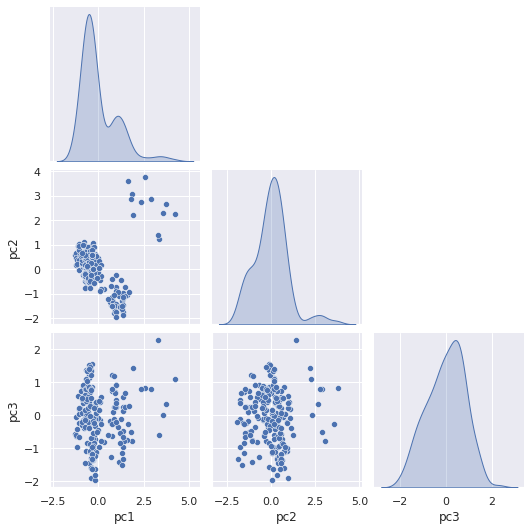

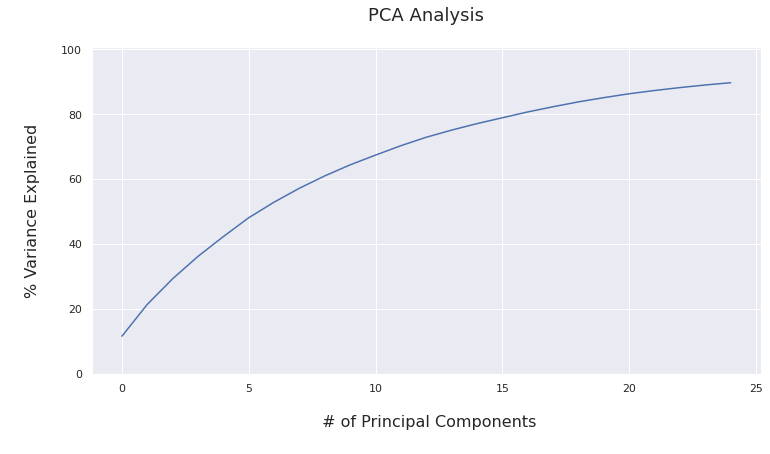

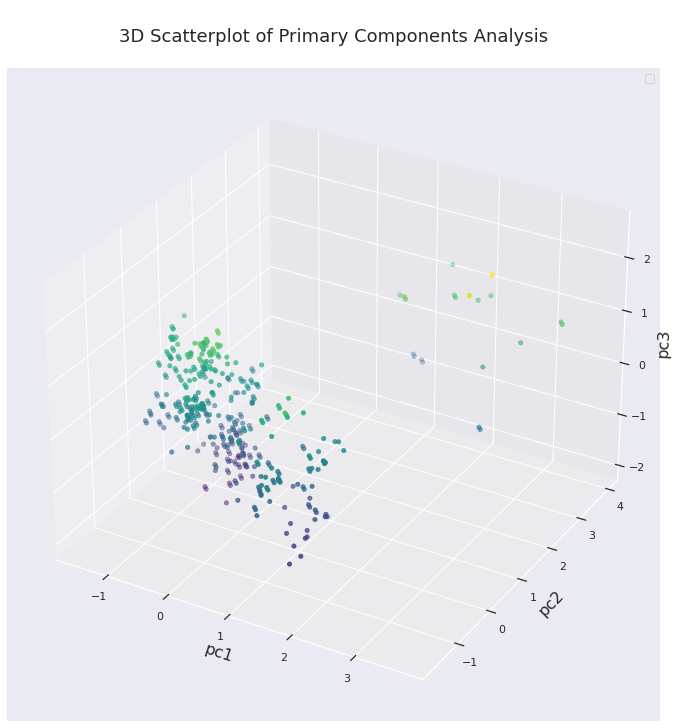


Observations n: 845 split n: 3

Training Observations: 635 
Training Predictions: 635

Testing Observations: 210 
Testing Predictions: 210
Increase in Explained Variance with every additional principal component:  [0.14460855 0.10155771 0.07139171]

This is the original data fed to the model: 
 [[-5.38118557e-01  1.71312772e-02  1.53946048e-02 ...  2.75642146e-02
   2.19928624e-02  1.21650475e-02]
 [-6.33028886e-01  9.49657389e-03  5.10391236e-03 ...  1.16929330e-02
   9.88312974e-03  7.11893074e-03]
 [-5.83194131e-01 -1.10893033e-03  1.12410219e-02 ...  1.58660243e-02
   1.52829220e-02  3.59321567e-03]
 ...
 [ 1.51198264e+00  5.20253354e-02  1.01355538e-01 ...  1.46657754e-01
   1.13740393e-01  3.78568940e-02]
 [ 1.21041293e+00  1.60935122e-02  5.41863951e-03 ...  9.47961008e-03
   2.42915759e-03  4.21656761e-03]
 [ 1.18632754e+00 -4.65938340e-03  8.33294206e-04 ... -3.71935788e-03
  -5.17369200e-03 -5.59404348e-03]] 


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


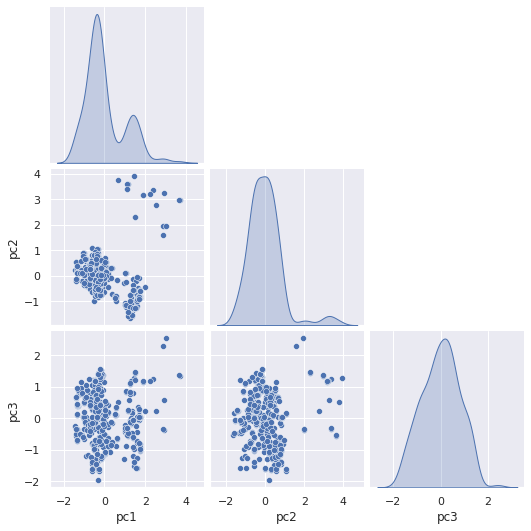

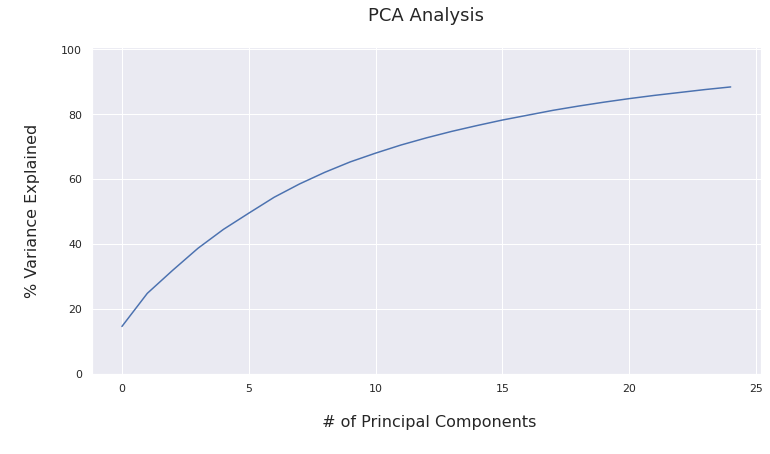

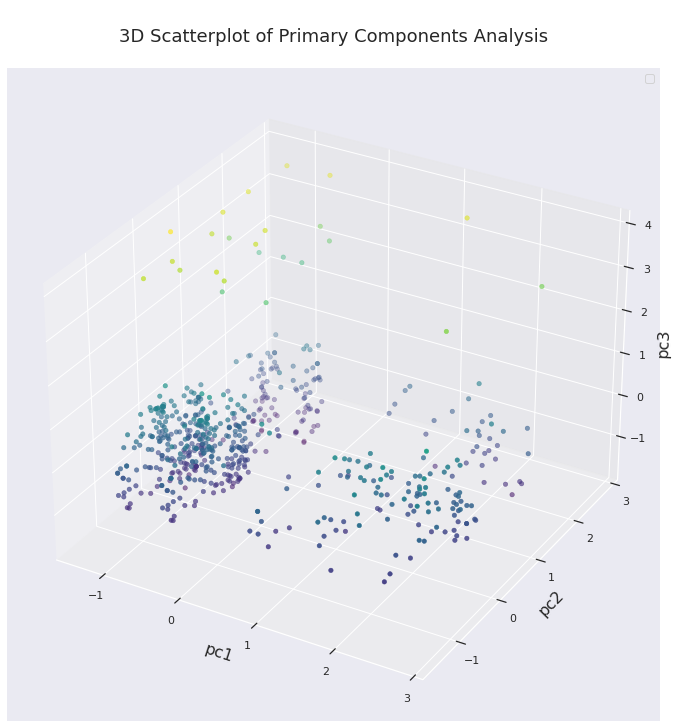


Observations n: 1055 split n: 4

Training Observations: 845 
Training Predictions: 845

Testing Observations: 210 
Testing Predictions: 210
Increase in Explained Variance with every additional principal component:  [0.15763581 0.10005815 0.06783408]

This is the original data fed to the model: 
 [[-3.91273414e-01  7.43774085e-03 -9.82422140e-04 ...  1.53063208e-02
   8.14278015e-03  6.49851712e-03]
 [-4.14190871e-01  2.73024859e-02  1.97026737e-02 ...  1.95792373e-02
   2.25729530e-02  1.04106491e-02]
 [-3.71723569e-01  1.43819849e-02  1.83018544e-02 ...  5.02965614e-03
   1.27832454e-02  4.33998139e-03]
 ...
 [ 5.34196549e-01  2.45456693e-02  1.00366036e-02 ...  1.18918964e-02
   1.43160681e-02  5.28555422e-03]
 [ 7.13592352e-01  2.09049441e-02  3.26641439e-03 ...  1.14168497e-02
   1.05432334e-02  4.19540686e-03]
 [ 7.12130231e-01  4.46565777e-03 -9.38907569e-03 ...  3.96057383e-03
  -1.34151476e-03 -1.38178028e-04]] 



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


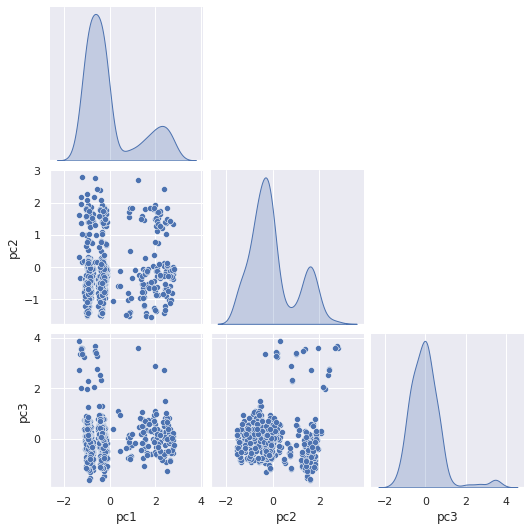

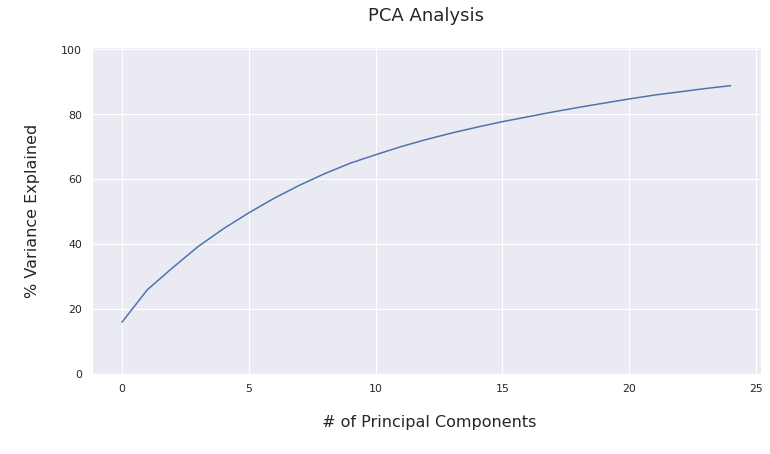

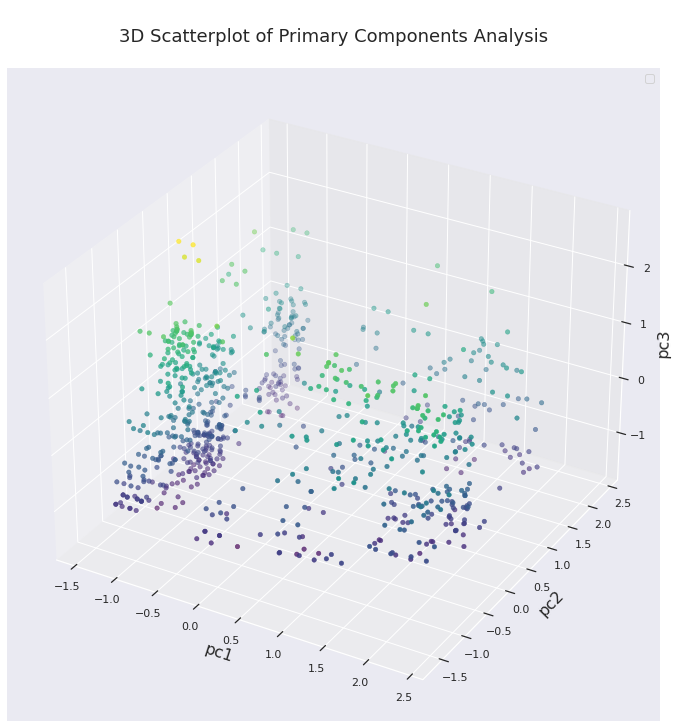


Observations n: 1265 split n: 5

Training Observations: 1055 
Training Predictions: 1055

Testing Observations: 210 
Testing Predictions: 210
Increase in Explained Variance with every additional principal component:  [0.17216007 0.09642495 0.06501138]

This is the original data fed to the model: 
 [[-6.42511098e-01  3.81091477e-03 -2.68625548e-03 ...  2.95595411e-02
   1.49192443e-02  6.42345890e-03]
 [-6.22512768e-01  3.38239778e-02  1.79890164e-02 ...  1.00194018e-02
   1.43481561e-02  8.37991186e-03]
 [-5.61450890e-01  1.34237432e-02  1.47249021e-02 ... -1.23624517e-02
  -6.79111670e-05  2.49159044e-03]
 ...
 [ 8.39202740e-01 -2.36680680e-02 -1.77098913e-02 ... -5.33084572e-04
  -8.57176225e-03 -6.53676441e-03]
 [ 7.00500061e-01  1.12724946e-02  3.62357828e-03 ... -1.08306232e-02
  -3.67046719e-03 -2.17860923e-03]
 [ 6.32529255e-01 -1.07193299e-02 -8.66424109e-03 ... -4.23154840e-03
  -6.25283792e-03 -4.34882151e-03]] 



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


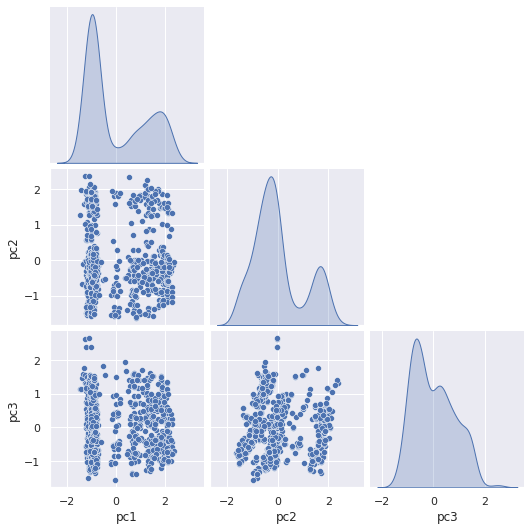

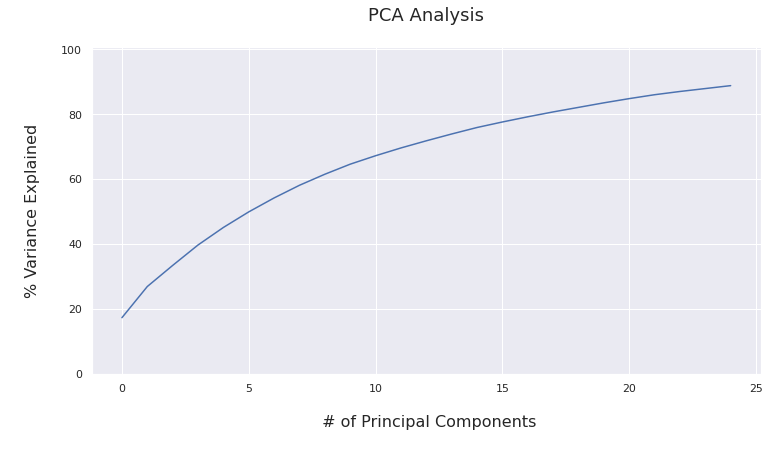

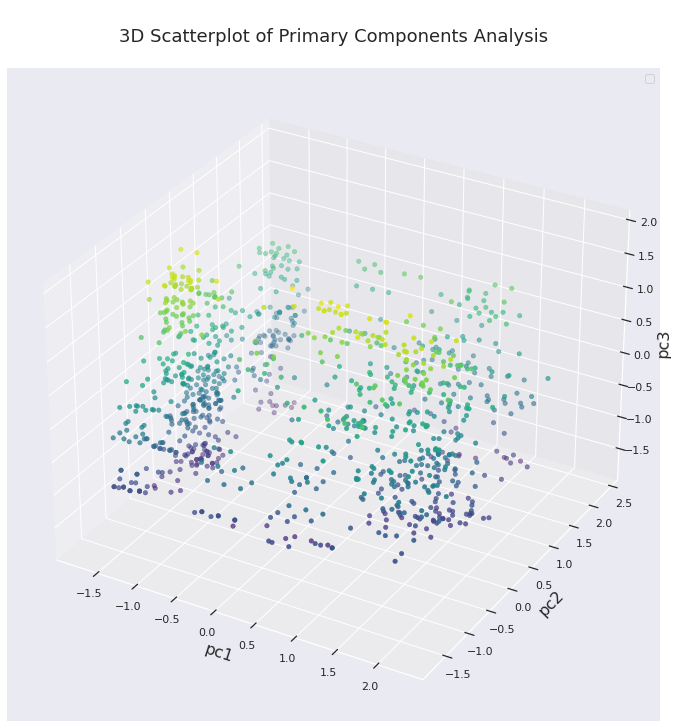


Observations n: 1475 split n: 6

Training Observations: 1265 
Training Predictions: 1265

Testing Observations: 210 
Testing Predictions: 210


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.17692757 0.09400835 0.06235987]

This is the original data fed to the model: 
 [[-8.71234602e-01  3.21948937e-03 -3.87715338e-03 ...  2.67036418e-02
   1.15872099e-02  6.04552043e-03]
 [-8.94507814e-01  3.32997794e-02  1.66937457e-02 ...  8.71277417e-03
   1.44538106e-02  7.18695592e-03]
 [-8.22296532e-01  1.53793200e-02  1.75231608e-02 ... -1.24634835e-02
   2.55257088e-03  2.43805525e-03]
 ...
 [ 7.84348712e-01  8.82361859e-03 -7.97539845e-03 ...  1.48628954e-02
   5.11680091e-03  6.00766585e-04]
 [ 9.17577272e-01  8.54715086e-03 -1.11663249e-02 ...  1.99429246e-02
   6.29058969e-03  8.22221623e-04]
 [ 8.20289739e-01 -8.36767651e-03 -8.39006618e-03 ... -2.04304475e-03
  -5.14006223e-03 -3.44467070e-03]] 



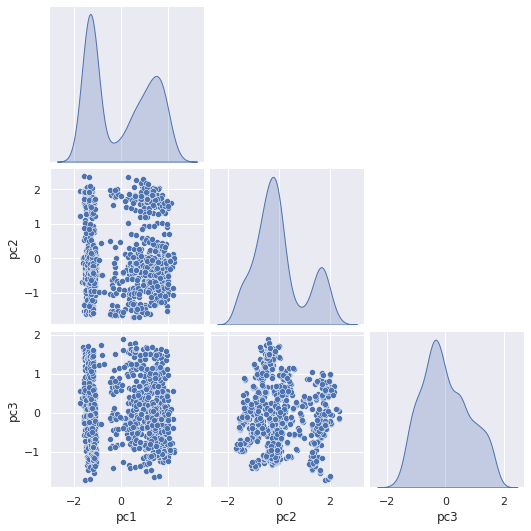

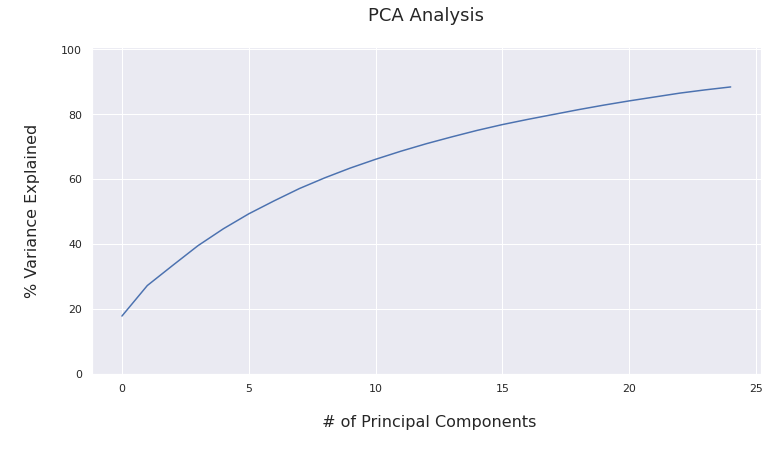

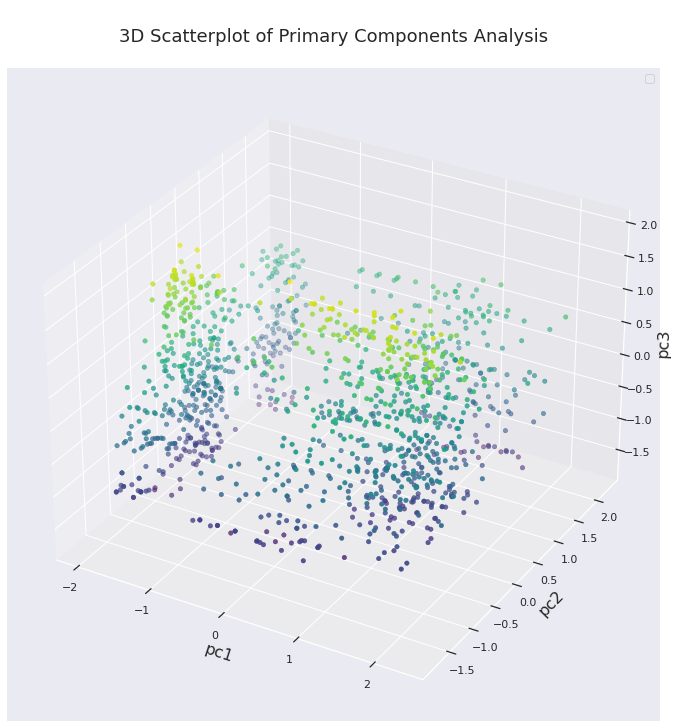


Observations n: 1685 split n: 7

Training Observations: 1475 
Training Predictions: 1475

Testing Observations: 210 
Testing Predictions: 210


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.16473429 0.09257793 0.06173992]

This is the original data fed to the model: 
 [[-7.09300251e-01  1.33604486e-03 -3.77912863e-03 ...  2.52678578e-02
   1.15737025e-02  5.17039712e-03]
 [-6.84482383e-01  3.68885187e-02  1.65467554e-02 ...  5.74877588e-03
   1.10776326e-02  6.70222976e-03]
 [-6.28418831e-01  1.48260068e-02  1.68249359e-02 ... -1.05257523e-02
   1.40141250e-03  2.60500267e-03]
 ...
 [ 6.07873254e-02 -3.95533045e-02 -1.32384645e-02 ...  2.21753686e-04
  -7.13783060e-03 -4.20535258e-03]
 [ 7.31657483e-01 -2.58623076e-02 -1.35750778e-02 ... -5.81827470e-03
  -9.33384891e-03 -5.75252802e-03]
 [ 1.44964501e-02  9.02412873e-03  7.29019078e-04 ...  4.03591264e-03
   2.91904348e-03  1.27870562e-03]] 



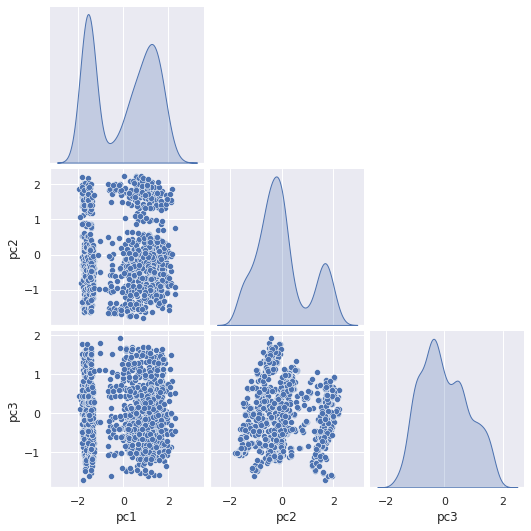

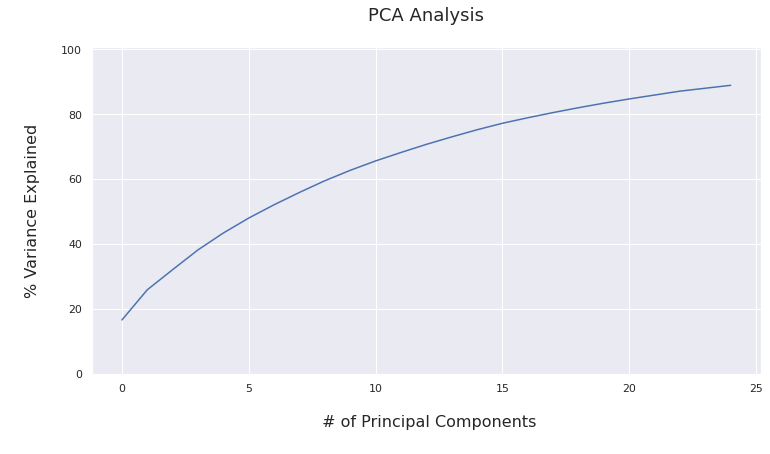

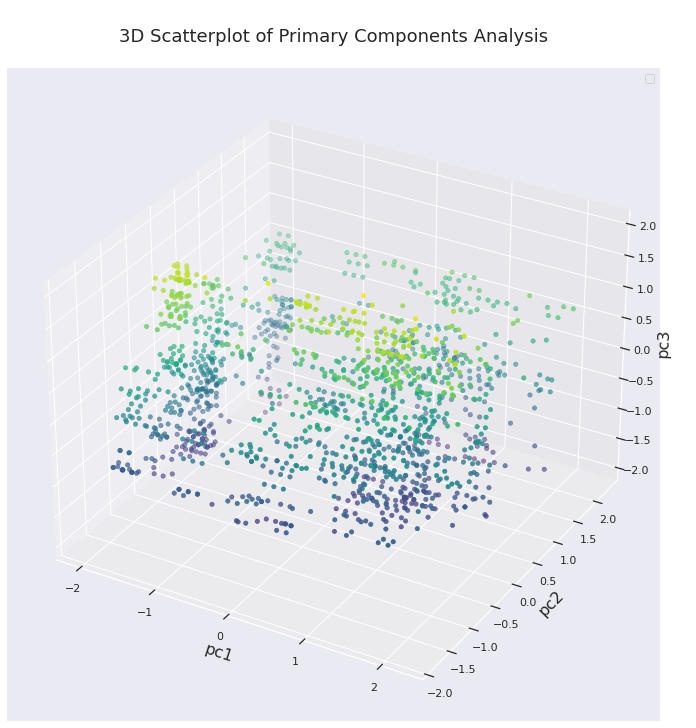


Observations n: 1895 split n: 8

Training Observations: 1685 
Training Predictions: 1685

Testing Observations: 210 
Testing Predictions: 210


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Increase in Explained Variance with every additional principal component:  [0.16605298 0.09086261 0.06217598]

This is the original data fed to the model: 
 [[-6.64484423e-01  3.33956652e-03 -5.10957184e-03 ...  2.23731190e-02
   1.11863218e-02  4.51709095e-03]
 [-5.58438413e-01  3.85386304e-02  1.60210032e-02 ...  5.03956938e-03
   9.07667905e-03  6.62466120e-03]
 [-5.24136847e-01  1.38534272e-02  1.65621602e-02 ... -7.74458607e-03
   1.15539922e-03  2.79910688e-03]
 ...
 [-4.73325625e-03  6.53793557e-03  7.82853937e-03 ... -8.51856559e-03
  -2.19464373e-03  6.41677180e-05]
 [ 6.87082127e-01 -1.05064559e-02 -4.26802724e-03 ... -1.22028137e-02
  -8.55298074e-03 -4.58500229e-03]
 [ 7.43122222e-02 -1.37468707e-02 -2.10282725e-03 ... -4.65792795e-03
  -3.75344871e-03 -2.13664796e-03]] 



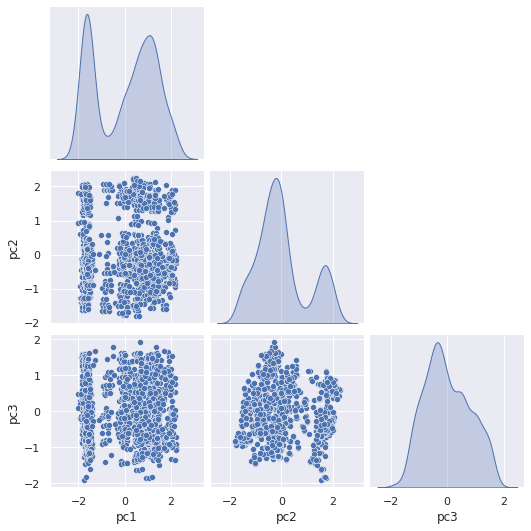

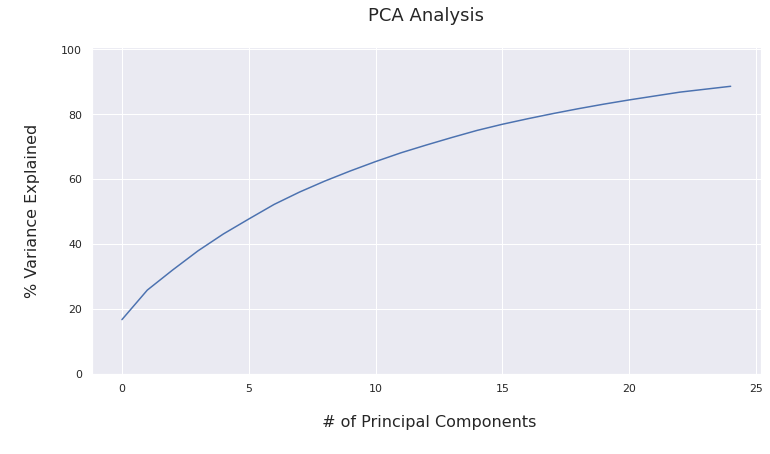

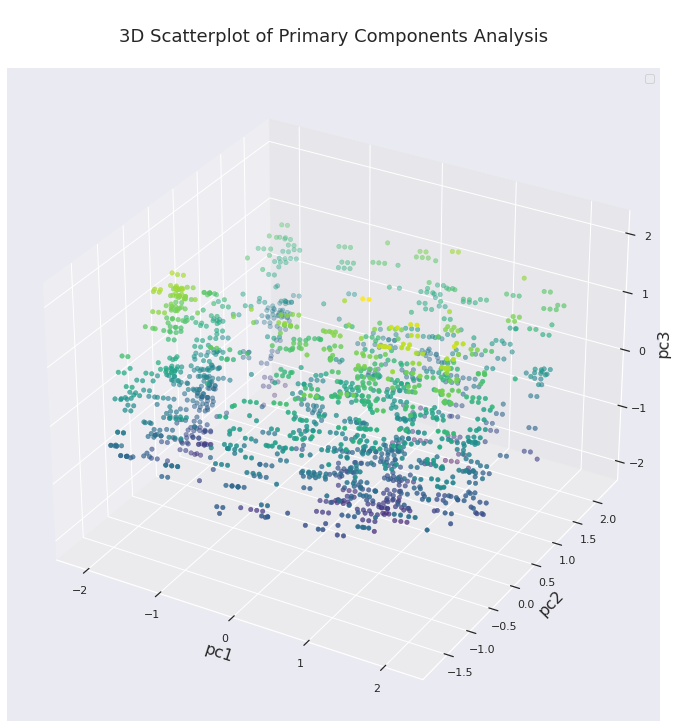

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Observations n: 2105 split n: 9

Training Observations: 1895 
Training Predictions: 1895

Testing Observations: 210 
Testing Predictions: 210
Increase in Explained Variance with every additional principal component:  [0.17423573 0.08928679 0.06219489]

This is the original data fed to the model: 
 [[-7.88251168e-01  6.03318286e-03 -4.37748861e-03 ...  1.91964277e-02
   1.00604267e-02  4.21990559e-03]
 [-6.58733881e-01  3.82227482e-02  1.54722748e-02 ...  5.60927914e-03
   8.68066752e-03  6.32442307e-03]
 [-6.34135138e-01  1.36536559e-02  1.66304996e-02 ... -5.23006774e-03
   2.11396142e-03  2.85496062e-03]
 ...
 [ 4.90895860e-01  3.03944717e-02  1.28659557e-02 ... -1.13515600e-02
  -2.15080867e-03  1.06369282e-03]
 [ 6.87062929e-01  1.87292646e-02  5.20930572e-03 ... -9.50570208e-03
  -3.57980424e-03 -5.98152032e-04]
 [ 7.30859825e-01  2.35185478e-02 -5.21839756e-03 ...  3.99726084e-03
   1.37221398e-03  7.57890014e-04]] 



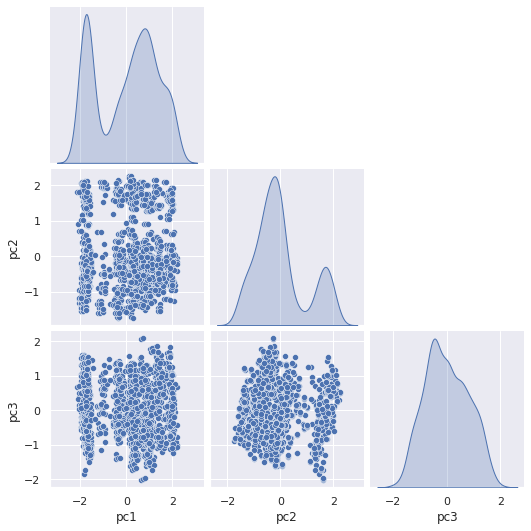

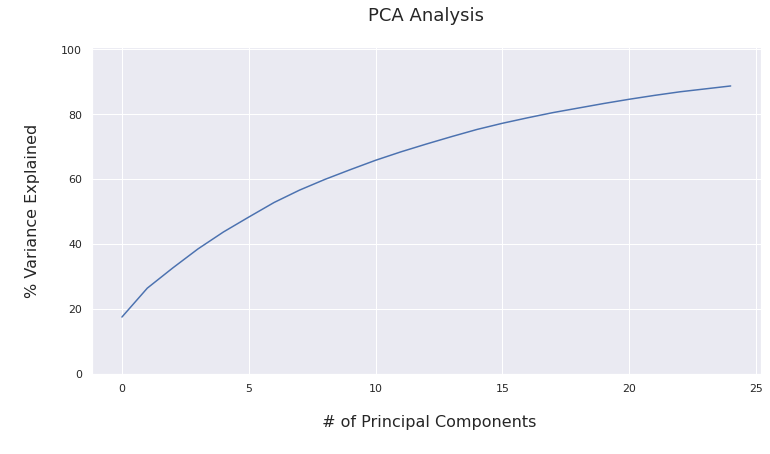

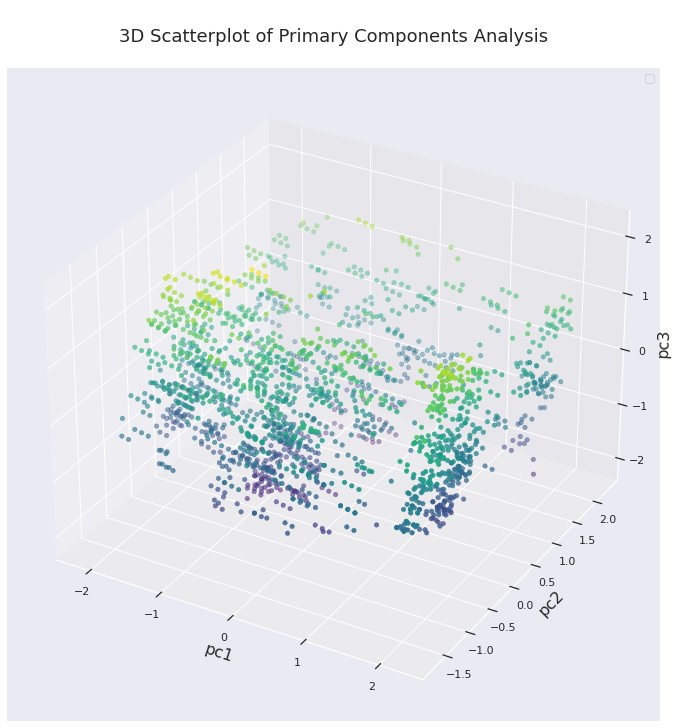

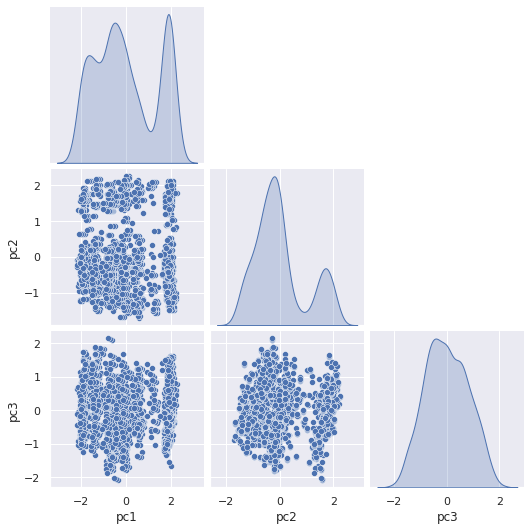

In [152]:
# df_MIDDLE_1_NOG
# df_MIDDLE_1_G - INCLUDES GRADUATE STUDENTS - PERFORMS WORSE
X = df_MIDDLE_1_G.iloc[:, :-2].values
y = df_MIDDLE_1_G.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)

  X_test.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)
  
  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)
  
  scaler = ColumnTransformer(
      transformers=[("num", numeric_transformer, numeric_features),
                    ("cat", categorical_transformer, categorical_features)
                    ])
  scaler_y = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)

  X_train_scaled1=pd.DataFrame(X_train_scaled)
  X_test_scaled1=pd.DataFrame(X_test_scaled)

  y_train_scaled = scaler_y.fit_transform(y_train)
  y_test_scaled = scaler_y.transform(y_test)

  y_train_scaled1=pd.DataFrame(y_train_scaled)
  y_test_scaled1=pd.DataFrame(y_test_scaled)

  pca = PCA(n_components=25)
# X_train_pca = pca.fit(X_train_scaled1)
  pca.fit(X_train_scaled1)
# X_test_pca = pca.fit(X_test_scaled1)
  variance = pca.explained_variance_ratio_ 
  var=np.cumsum(np.round(variance, 3)*100)
  plt.figure(figsize=(12,6))
  plt.ylabel('\n% Variance Explained\n', fontsize = 16)
  plt.xlabel('\n # of Principal Components\n', fontsize = 16)
  plt.title('PCA Analysis\n', fontsize=18)
  plt.ylim(0,100.5)
  plt.plot(var)
  # plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Analysis.png")

# Looking at a total of three pricipal components 
  pca2 = PCA(n_components=3)
# X_train_pca = pca2.fit(X_train_scaled1)
# X_test_pca = pca2.fit(X_test_scaled1)
  pca2.fit(X_train_scaled1)
  pca_scale_result = pca2.transform(X_train_scaled1)
  pca_df = pd.DataFrame(pca_scale_result, columns=['pc1', 'pc2', 'pc3'])
  print("Increase in Explained Variance with every additional principal component: ", pca2.explained_variance_ratio_)
  pca_df


# data_reduced = np.dot(data, pca.components_.T) # transform
  data_original = np.dot(pca_scale_result, pca2.components_) # inverse_transform
  print("\nThis is the original data fed to the model: \n", data_original,"\n")

  fig = plt.figure(figsize=(12,12))
  ax = fig.add_subplot(projection='3d')
# ax = plt.axes(projection='3d')
# Data for three-dimensional scattered points
  zdata = pca_df['pc3']
  xdata = pca_df['pc1']
  ydata = pca_df['pc2']

### SCALING ONE LINER 
# ax.get_proj = lambda: np.dot(Axes3D.get_proj(ax), np.diag([2,2, 2, 2]))


# # # Change the viewing angle to an agreeable one
# ax.view_init(2,None)

  ax.scatter(xdata, ydata, zdata, c=zdata, cmap='viridis', linewidth=0.5);

# ax.contour3D(xdata, ydata, zdata, 50, cmap='binary')
  ax.set_title('\n3D Scatterplot of Primary Components Analysis\n', fontsize=18)
  ax.set_xlabel('\npc1\n', fontsize=16)
  ax.set_ylabel('\npc2\n', fontsize=16)
  ax.set_zlabel('\npc3\n', fontsize=16);

# ax.plot(z, y, x, label='parametric curve')
  ax.legend()

  plt.show()
# plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Analysis_Scatterplot3D.png")

#Seaborn pair plot
# sns.pairplot(pca_df, hue='pc1')

# sns.pairplot(pca_df, corner=True)

  g = sns.pairplot(pca_df, diag_kind="kde", corner=True)
# plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/PCA_Pairplots.png")
# g.map_lower(sns.kdeplot, levels=1, color=".2")

# # Save image as a png file # # # 
# plt.savefig("plot.png")


  # return pca_df

  i = i + 1 

 





In [153]:
# x_eps=[]
# ch =[]
# db=[]
# no=[]

# for e in np.arange(0.1, 1.5, 0.02):
#   dbscan1=  DBSCAN(eps=e, min_samples=51)
#   ypred_db =dbscan1.fit_predict(pca_df)
#   x_eps.append(e)
#   ch.append(calinski_harabasz_score(pca_df, ypred_db))
#   db.append(davies_bouldin_score(pca_df, ypred_db))
#   no.append(np.sum(ypred_db==-1))
#   # print(ch)
# plt.plot(x_eps, ch, color = "red", marker = "o", label = "Array elements")
# # plt.legend()
# plt.title('\nCalinski-Harabasz Score (CH Score)\n per Epsilon Value\n', fontsize=18)
# plt.show()
# # plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/CH_Scores.png")

#   plt.plot(x_eps, db, color = "blue", marker = "*", label = "Array elements")
# # plt.legend()
#   plt.title('\nDavies-Bouldin Score (DB Score)\n per Epsilon Value\n', fontsize=18)
#   plt.show()
# # plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/DB_Scores.png")

#   plt.plot(x_eps, no, color = "green", marker = "^", label = "Array elements")
# # plt.legend()
#   plt.title('\nNumber of Noisy Points\n per Epsilon Value\n', fontsize=18)
#   plt.show()
# # plt.savefig("/content/gdrive/Shareddrives/DATA_606_Capstone/Merged_data/NO_Points.png")


ValueError: ignored

In [134]:
df_2nd_SMALL_1=df_2nd_SMALL.copy(deep=False)
df_2nd_SMALL_1.drop(['UNITID','INSTSIZE'], axis=1, inplace=True) #'INSTCAT','HDEGOFFR','HBCU'


Observations n: 2500 split n: 1

Training Observations: 1250 
Training Predictions: 1250

Testing Observations: 1250 
Testing Predictions: 1250
[19:57:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 47.17%

Testing Data Model Accuracy 
(R-squared for Testing Data): 37.41%

Mean absolute error (MAE) (train data):  937.71 
Mean squared error (MSE) (train data):  1618998.29 
Root Mean squared error (RMSE) (train data):  1272.4 

Mean absolute error (MAE) (test data):  981.12 
Mean squared error (MSE) (test data):  1822103.23 
Root Mean squared error (RMSE) (test data):  1349.85 



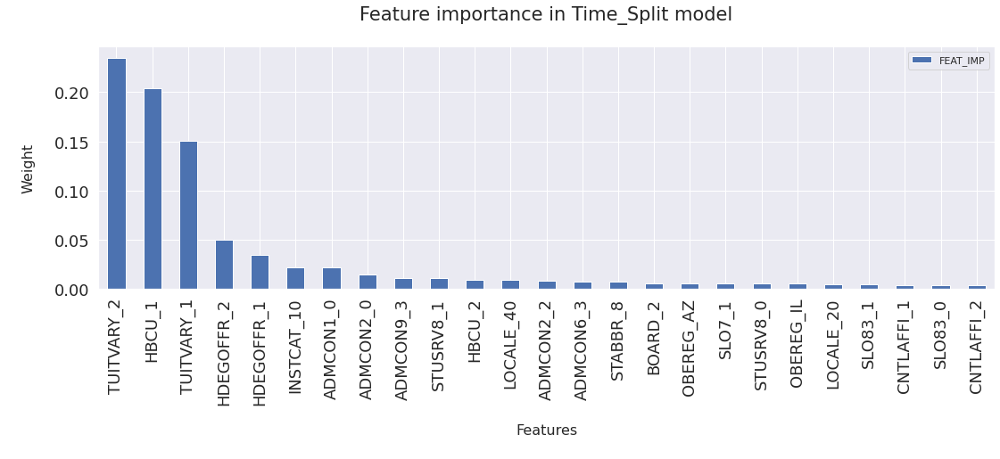

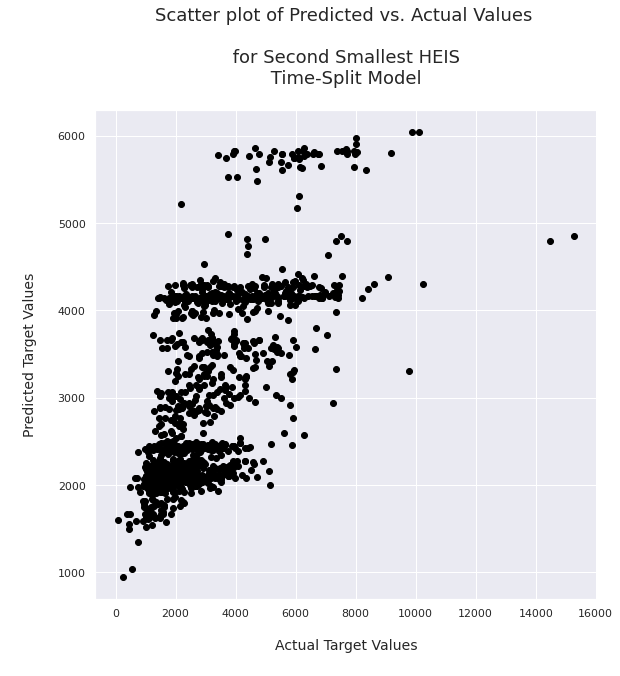


Observations n: 3750 split n: 2

Training Observations: 2500 
Training Predictions: 2500

Testing Observations: 1250 
Testing Predictions: 1250
[19:57:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 45.84%

Testing Data Model Accuracy 
(R-squared for Testing Data): 45.17%

Mean absolute error (MAE) (train data):  946.85 
Mean squared error (MSE) (train data):  1618230.08 
Root Mean squared error (RMSE) (train data):  1272.1 

Mean absolute error (MAE) (test data):  991.87 
Mean squared error (MSE) (test data):  1773619.6 
Root Mean squared error (RMSE) (test data):  1331.77 



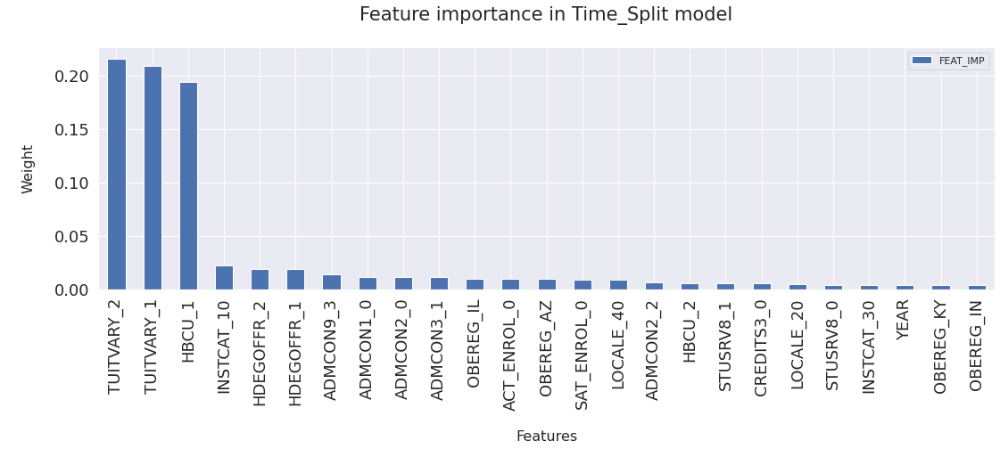

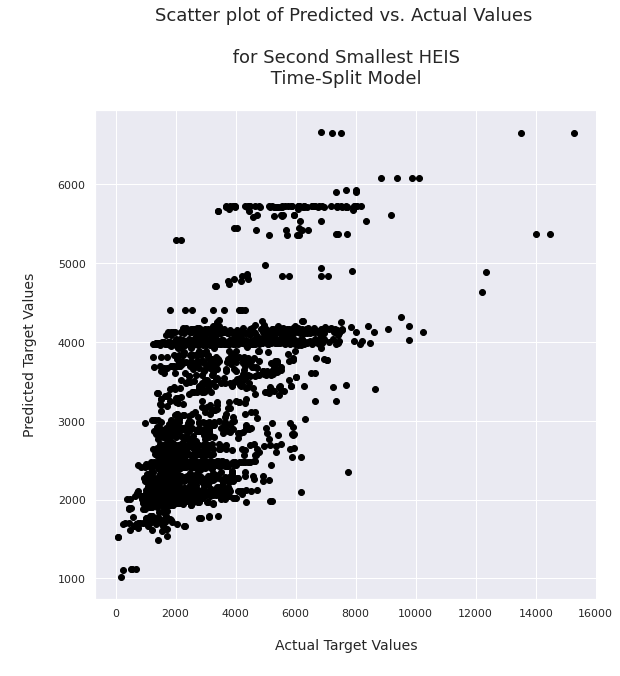


Observations n: 5000 split n: 3

Training Observations: 3750 
Training Predictions: 3750

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 47.62%

Testing Data Model Accuracy 
(R-squared for Testing Data): 46.82%

Mean absolute error (MAE) (train data):  955.26 
Mean squared error (MSE) (train data):  1608476.81 
Root Mean squared error (RMSE) (train data):  1268.26 

Mean absolute error (MAE) (test data):  967.45 
Mean squared error (MSE) (test data):  1668128.96 
Root Mean squared error (RMSE) (test data):  1291.56 



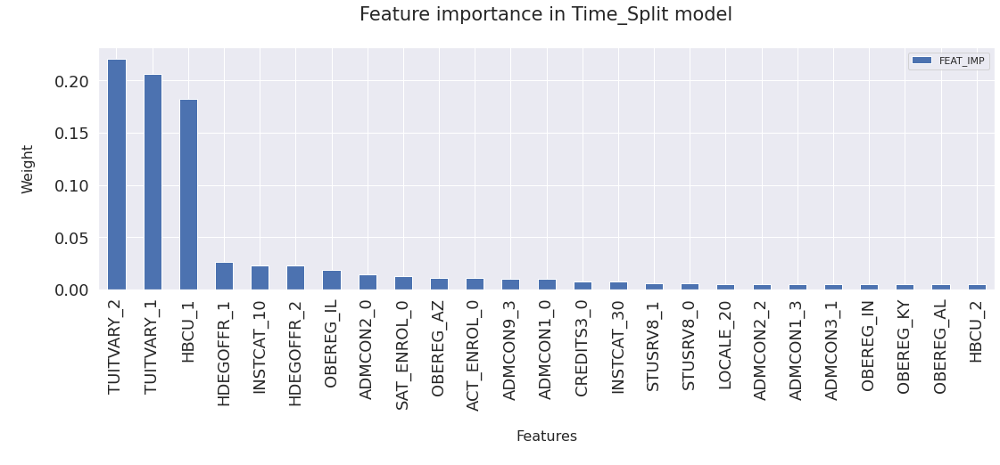

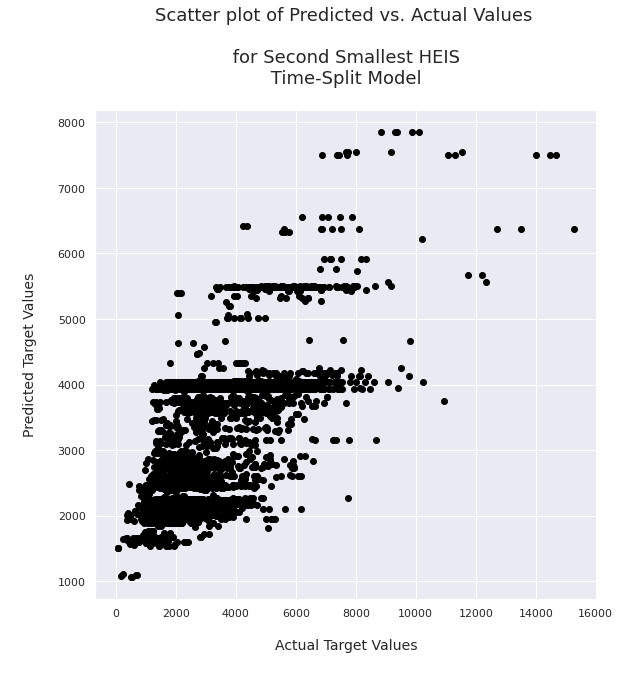


Observations n: 6250 split n: 4

Training Observations: 5000 
Training Predictions: 5000

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 47.84%

Testing Data Model Accuracy 
(R-squared for Testing Data): 41.90%

Mean absolute error (MAE) (train data):  957.66 
Mean squared error (MSE) (train data):  1610196.52 
Root Mean squared error (RMSE) (train data):  1268.94 

Mean absolute error (MAE) (test data):  965.9 
Mean squared error (MSE) (test data):  1662343.51 
Root Mean squared error (RMSE) (test data):  1289.32 



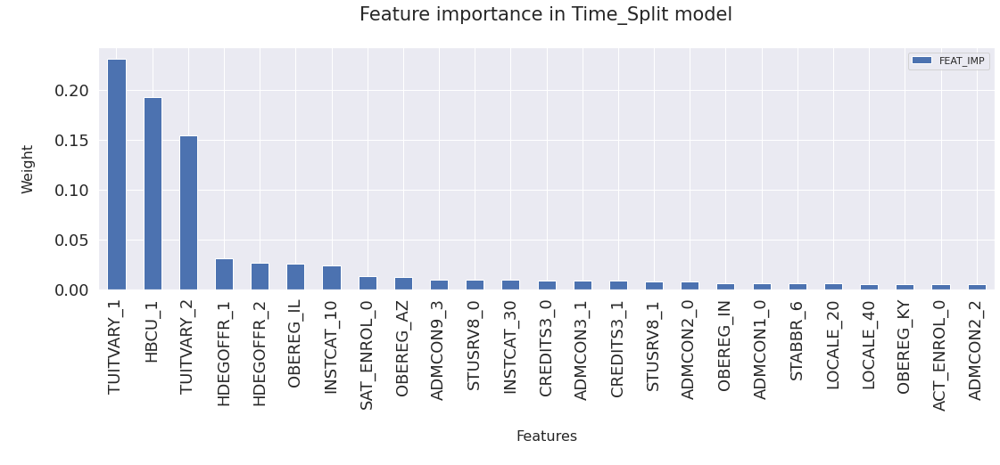

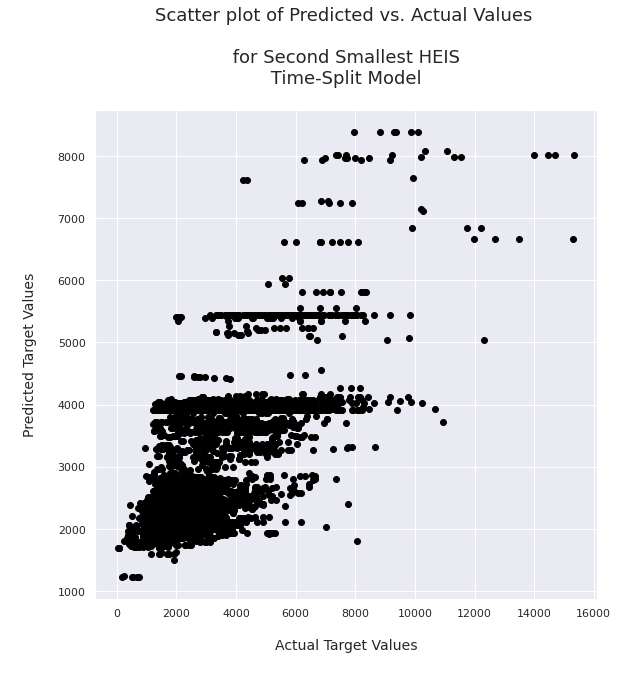


Observations n: 7500 split n: 5

Training Observations: 6250 
Training Predictions: 6250

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 46.92%

Testing Data Model Accuracy 
(R-squared for Testing Data): 38.31%

Mean absolute error (MAE) (train data):  956.12 
Mean squared error (MSE) (train data):  1615283.29 
Root Mean squared error (RMSE) (train data):  1270.94 

Mean absolute error (MAE) (test data):  980.18 
Mean squared error (MSE) (test data):  1810089.76 
Root Mean squared error (RMSE) (test data):  1345.4 



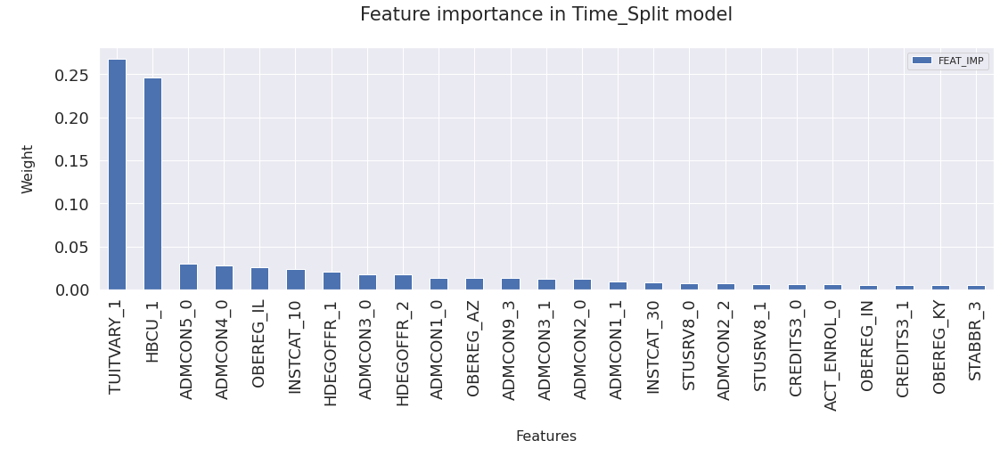

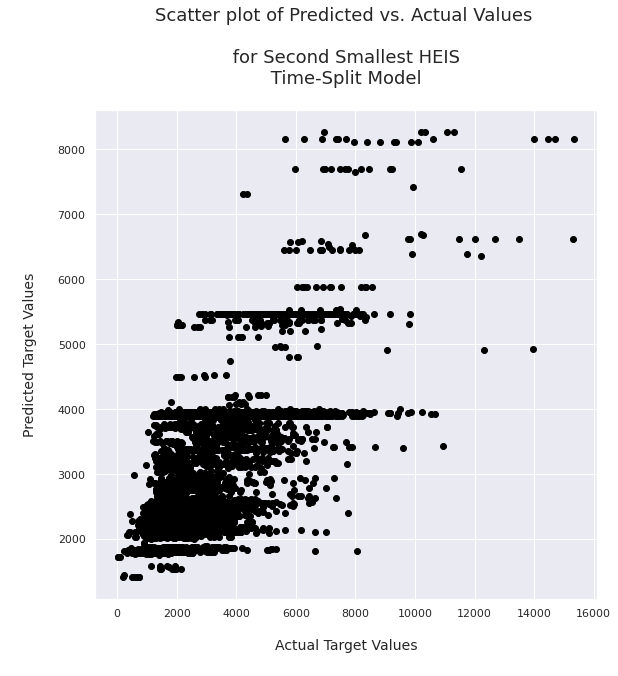


Observations n: 8750 split n: 6

Training Observations: 7500 
Training Predictions: 7500

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:11] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 45.60%

Testing Data Model Accuracy 
(R-squared for Testing Data): 37.80%

Mean absolute error (MAE) (train data):  956.6 
Mean squared error (MSE) (train data):  1645610.22 
Root Mean squared error (RMSE) (train data):  1282.81 

Mean absolute error (MAE) (test data):  994.33 
Mean squared error (MSE) (test data):  1783124.98 
Root Mean squared error (RMSE) (test data):  1335.34 



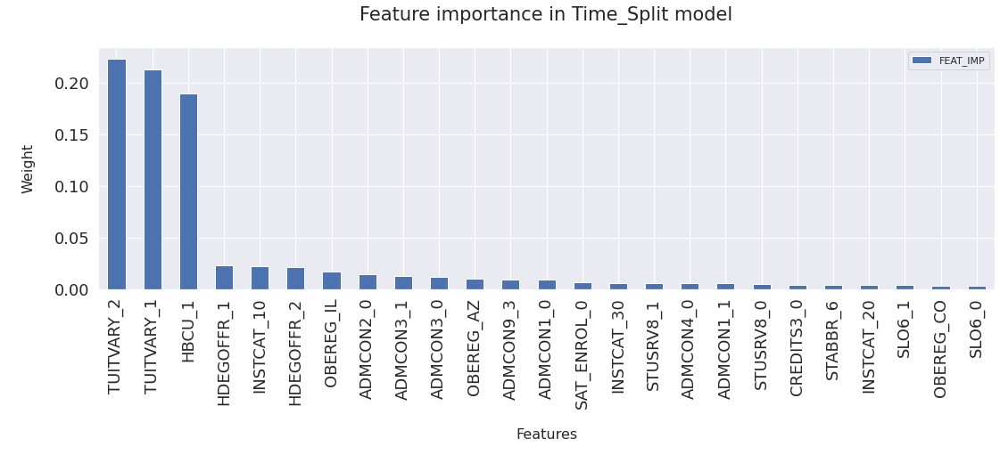

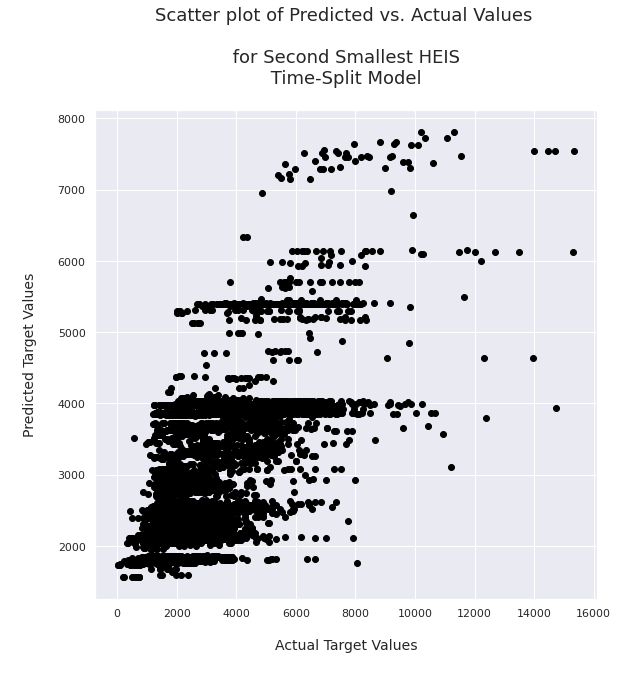


Observations n: 10000 split n: 7

Training Observations: 8750 
Training Predictions: 8750

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:16] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 44.63%

Testing Data Model Accuracy 
(R-squared for Testing Data): 35.56%

Mean absolute error (MAE) (train data):  959.47 
Mean squared error (MSE) (train data):  1663059.92 
Root Mean squared error (RMSE) (train data):  1289.6 

Mean absolute error (MAE) (test data):  1009.5 
Mean squared error (MSE) (test data):  1947962.29 
Root Mean squared error (RMSE) (test data):  1395.69 



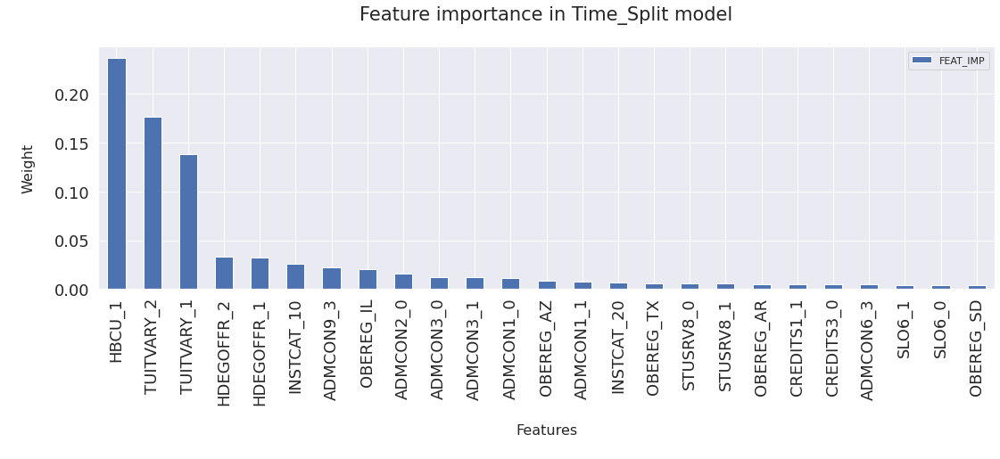

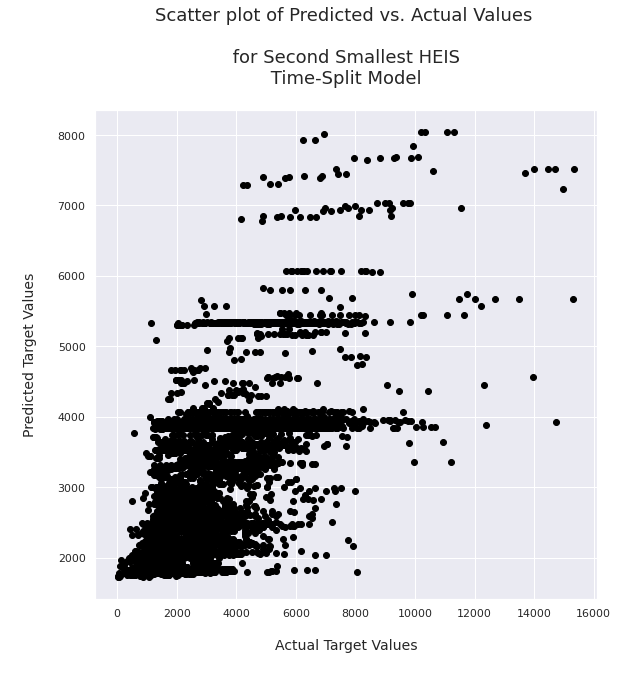


Observations n: 11250 split n: 8

Training Observations: 10000 
Training Predictions: 10000

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:21] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 43.84%

Testing Data Model Accuracy 
(R-squared for Testing Data): 39.24%

Mean absolute error (MAE) (train data):  964.82 
Mean squared error (MSE) (train data):  1688085.24 
Root Mean squared error (RMSE) (train data):  1299.26 

Mean absolute error (MAE) (test data):  1002.74 
Mean squared error (MSE) (test data):  1764884.6 
Root Mean squared error (RMSE) (test data):  1328.49 



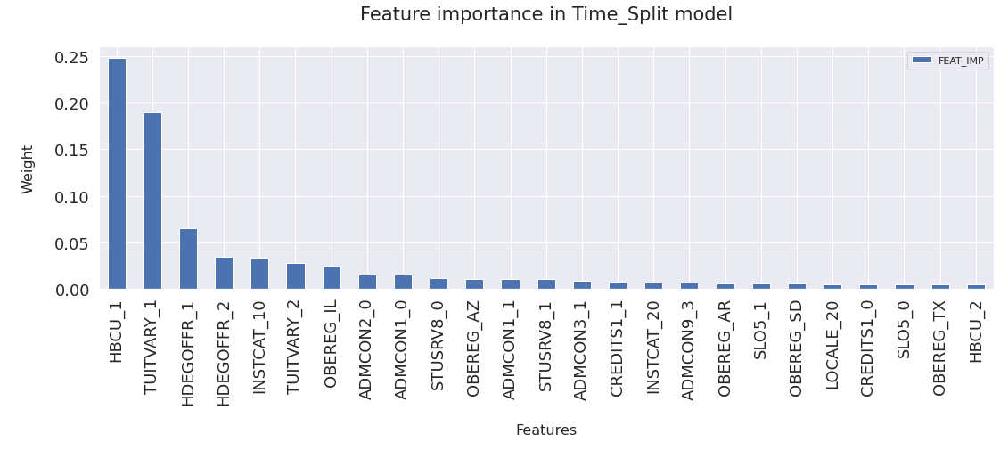

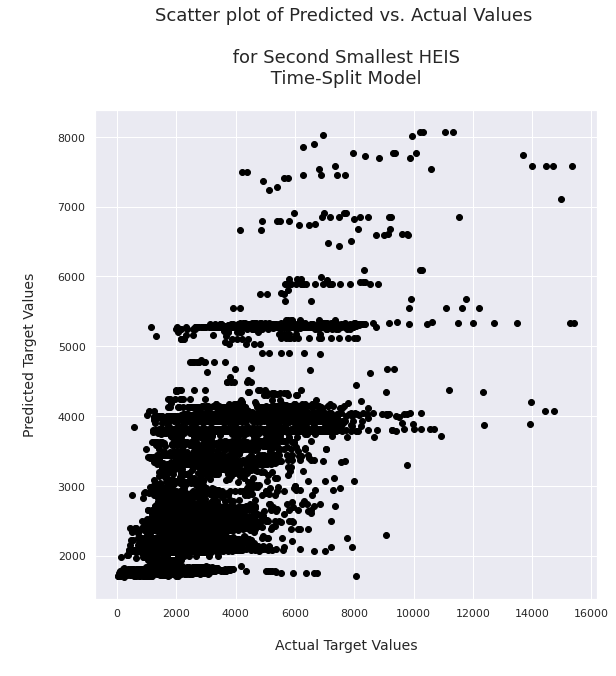


Observations n: 12500 split n: 9

Training Observations: 11250 
Training Predictions: 11250

Testing Observations: 1250 
Testing Predictions: 1250
[19:58:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 43.28%

Testing Data Model Accuracy 
(R-squared for Testing Data): 41.54%

Mean absolute error (MAE) (train data):  968.94 
Mean squared error (MSE) (train data):  1698581.11 
Root Mean squared error (RMSE) (train data):  1303.3 

Mean absolute error (MAE) (test data):  1006.35 
Mean squared error (MSE) (test data):  1817825.18 
Root Mean squared error (RMSE) (test data):  1348.27 



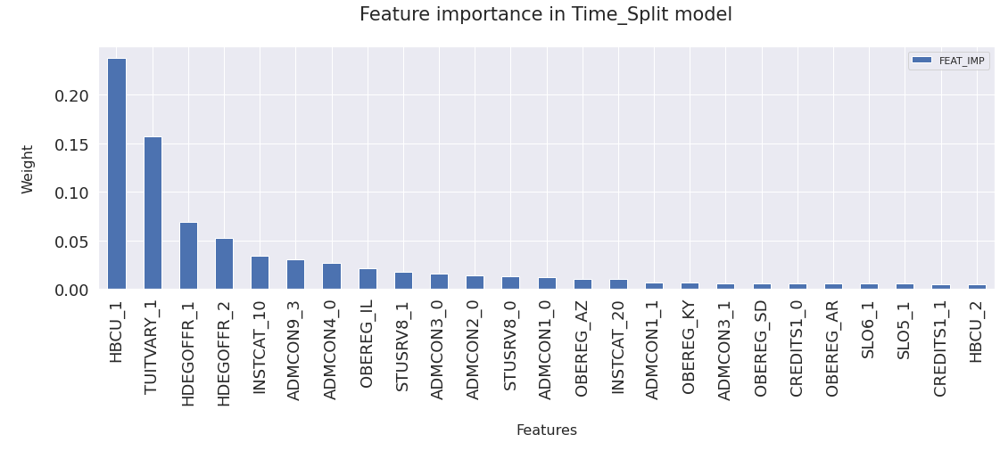

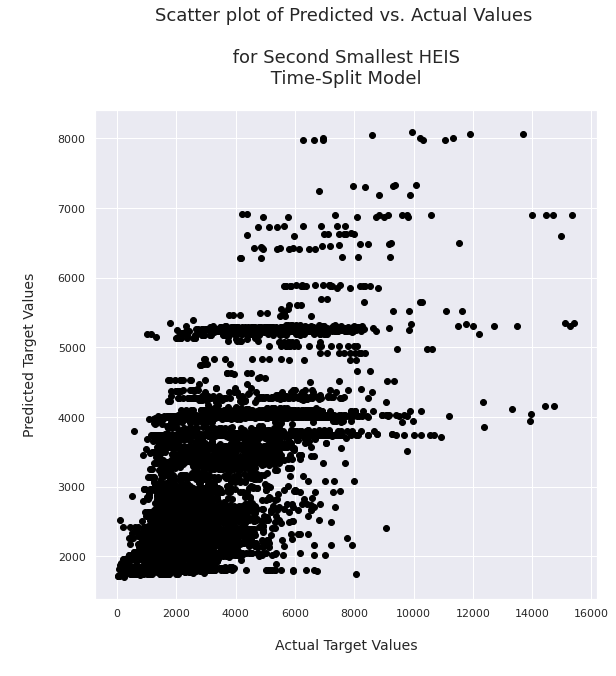

In [135]:
# https://towardsdatascience.com/an-introduction-to-logistic-regression-for-categorical-data-analysis-7cabc551546c
# https://medium.com/@curryrowan/simplified-logistic-regression-classification-with-categorical-variables-in-python-1ce50c4b137

# SAT_ENROL and ACT_ENROL CODES:
# 0 = none
# 1 = less than 10%
# 2 = between 10 and 20%
# 3 = between 20% and 30%
# 4 = between 30% and 40%
# 5 =  greater than 40%

from sklearn.model_selection import TimeSeriesSplit

X = df_2nd_SMALL_1.iloc[:, :-2].values
y = df_2nd_SMALL_1.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  
# # 'YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE','INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
#   'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2','STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
#   'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5','DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
#   'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL', 'EFYTOTLT','HIGH_ENROL'

  X_test.set_axis(['YEAR', 'OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HDEGOFFR','HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)

  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['OBEREG', 'STABBR','LOCALE','CNTLAFFI','INSTCAT','HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  scaler = ColumnTransformer(
      transformers=[
          ("num", numeric_transformer, numeric_features),
          ("cat", categorical_transformer, categorical_features)
      ]
  )

  scaler_y = RobustScaler()

  model_xgboost = XGBRFRegressor(learning_rate= 1, max_depth= 5, n_estimators=100, subsample=0.7, colsample_bynode=0.8)

# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.
  clf = Pipeline(
      steps=[("preprocessor", scaler),("out_prep", scaler_y), ("regressor", model_xgboost)]
  )

  # clf.info()
  clf.fit(X_train, y_train)
  # 
  # Model Performance on training data AND on testing data
  scores_accuracy_train = clf.score(X_train, y_train)
  print("\nTraining Data Model Accuracy \n(R-squared for Training Data): %.2f%%\n" % (scores_accuracy_train*100))
  scores_accuracy_test = clf.score(X_test, y_test)
  print("Testing Data Model Accuracy \n(R-squared for Testing Data): %.2f%%\n" % (scores_accuracy_test*100))

  y_test_scaled_predicted = clf.predict(X_test)

  y_train_scaled_predicted = clf.predict(X_train)

  feature_importance()


  # print("\nR-Squared (test data): ", round((r2_score(y_test, y_test_scaled_predicted)*100), 2), '%\n')
  # print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")

  print("Mean absolute error (MAE) (train data): ", round((mean_absolute_error(y_train, y_train_scaled_predicted)), 2), '')
  print("Mean squared error (MSE) (train data): ", round((mean_squared_error(y_train, y_train_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (train data): ", round((np.sqrt(mean_squared_error(y_train, y_train_scaled_predicted))), 2),'\n')
  
  print("Mean absolute error (MAE) (test data): ", round((mean_absolute_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Mean squared error (MSE) (test data): ", round((mean_squared_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (test data): ", round((np.sqrt(mean_squared_error(y_test, y_test_scaled_predicted))), 2),'\n')

  # print("The larger value of the MSE on the test dataset the more problematic is the model's performance (Overfitting)\n\n")

  # print("R-Squared (train data): ", round((r2_score(y_train, y_train_scaled_predicted)*100), 2), '%\n')

  sns.set(rc = {'figure.figsize':(9,9)})

  fig, ax = plt.subplots()
  ax.scatter(y_train, y_train_scaled_predicted,  color='black')
  ax.set_title("Scatter plot of Predicted vs. Actual Values \n \n for Second Smallest HEIS \n Time-Split Model \n", fontsize=18)
  ax.set_xlabel("\nActual Target Values\n", fontsize=14)
  ax.set_ylabel("\nPredicted Target Values\n", fontsize=14)
  # plt.add_artist(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.line(xy1=(0, 0), slope=1, color='r', lw=2)
  # plt.lines.Line2D((0, 0), (1, 1), linewidth=4, color='r')
  # ax.Axes.axline(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.axline([0, 0], [1, 1], linewidth=4, color='r')
  plt.show()


  i = i+1

In [136]:
df_SMALL_1=df_SMALL.copy(deep=False)
df_SMALL_1.drop(['UNITID','INSTSIZE'], axis=1, inplace=True) #'INSTCAT','HDEGOFFR','HBCU'


Observations n: 2365 split n: 1

Training Observations: 1185 
Training Predictions: 1185

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 38.29%

Testing Data Model Accuracy 
(R-squared for Testing Data): 12.36%

Mean absolute error (MAE) (train data):  259.53 
Mean squared error (MSE) (train data):  110948.43 
Root Mean squared error (RMSE) (train data):  333.09 

Mean absolute error (MAE) (test data):  297.27 
Mean squared error (MSE) (test data):  245045.76 
Root Mean squared error (RMSE) (test data):  495.02 



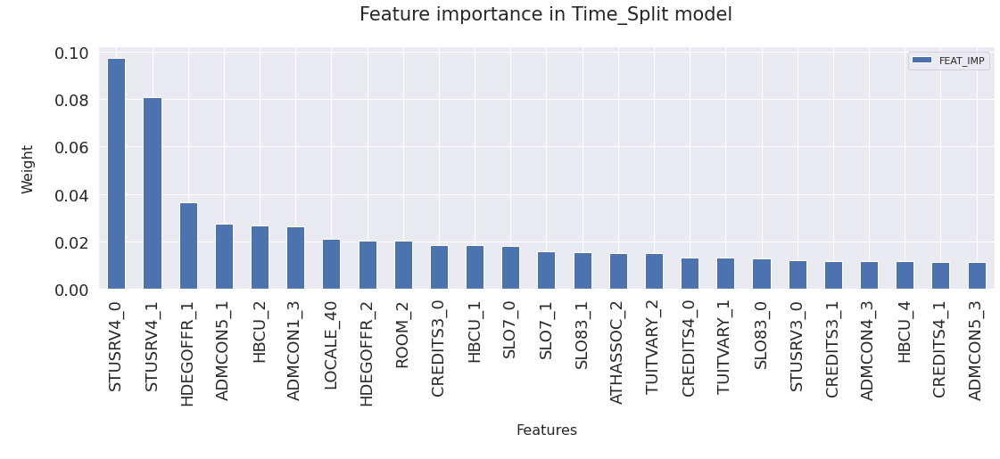

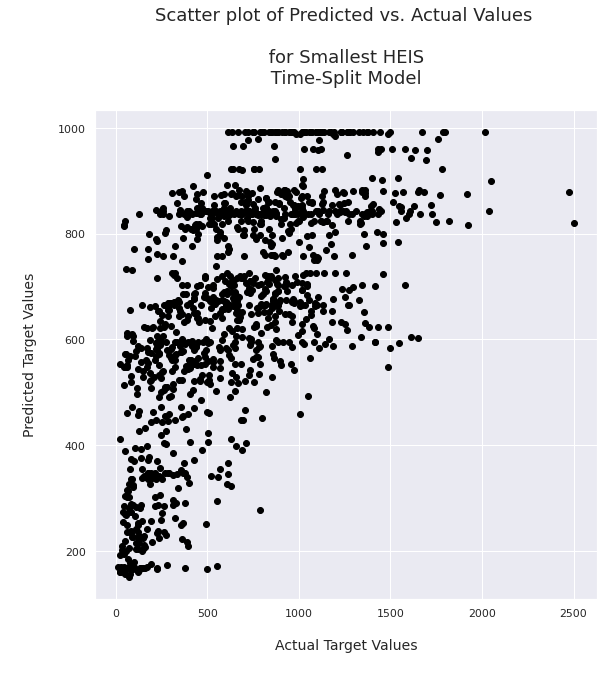


Observations n: 3545 split n: 2

Training Observations: 2365 
Training Predictions: 2365

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 32.32%

Testing Data Model Accuracy 
(R-squared for Testing Data): 17.56%

Mean absolute error (MAE) (train data):  271.94 
Mean squared error (MSE) (train data):  156061.38 
Root Mean squared error (RMSE) (train data):  395.05 

Mean absolute error (MAE) (test data):  285.04 
Mean squared error (MSE) (test data):  129457.56 
Root Mean squared error (RMSE) (test data):  359.8 



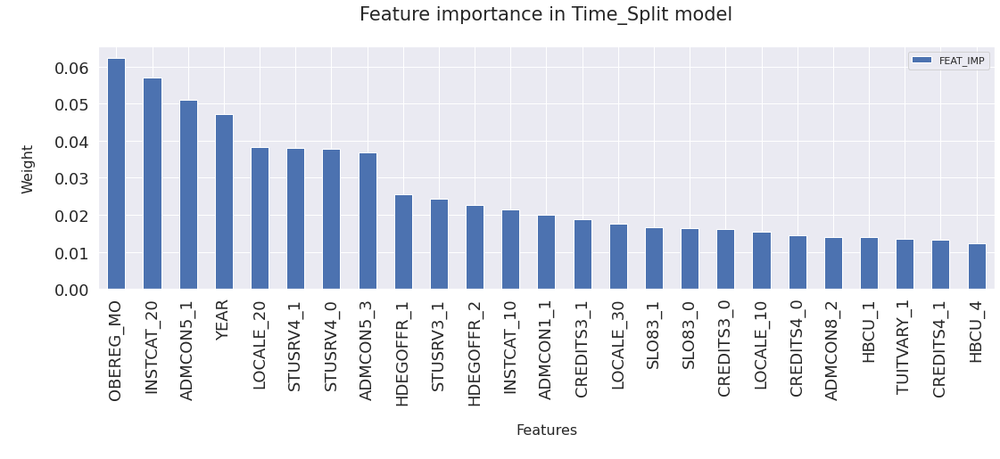

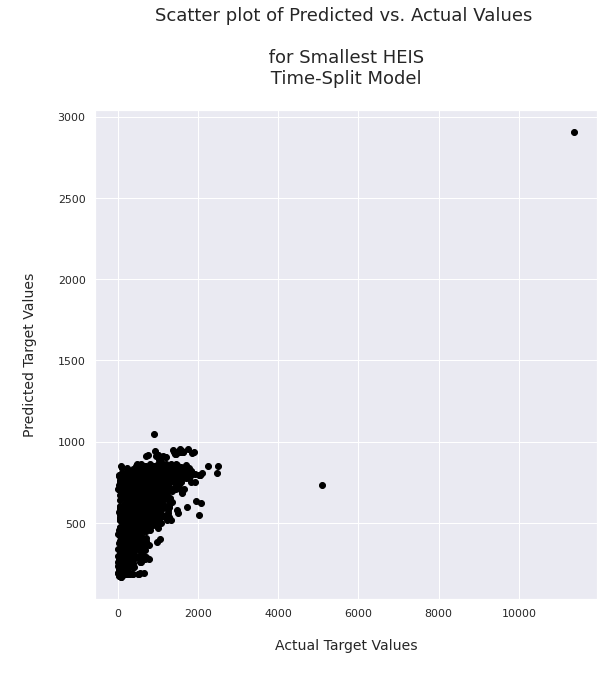


Observations n: 4725 split n: 3

Training Observations: 3545 
Training Predictions: 3545

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 29.80%

Testing Data Model Accuracy 
(R-squared for Testing Data): 20.52%

Mean absolute error (MAE) (train data):  274.97 
Mean squared error (MSE) (train data):  145324.32 
Root Mean squared error (RMSE) (train data):  381.21 

Mean absolute error (MAE) (test data):  280.38 
Mean squared error (MSE) (test data):  123403.36 
Root Mean squared error (RMSE) (test data):  351.29 



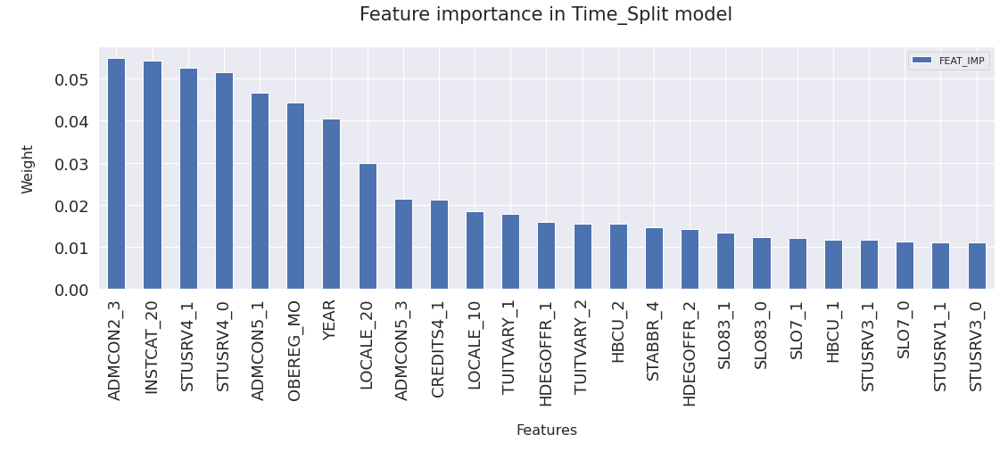

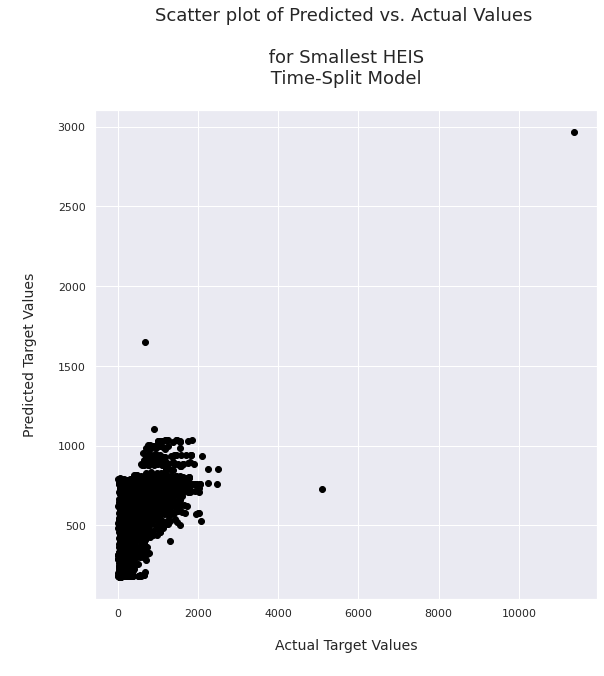


Observations n: 5905 split n: 4

Training Observations: 4725 
Training Predictions: 4725

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:39] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 28.02%

Testing Data Model Accuracy 
(R-squared for Testing Data): 23.00%

Mean absolute error (MAE) (train data):  275.81 
Mean squared error (MSE) (train data):  139797.02 
Root Mean squared error (RMSE) (train data):  373.89 

Mean absolute error (MAE) (test data):  270.43 
Mean squared error (MSE) (test data):  121850.64 
Root Mean squared error (RMSE) (test data):  349.07 



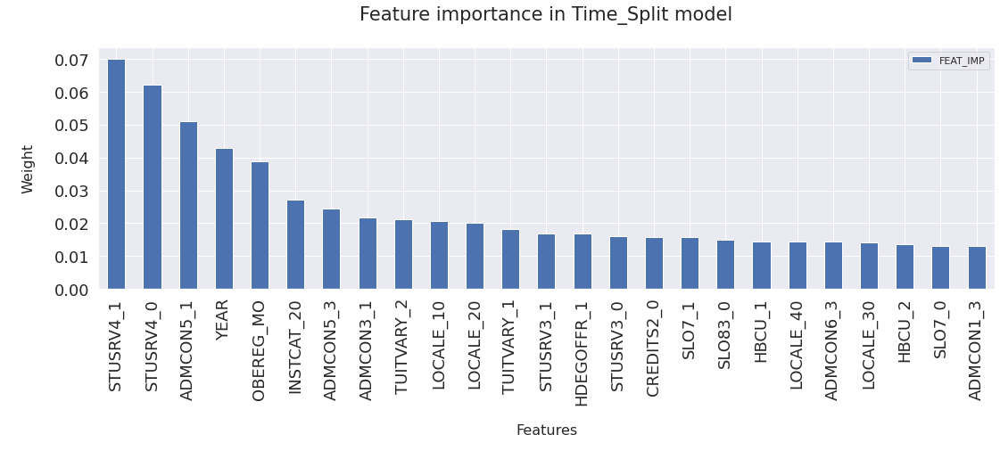

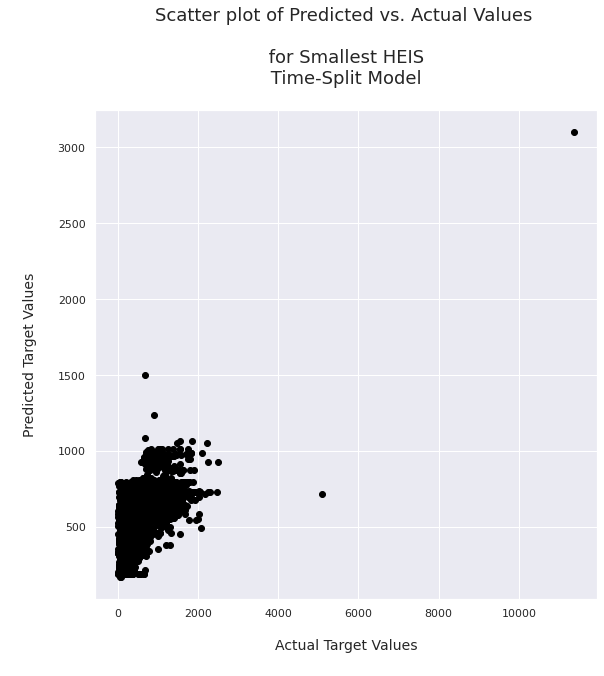


Observations n: 7085 split n: 5

Training Observations: 5905 
Training Predictions: 5905

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:43] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 25.54%

Testing Data Model Accuracy 
(R-squared for Testing Data): 24.78%

Mean absolute error (MAE) (train data):  276.59 
Mean squared error (MSE) (train data):  139411.2 
Root Mean squared error (RMSE) (train data):  373.38 

Mean absolute error (MAE) (test data):  268.73 
Mean squared error (MSE) (test data):  116684.83 
Root Mean squared error (RMSE) (test data):  341.59 



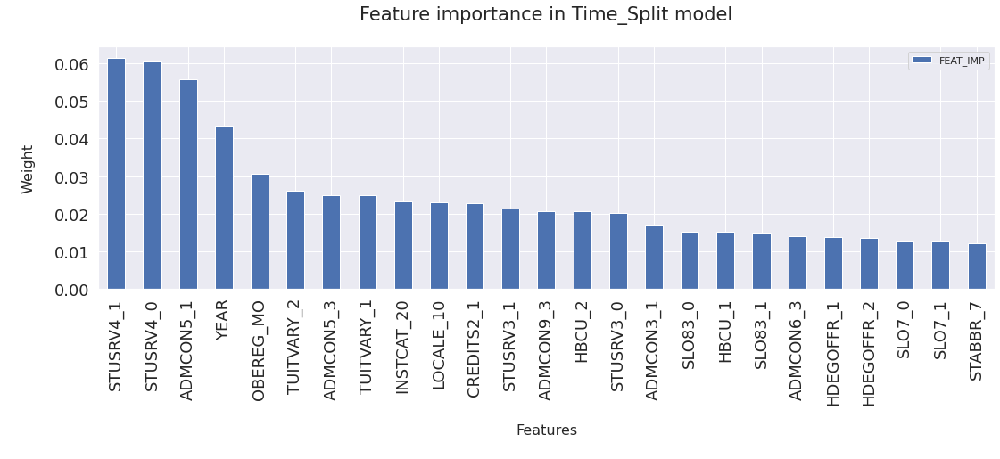

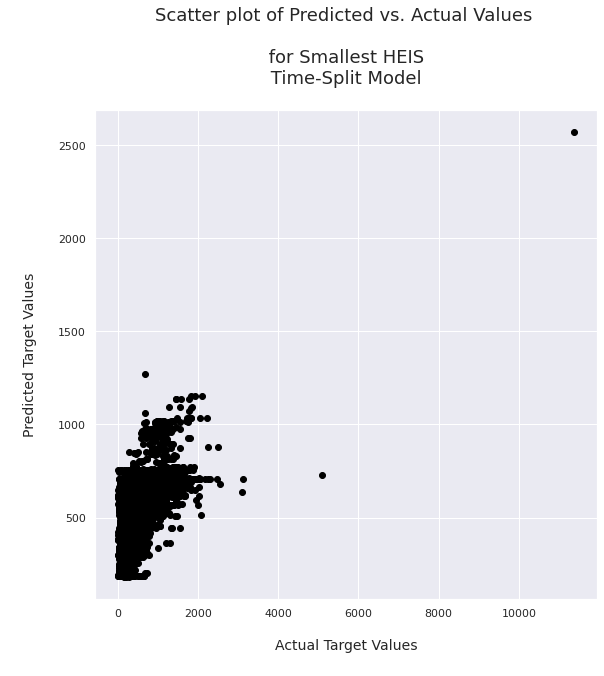


Observations n: 8265 split n: 6

Training Observations: 7085 
Training Predictions: 7085

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:46] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 24.26%

Testing Data Model Accuracy 
(R-squared for Testing Data): 24.65%

Mean absolute error (MAE) (train data):  275.15 
Mean squared error (MSE) (train data):  138186.83 
Root Mean squared error (RMSE) (train data):  371.73 

Mean absolute error (MAE) (test data):  270.07 
Mean squared error (MSE) (test data):  114999.11 
Root Mean squared error (RMSE) (test data):  339.12 



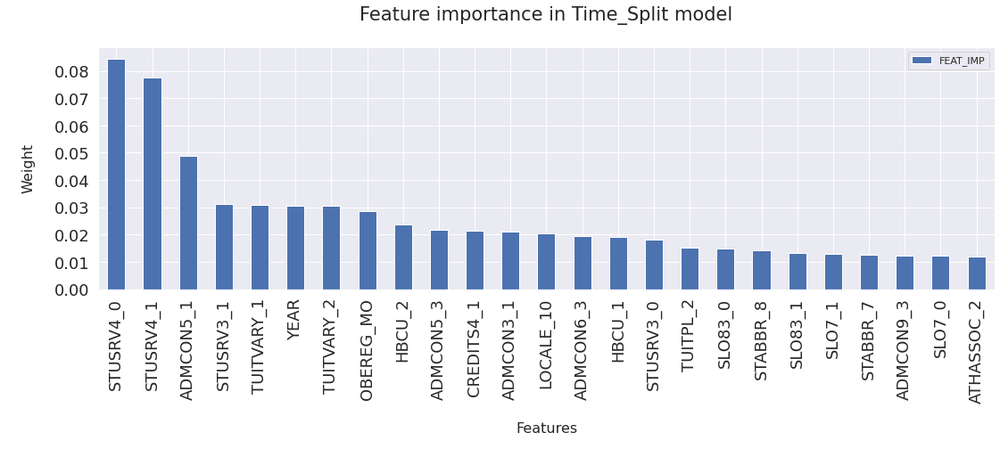

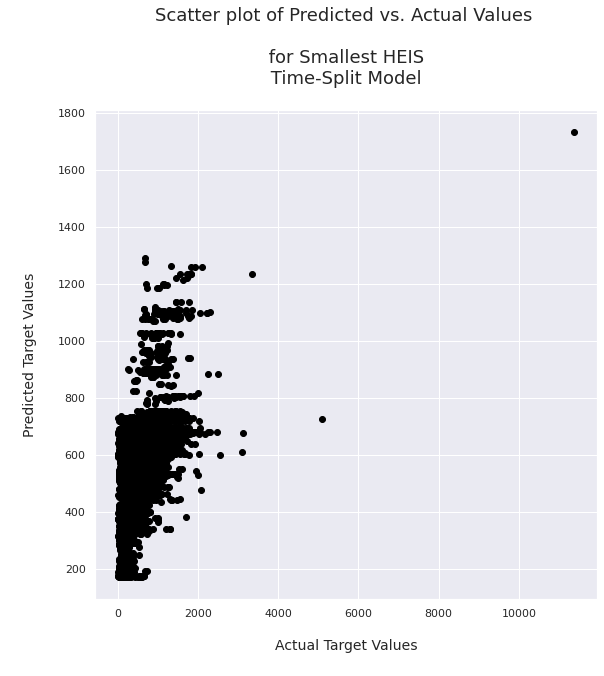


Observations n: 9445 split n: 7

Training Observations: 8265 
Training Predictions: 8265

Testing Observations: 1180 
Testing Predictions: 1180
[19:58:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 24.50%

Testing Data Model Accuracy 
(R-squared for Testing Data): 26.80%

Mean absolute error (MAE) (train data):  271.85 
Mean squared error (MSE) (train data):  134884.03 
Root Mean squared error (RMSE) (train data):  367.27 

Mean absolute error (MAE) (test data):  269.26 
Mean squared error (MSE) (test data):  114315.23 
Root Mean squared error (RMSE) (test data):  338.11 



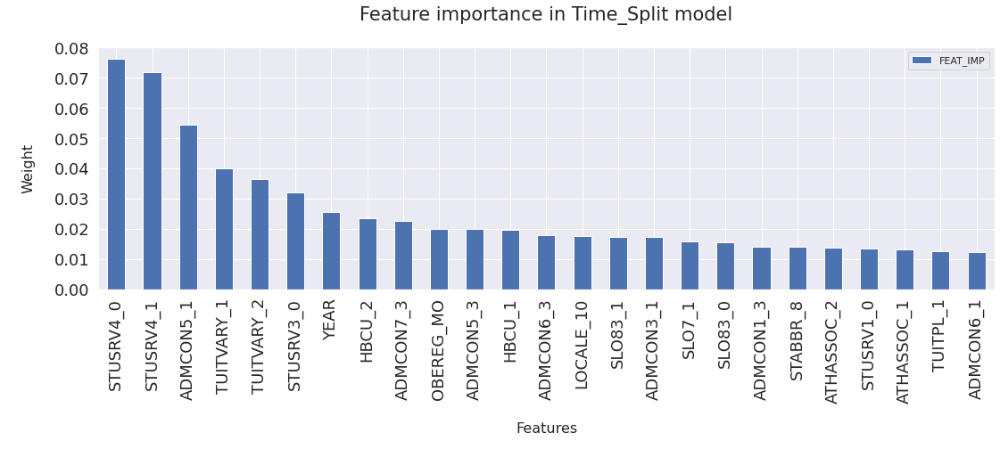

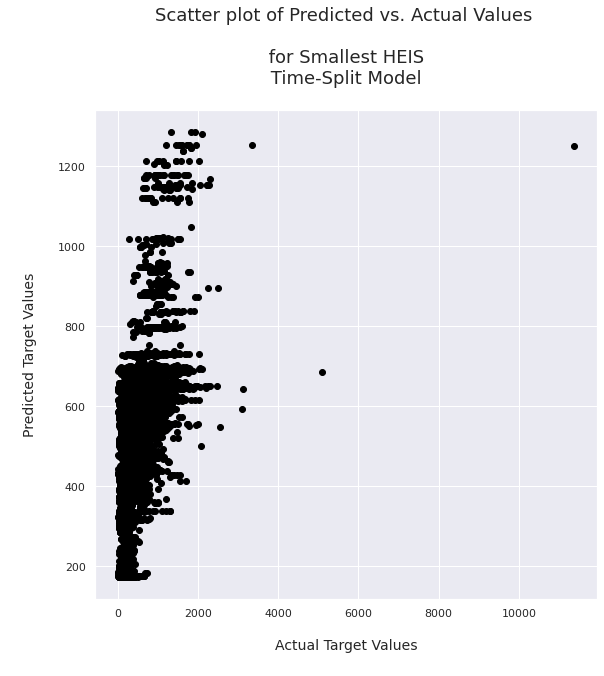


Observations n: 10625 split n: 8

Training Observations: 9445 
Training Predictions: 9445

Testing Observations: 1180 
Testing Predictions: 1180
[19:59:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 25.34%

Testing Data Model Accuracy 
(R-squared for Testing Data): 28.65%

Mean absolute error (MAE) (train data):  269.65 
Mean squared error (MSE) (train data):  131678.85 
Root Mean squared error (RMSE) (train data):  362.88 

Mean absolute error (MAE) (test data):  271.71 
Mean squared error (MSE) (test data):  112695.79 
Root Mean squared error (RMSE) (test data):  335.7 



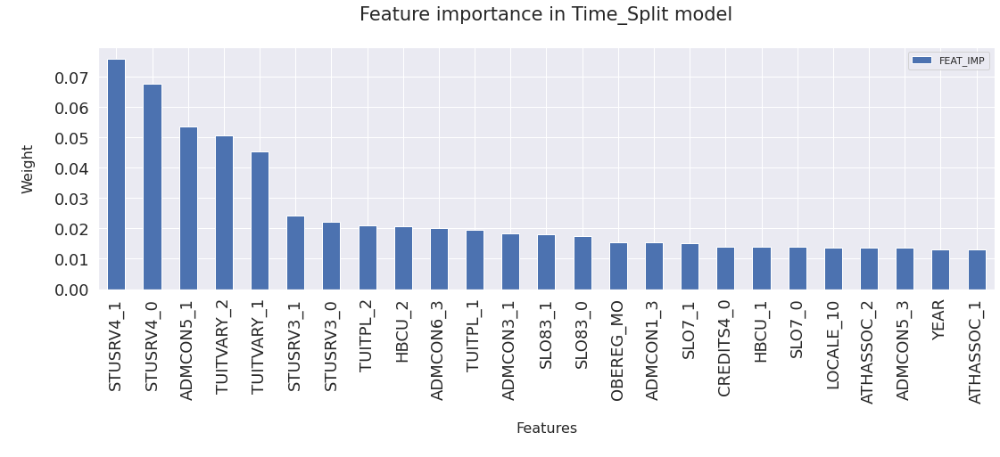

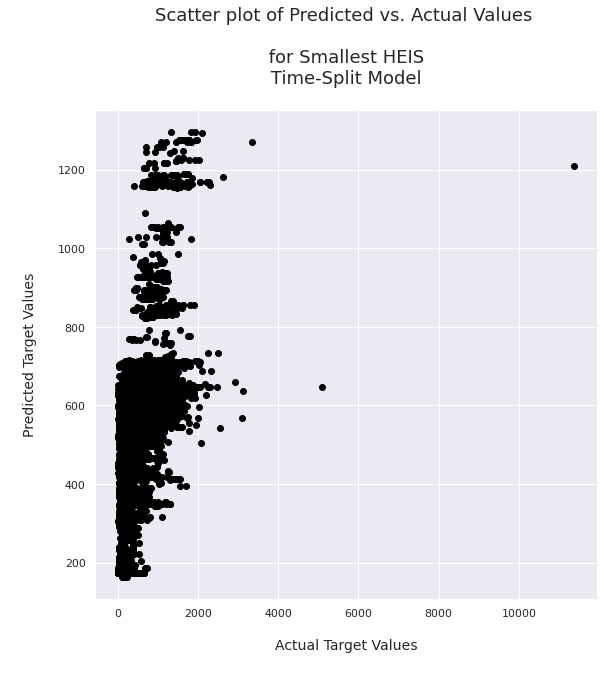


Observations n: 11805 split n: 9

Training Observations: 10625 
Training Predictions: 10625

Testing Observations: 1180 
Testing Predictions: 1180
[19:59:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training Data Model Accuracy 
(R-squared for Training Data): 26.63%

Testing Data Model Accuracy 
(R-squared for Testing Data): 36.49%

Mean absolute error (MAE) (train data):  267.17 
Mean squared error (MSE) (train data):  128348.99 
Root Mean squared error (RMSE) (train data):  358.26 

Mean absolute error (MAE) (test data):  260.84 
Mean squared error (MSE) (test data):  102313.11 
Root Mean squared error (RMSE) (test data):  319.86 



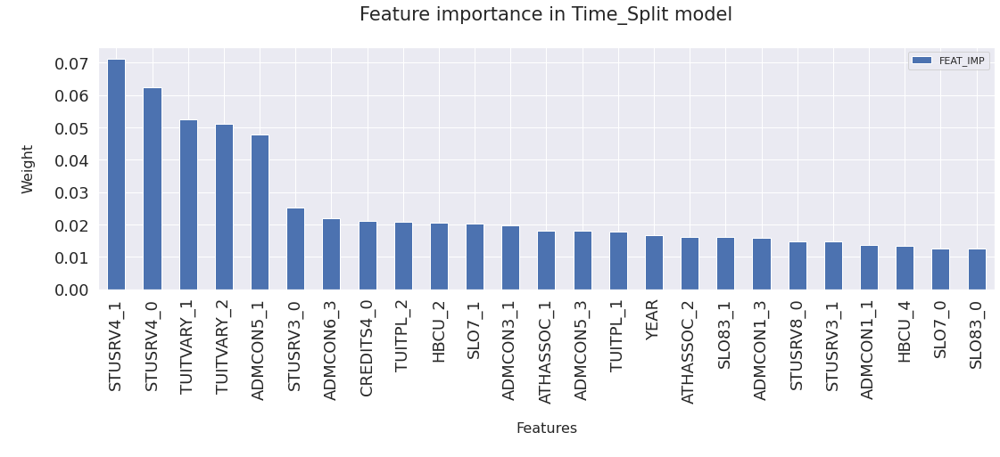

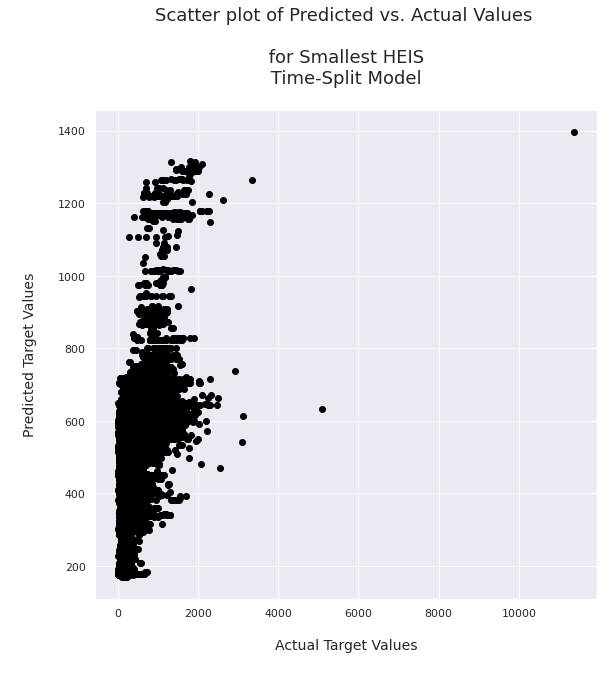

In [137]:
# https://towardsdatascience.com/an-introduction-to-logistic-regression-for-categorical-data-analysis-7cabc551546c
# https://medium.com/@curryrowan/simplified-logistic-regression-classification-with-categorical-variables-in-python-1ce50c4b137

# SAT_ENROL and ACT_ENROL CODES:
# 0 = none
# 1 = less than 10%
# 2 = between 10 and 20%
# 3 = between 20% and 30%
# 4 = between 30% and 40%
# 5 =  greater than 40%

from sklearn.model_selection import TimeSeriesSplit

X = df_SMALL_1.iloc[:, :-2].values
y = df_SMALL_1.iloc[:, -2:-1].values
splits = TimeSeriesSplit(n_splits=9)
i = 1
for train_index, test_index in splits.split(X, y):
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]
  print('\nObservations n: %d' % (len(X_train) + len(X_test)), 'split n:', i)
  print('\nTraining Observations: %d' % (len(X_train)), '\nTraining Predictions: %d' % (len(y_train)))
  print('\nTesting Observations: %d' % (len(X_test)), '\nTesting Predictions: %d' % (len(y_test)))
  X_train = pd.DataFrame(X_train)
  y_train = pd.DataFrame(y_train)
  X_test = pd.DataFrame(X_test)
  y_test = pd.DataFrame(y_test)
  X_train.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  
# # 'YEAR', 'STABBR', 'OBEREG', 'HDEGOFFR', 'HBCU', 'LOCALE','INSTCAT', 'INSTSIZE', 'CNTLAFFI', 'CREDITS1', 'CREDITS2', 'CREDITS3',
#   'CREDITS4', 'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2','STUSRV3', 'STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY',
#   'ROOM', 'BOARD', 'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5','DSTNUGC', 'DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4',
#   'ADMCON5', 'ADMCON6', 'ADMCON7', 'ADMCON8', 'ADMCON9', 'SAT_ENROL', 'ACT_ENROL', 'EFYTOTLT','HIGH_ENROL'

  X_test.set_axis(['YEAR', 'OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU','CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                    'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                    'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                    'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL'], axis=1, inplace=True)
  y_train.set_axis(['EFYTOTLT'], axis=1, inplace=True) 
  y_test.set_axis(['EFYTOTLT'], axis=1, inplace=True) 

  X_train[['YEAR']]=X_train[['YEAR']].apply(pd.to_numeric)
  X_test[['YEAR']]=X_test[['YEAR']].apply(pd.to_numeric)
  y_train[['EFYTOTLT']]=y_train[['EFYTOTLT']].apply(pd.to_numeric)
  y_test[['EFYTOTLT']]=y_test[['EFYTOTLT']].apply(pd.to_numeric)

  numeric_features = ['YEAR']
  numeric_transformer = RobustScaler()
  numeric_out =['EFYTOTLT']

  categorical_features = ['OBEREG','STABBR','LOCALE','CNTLAFFI','INSTCAT', 'HDEGOFFR','HBCU', 'CREDITS1', 'CREDITS2', 'CREDITS3', 'CREDITS4',
                          'SLO5', 'SLO6', 'SLO7', 'SLO83', 'STUSRV1', 'STUSRV2', 'STUSRV3','STUSRV4', 'STUSRV8', 'LIBRES1', 'ATHASSOC', 'TUITVARY', 'ROOM','BOARD', 
                          'TUITPL', 'VET1', 'VET2', 'VET3', 'VET4', 'VET5', 'DSTNUGC','DSTNUGP', 'ADMCON1', 'ADMCON2', 'ADMCON3', 'ADMCON4', 'ADMCON5','ADMCON6', 
                          'ADMCON7', 'ADMCON8', 'ADMCON9','SAT_ENROL','ACT_ENROL']
  categorical_transformer = OneHotEncoder(categories='auto', handle_unknown="ignore", sparse=False)

  scaler = ColumnTransformer(
      transformers=[
          ("num", numeric_transformer, numeric_features),
          ("cat", categorical_transformer, categorical_features)
      ]
  )

  scaler_y = RobustScaler()

  model_xgboost = XGBRFRegressor(learning_rate= 1, max_depth= 5, n_estimators=100, subsample=0.7, colsample_bynode=0.8)

# Append classifier to preprocessing pipeline.
# Now we have a full prediction pipeline.
  clf = Pipeline(
      steps=[("preprocessor", scaler),("out_prep", scaler_y), ("regressor", model_xgboost)]
  )

  # clf.info()
  clf.fit(X_train, y_train)
  # 
  # Model Performance on training data AND on testing data
  scores_accuracy_train = clf.score(X_train, y_train)
  print("\nTraining Data Model Accuracy \n(R-squared for Training Data): %.2f%%\n" % (scores_accuracy_train*100))
  scores_accuracy_test = clf.score(X_test, y_test)
  print("Testing Data Model Accuracy \n(R-squared for Testing Data): %.2f%%\n" % (scores_accuracy_test*100))

  y_test_scaled_predicted = clf.predict(X_test)

  y_train_scaled_predicted = clf.predict(X_train)

  feature_importance()


  # print("\nR-Squared (test data): ", round((r2_score(y_test, y_test_scaled_predicted)*100), 2), '%\n')
  # print("\nThe Model Accuracy or R-Squared represents the fraction of response variance captured by the model (a 'standardized' Mean Squared Error) \n\n")

  print("Mean absolute error (MAE) (train data): ", round((mean_absolute_error(y_train, y_train_scaled_predicted)), 2), '')
  print("Mean squared error (MSE) (train data): ", round((mean_squared_error(y_train, y_train_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (train data): ", round((np.sqrt(mean_squared_error(y_train, y_train_scaled_predicted))), 2),'\n')
  
  print("Mean absolute error (MAE) (test data): ", round((mean_absolute_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Mean squared error (MSE) (test data): ", round((mean_squared_error(y_test, y_test_scaled_predicted)), 2),'')
  print("Root Mean squared error (RMSE) (test data): ", round((np.sqrt(mean_squared_error(y_test, y_test_scaled_predicted))), 2),'\n')

  # print("The larger value of the MSE on the test dataset the more problematic is the model's performance (Overfitting)\n\n")

  # print("R-Squared (train data): ", round((r2_score(y_train, y_train_scaled_predicted)*100), 2), '%\n')

  sns.set(rc = {'figure.figsize':(9,9)})

  fig, ax = plt.subplots()
  ax.scatter(y_train, y_train_scaled_predicted,  color='black')
  ax.set_title("Scatter plot of Predicted vs. Actual Values \n \n for Smallest HEIS \n Time-Split Model \n", fontsize=18)
  ax.set_xlabel("\nActual Target Values\n", fontsize=14)
  ax.set_ylabel("\nPredicted Target Values\n", fontsize=14)
  # plt.add_artist(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.line(xy1=(0, 0), slope=1, color='r', lw=2)
  # plt.lines.Line2D((0, 0), (1, 1), linewidth=4, color='r')
  # ax.Axes.axline(lines.Line2D((0, 0), (1, 1), linewidth=4, color='r'))
  # ax.axline([0, 0], [1, 1], linewidth=4, color='r')
  plt.show()

  i = i+1

In [138]:

set_config(display="diagram")
clf


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', RobustScaler(),
                                                  ['YEAR']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse=False),
                                                  ['OBEREG', 'STABBR', 'LOCALE',
                                                   'CNTLAFFI', 'INSTCAT',
                                                   'HDEGOFFR', 'HBCU',
                                                   'CREDITS1', 'CREDITS2',
                                                   'CREDITS3', 'CREDITS4',
                                                   'SLO5', 'SLO6', 'SLO7',
                                                   'SLO83', 'STUSRV1',
                                                   'STUSRV2', 'STUSRV3',
                                                   'STUSRV4', 'STUSRV8',
                                                   'LIBRES1', 'ATHASSOC',
                                                   'TUITVARY', 'ROOM', 'BOARD',
                                                   'TUITPL', 'VET1', 'VET2',
                                                   'VET3', 'VET4', ...])])),
                ('out_prep', RobustScaler()),
                ('regressor', XGBRFRegressor(max_depth=5, subsample=0.7))])